# On neural differential equations in kinetic theory
To take the opportunity to dissect one of the papers that received the Best Paper Award in NeurIPS 2018, with the name *Neural Ordinary Differential Equations*. 

## Relations between differential equations and machine learning?

*A differential equation is a way to specify an arbitrary nonlinear transform by mathematically encoding prior structural assumptions.*
Let's unpack that statement a bit. 
Basically there are three common ways to define a nonlinear transform: 
1. direct modeling: directly writing down the nonlinear function only works if you know the exact functional form that relates the input to the output.
2. DE: model the evolutions of correlated variables
3. ML: a new way to do nonlinear transform

With trainings, we attempt to adjust the parameters of ML so that it generates accurate predictions (i.e., produce $ys$ for novel inputs $x$). This is just a nonlinear transformation $y=ML(x)$. The reason ML is interesting is because its form is basic but adapts to the data itself. For example, a simple neural network (in design matrix form) with sigmoid activation functions is simply matrix multiplications followed by application of sigmoid functions. Specifically,
$$
ML(x)=\sigma(W_{3}\cdot\sigma(W_{2}\cdot\sigma(W_{1}\cdot x)))
$$
with $W=(W_1,W_2,W_3)$ being learnable parameters. You then choose $W$ such that $ML(x)=y$ reasonably fits the function you wanted it to fit. The theory and practice of machine learning confirms that this is a good way to learn nonlinearities. It is known that the *Universal Approximation Theorem* states that, for enough layers or enough parameters (i.e. sufficiently large $W$ matrices), ML(x) can approximate any nonlinear function sufficiently close (subject to common constraints).

## From sequences of transformations to neural differential equations

The neural ordinary differential equation is one of many ways to put these two subjects together. The simplest way of explaining it is that, instead of learning the nonlinear transformation directly, we wish to learn the structures of the nonlinear transformation. Thus instead of doing $y=ML(x)$, we put the machine learning model on the derivative, $y'(x) = ML(x)$, and then solve the ODE. 
But why we would like to do this?


Today, many neural network architectures such as residual networks and recurrent neural
network decoders (RNNs), contain repeating blocks of layers that have the ability to retain sequential information as well as change it in every step through a learned function. Such networks may in general be described by the equation
$$
\mathbf{h}_{t+1}=\mathbf{h}_{t}+f\left(\mathbf{h}_{t}, \theta_{t}\right)
$$
Hereby, $h_t$ is the “hidden” information at timestep $t$, and $f(h_t, \theta_t)$ is the learned function of the current hidden information and parameters $\theta_t$. It's natural to imagine this as gradually increasing the number of residual layers in a residual network. If we do this we will eventually arrive at an infinitesimal (differential) version of the above equation
$$
\frac{d \mathbf{h}(t)}{d t}=f(\mathbf{h}(t), t, \theta)
$$
By solving the above ODE, we arrive at the desired sequence of hidden states.
We will have to solve the equation during each evaluation, beginning with an initial state $h_0$, forming an initial value problem.

A possible application of neural ODE may go to the approximation of differential operator with strong nonlinearity.
For example, let's consider the Boltzmann equation
$$
\frac{D f}{Dt}=
\int_{\mathscr{R}^{3}} \int_{\mathscr{S}^{2}} \Theta g\left[f\left(\mathbf{u}^{\prime}\right) f\left(\mathbf{u}_{1}^{\prime}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \Omega d \mathbf{u}_{1}
$$
where the LHS is full derivatives of distribution function along particle trajectory, and the RHS is an integral.
We take this equation as an example to show the application of neural ODE.

First, let's load all the packages that to be used in the computation.

In [1]:
using Revise
using Kinetic
using DifferentialEquations, Flux
using DiffEqFlux, Optim
using Plots, Dates
using FileIO, JLD2

┌ Info: Precompiling Kinetic [82403725-3cee-4f7c-b214-1ce71af4a797]
└ @ Base loading.jl:1273
┌ Info: Precompiling DifferentialEquations [0c46a032-eb83-5123-abaf-570d42b7fbaa]
└ @ Base loading.jl:1273
┌ Info: Precompiling Flux [587475ba-b771-5e3f-ad9e-33799f191a9c]
└ @ Base loading.jl:1273
┌ Info: Precompiling DiffEqFlux [aae7a2af-3d4f-5e19-a356-7da93b79d9d0]
└ @ Base loading.jl:1273
┌ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1273


Then, generate the variables from configuration file.

In [214]:
config = "../code/homogeneous/config.txt"
D = read_dict(config)
for key in keys(D)
    s = Symbol(key)
    @eval $s = $(D[key])
end

case = homogeneous
maxTime = 8
tlen = 9
u0 = -5
u1 = 5
nu = 60
nug = 0
v0 = -5
v1 = 5
nv = 60
nvg = 0
w0 = -5
w1 = 5
nw = 60
nwg = 0
vMeshType = rectangle
nm = 5
knudsen = 1
inK = 0
alpha = 1.0
omega = 0.5
nh = 5



Calculate initial values and parameters needed for evaluating collision operator.

In [215]:
γ = heat_capacity_ratio(inK, 3)
vSpace = VSpace3D(u0, u1, nu, v0, v1, nv, w0, w1, nw, vMeshType)

f0 = Float32.(0.5 * (1/π)^1.5 .* (exp.(-(vSpace.u .- 0.99).^2) .+ exp.(-(vSpace.u .+ 0.99).^2)) .* 
     exp.(-vSpace.v.^2) .* exp.(-vSpace.w.^2)) |> Array
prim0 = conserve_prim(moments_conserve(f0, vSpace.u, vSpace.v, vSpace.w, vSpace.weights), γ)
M0 = Float32.(maxwellian(vSpace.u, vSpace.v, vSpace.w, prim0)) |> Array

mu_ref = ref_vhs_vis(knudsen, alpha, omega)
kn_bzm = hs_boltz_kn(mu_ref, 1.0)
τ = mu_ref * 2. * prim0[end]^(0.5) / prim0[1]

tspan = (0.0, maxTime)
tRange = range(tspan[1], tspan[2], length=tlen)

0.0:1.0:8.0

## Fast spectral method for Boltzmann collision operator

With the rapid progress of computing resources and capabilities, there have been some useful methods to calculate nonlinear Boltzmann collision integral.
In 1989, Goldstein, etc. al employed a fixed Eulerian mesh to evaluate discrete collisional dynamics. 
This method is very intuitive, but since particle velocities pre/post collisions need to fall on the grid points, it has a huge requirement on computational resources.
Bobylev etc. proved that the method of computing resources consumption is about $O(N^7)$, where $N$ is the number of discrete velocity grids used in each direction, and this method possesses only half order convergence, similar to that of DSMC method.


Another thought goes to the fast Fourier transformation (FFT) to solve the collision operator in the spectral space.
In 1988,Bobylev made a preliminary attempt to calculate the Boltzmann equation of Maxwell molecules in a homogeneous flow field.
Later, Paraschi and Perthame extended this method to general collision kernel, with a compuational cost $O(N^6)$.
In 2006, Mouhot and Paraschi developed a fast spectral method based on Carleman-type Boltzmann equation, which holds the spectral accuracy and computational cost $O(M^2N^3logN)$.
It's one of the most efficient Boltzmann collision solver by now. 


We briefly introduce it on the basis of Carleman-type Boltzmann equation,
$$
\begin{aligned}
Q(f) &=\int_{\mathscr{R}^{3}} \int_{\mathscr{S}^{2}} \Theta g\left[f\left(\mathbf{u}^{\prime}\right) f\left(\mathbf{u}_{1}^{\prime}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \Omega d \mathbf{u}_{1} \\
&=\int_{\mathscr{R}^{3}} \int_{\mathscr{S}^{2}} \Theta g\left[f\left(\mathbf{u}+\frac{g \Omega-\mathbf{g}}{2}\right) f\left(\mathbf{u}_{1}-\frac{g \Omega-\mathbf{g}}{2}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \Omega d \mathbf{u}_{1} \\
&=2 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \Theta \delta\left(2 \mathbf{y} \cdot \mathbf{g}+\mathbf{y}^{2}\right)\left[f\left(\mathbf{u}+\frac{\mathbf{y}}{2}\right) f\left(\mathbf{u}_{1}-\frac{\mathbf{y}}{2}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \mathbf{y} d \mathbf{u}_{1} \\
&=4 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \Theta \delta\left(\mathbf{y} \cdot \mathbf{g}+\mathbf{y}^{2}\right)\left[f(\mathbf{u}+\mathbf{y}) f\left(\mathbf{u}_{1}-\mathbf{y}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \mathbf{y} d \mathbf{u}_{1} \\
&=4 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \Theta \delta(\mathbf{y} \cdot \mathbf{z})[f(\mathbf{u}+\mathbf{y}) f(\mathbf{u}+\mathbf{z})-f(\mathbf{u}) f(\mathbf{u}+\mathbf{y}+\mathbf{z})] d \mathbf{y} d \mathbf{z}
\end{aligned}
$$
with $\Theta=\mathscr{B} / g, \mathbf{y}=(g \Omega-\mathbf{g}) / 2, \mathbf{z}=\mathbf{u}_{1}-\mathbf{u}-\mathbf{y}=-\mathbf{g}-\mathbf{y}$.
In the Boltzmann equation, the collision kernel is $\mathscr{B}(\cos \theta, g)=\Theta g$, and $\Theta$ is the differential cross section.
A generalized collision kernel can be defined as
$$
\mathscr{B}=C_{\alpha, \gamma}^{\prime \prime} \sin ^{\alpha+\gamma-1}\left(\frac{\theta}{2}\right) \cos ^{-\gamma}\left(\frac{\theta}{2}\right) g^{\alpha}
$$
with
$$
C_{\alpha, \gamma}^{\prime \prime}=\frac{\Gamma[(7+\alpha) / 2]}{6 \Gamma[(3+\alpha+\gamma) / 2] \Gamma(2-\gamma / 2)} C_{\alpha}
$$
where $C_\alpha$ is a parameter.


In the fast spectral method, we can periodize the particle distribution function in $D_L=[-L,L]^3$, and expand it into Fourier series
$$
\begin{array}{l}
f(\mathbf{u})=\sum_{k=-N / 2}^{N / 2-1} \hat{f}_{k} \exp \left(i \xi_{k} \cdot \mathbf{u}\right) \\
\hat{f}_{k}=\frac{1}{(2 L)^{3}} \int_{D_{L}} f(\mathbf{u}) \exp \left(-i \xi_{k} \cdot \mathbf{u}\right) d \mathbf{u}
\end{array}
$$
with$x_k = k\pi/L$ being frequency component.
The collision operator can also be expanded as
$$
\hat{Q}_{j}=\sum_{l, m=-N_{k} / 2,(l+m=j)}^{N_{k} / 2-1} \hat{f}_{l} \hat{f}_{m}[\beta(l, m)-\beta(m, m)]
$$
with the kernel mode being
$$
\begin{array}{l}
\beta(l, m)=4 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \delta(\mathbf{y} \cdot \mathbf{z}) \Theta \exp \left(i \xi_{l} \cdot \mathbf{y}+i \xi_{m} \cdot \mathbf{z}\right) d \mathbf{y} d \mathbf{z} \\
=\iint \delta\left(\mathbf{e} \cdot \mathbf{e}^{\prime}\right) \Theta\left[\int_{-R}^{R} \rho \exp \left(i \rho \xi_{l} \cdot \mathbf{e}\right) d \rho\right]\left[\int_{-R}^{R} \rho^{\prime} \exp \left(i \rho^{\prime} \xi_{m} \cdot \mathbf{e}^{\prime}\right) d \rho^{\prime}\right] d \mathbf{e} d \mathbf{e}^{\prime} \\
=4 \int\left[\int_{0}^{R} \rho \cos \left(\rho \xi_{l} \cdot \mathbf{e}\right) d \rho\right]\left[\int \delta\left(\mathbf{e} \cdot \mathbf{e}^{\prime}\right) \int_{0}^{R} \rho^{\prime} \Theta \cos \left(\rho^{\prime} \xi_{m} \cdot \mathbf{e}^{\prime}\right) d \rho^{\prime} d \mathbf{e}^{\prime}\right] d \mathbf{e}
\end{array}
$$
The separation of mode $l$ and $m$ can be achieved by numerical quadrature.
Hence, the Boltzmann integral can be evaluated by calcuating convolutions with FFT.

**You may notice the drawbacks of fast spectral method:**
1. NOT intuitive
2. requires high dimensionality of phase space



In [216]:
phi, psi, phipsi = kernel_mode( nm, vSpace.u1, vSpace.v1, vSpace.w1, vSpace.du[1,1,1], vSpace.dv[1,1,1], vSpace.dw[1,1,1],
                                vSpace.nu, vSpace.nv, vSpace.nw, alpha );

Tip 1: intuitive representation

In [213]:
function boltzmann!(df, f::Array{<:Real,3}, p, t)
    Kn, M, phi, psi, phipsi = p
    df .= boltzmann_fft(f, Kn, M, phi, psi, phipsi) # Kinetic.jl
end

function bgk!(df, f::Array{<:Real,3}, p, t)
    g, tau = p
    df .= (g .- f) ./ tau
end

bgk! (generic function with 1 method)

In [217]:
#--- Boltzmann ---#
prob = ODEProblem(boltzmann!, f0, tspan, [kn_bzm, nm, phi, psi, phipsi])
#prob = ODEProblem(bgk!, f0, tspan, [g0, τ])
data_boltz = solve(prob, Tsit5(), saveat=tRange) |> Array;

In [218]:
#--- BGK ---#
prob1 = ODEProblem(bgk!, f0, tspan, [M0, τ])
data_bgk = solve(prob, Tsit5(), saveat=tRange) |> Array;

Tip 2: dimension reduction

In [219]:
data_boltz_1D = zeros(Float32, axes(data_boltz, 1), axes(data_boltz, 4))
data_bgk_1D = zeros(Float32, axes(data_bgk, 1), axes(data_bgk, 4))
for j in axes(data_boltz_1D, 2), i in axes(data_boltz_1D, 1)
    data_boltz_1D[i,j] = sum(@. vSpace.weights[i,:,:] * data_boltz[i,:,:,j])
    data_bgk_1D[i,j] = sum(@. vSpace.weights[i,:,:] * data_bgk[i,:,:,j])
end

f0_1D = zeros(Float32, axes(f0, 1))
for i in axes(data_boltz_1D, 1)
    f0_1D[i] = sum(@. vSpace.weights[i,:,:] * f0[i,:,:])
end

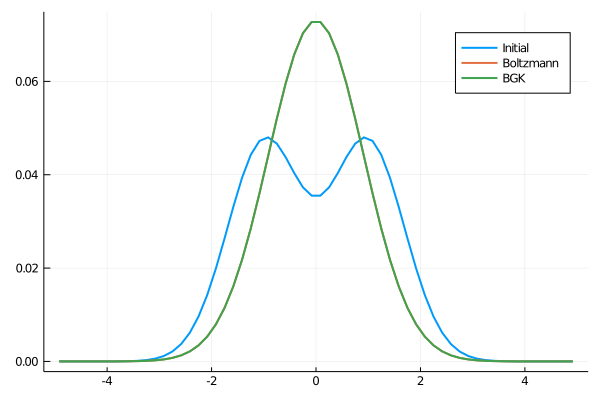

In [230]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,1], lw=2, label="Initial")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,end], lw=2, label="Boltzmann")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_bgk_1D[:,end], lw=2, label="BGK")

Then, let's construct our neural ODE.

In [221]:
#--- neural ode ---#
dudt = FastChain( (x, p) -> x.^2, # initial guess
                   FastDense(vSpace.nu, vSpace.nu*nh, tanh), # our 1-layer network
                   FastDense(vSpace.nu*nh, vSpace.nu) )
n_ode = NeuralODE(dudt, tspan, Tsit5(), saveat=tRange)

function loss_n_ode(p)
    pred = n_ode(f0_1D, p)
    loss = sum(abs2, pred .- data_boltz_1D)
    return loss, pred
end

cb = function (p, l, pred; doplot=true)
    display(l)
    # plot current prediction against dataset
    if doplot
        pl = plot(tRange, data_boltz_1D[vSpace.nu÷2,:], lw=2, label="Exact")
        scatter!(pl, tRange, pred[vSpace.nu÷2,:], lw=2, label="NN prediction")
        display(plot(pl))
    end
    return false
end

#39 (generic function with 1 method)

Do the training with ADAM optimizer

0.07652916f0

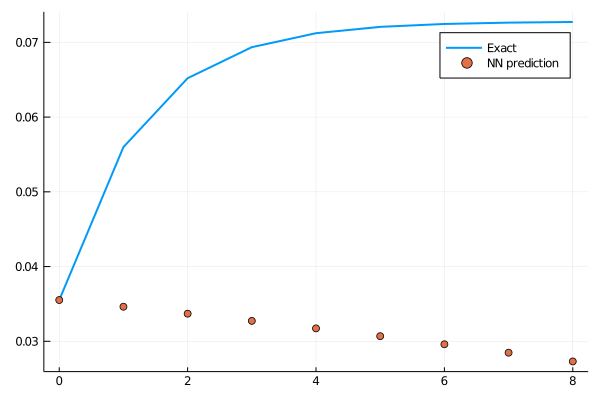

loss: 0.0765:   0%|▏                                        |  ETA: 0:48:58

0.053827994f0

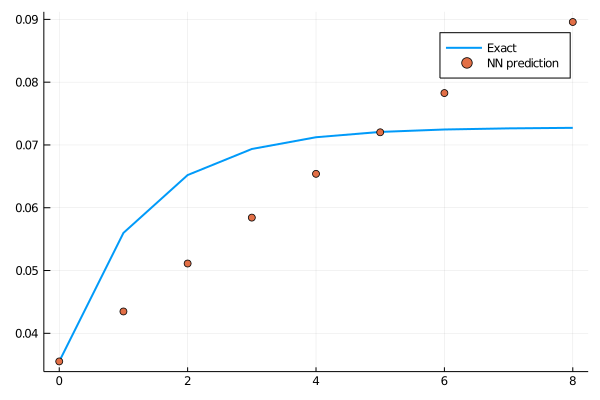

loss: 0.0538:   1%|▎                                        |  ETA: 0:24:47

0.040408682f0

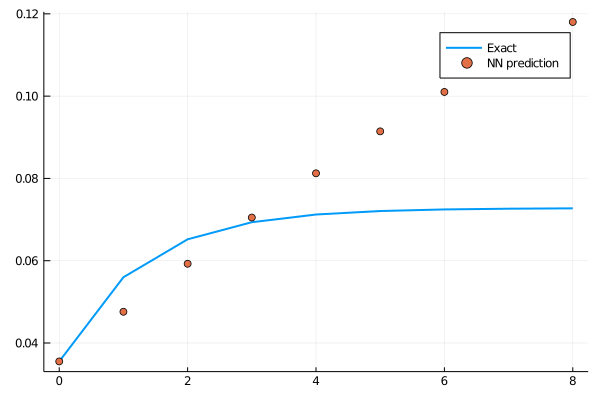

loss: 0.0404:   1%|▍                                        |  ETA: 0:15:02

0.041430973f0

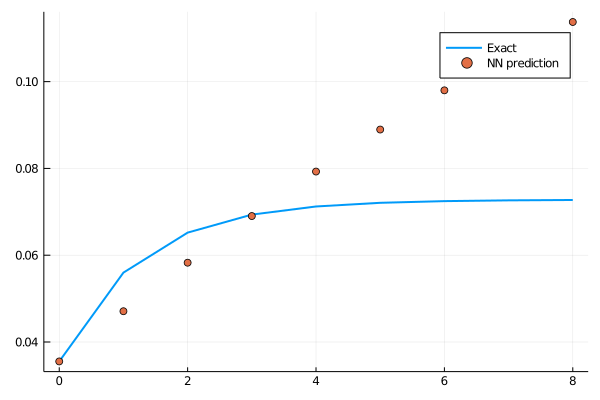

loss: 0.0414:   1%|▌                                        |  ETA: 0:11:41

0.032093365f0

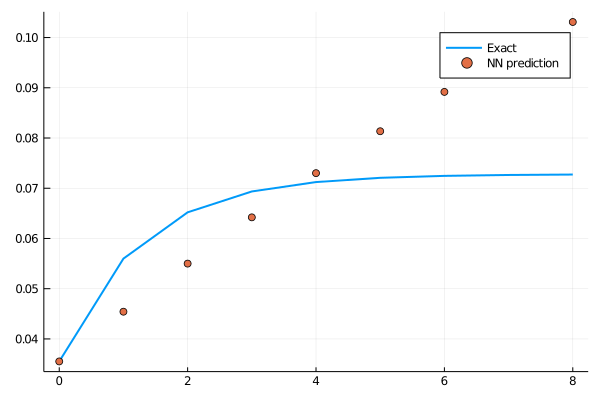

loss: 0.0321:   2%|▋                                        |  ETA: 0:09:36

0.022401031f0

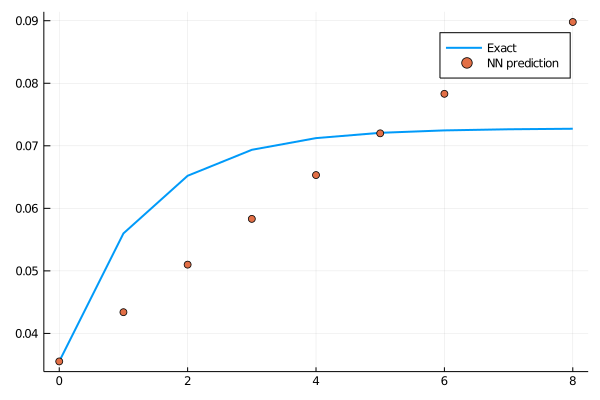

loss: 0.0224:   2%|▉                                        |  ETA: 0:07:48

0.019326605f0

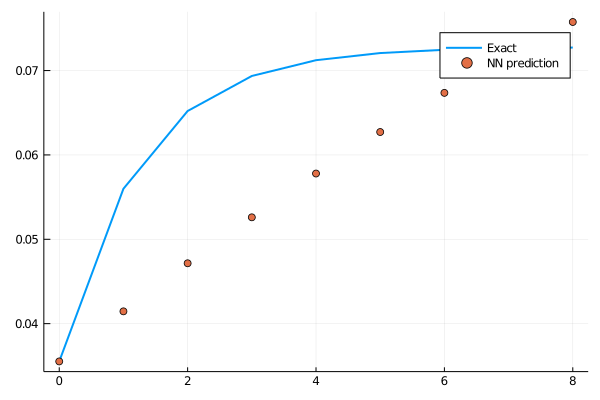

loss: 0.0193:   2%|█                                        |  ETA: 0:06:50

0.018981276f0

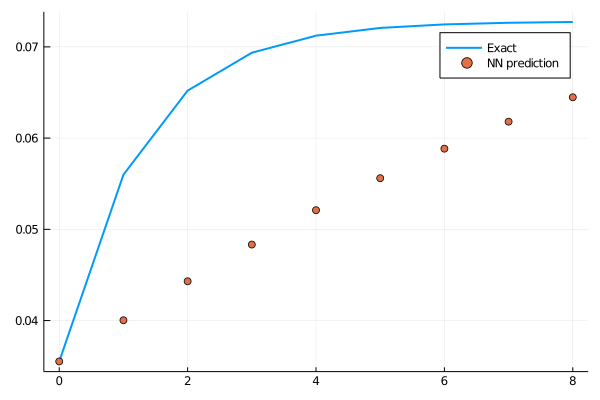

loss: 0.019:   3%|█▏                                       |  ETA: 0:06:07

0.019850755f0

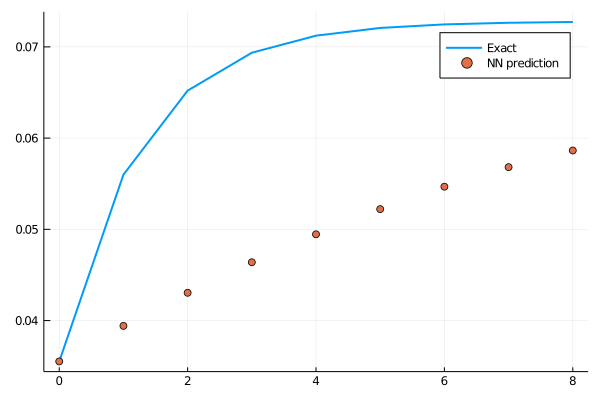

loss: 0.0199:   3%|█▎                                       |  ETA: 0:05:20

0.021014526f0

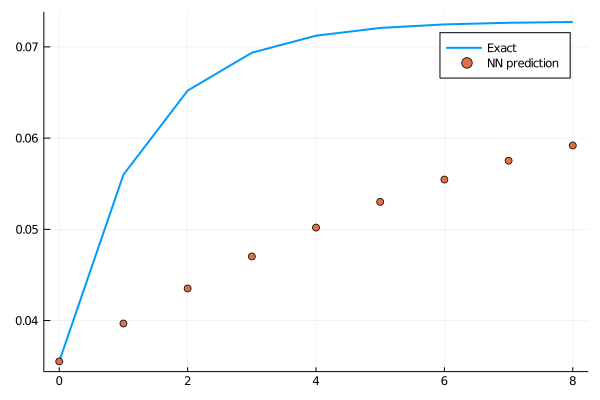

loss: 0.021:   3%|█▍                                       |  ETA: 0:04:54

0.019538429f0

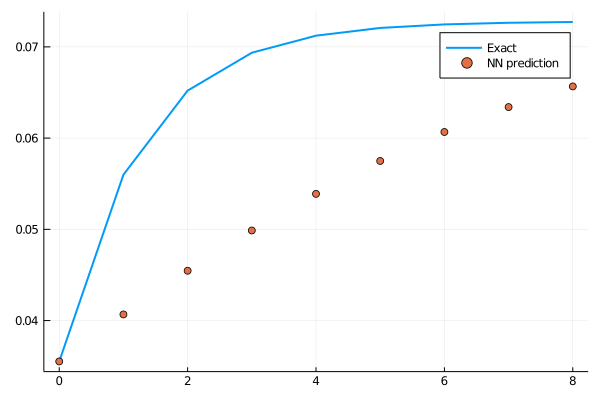

loss: 0.0195:   4%|█▌                                       |  ETA: 0:04:32

0.015333345f0

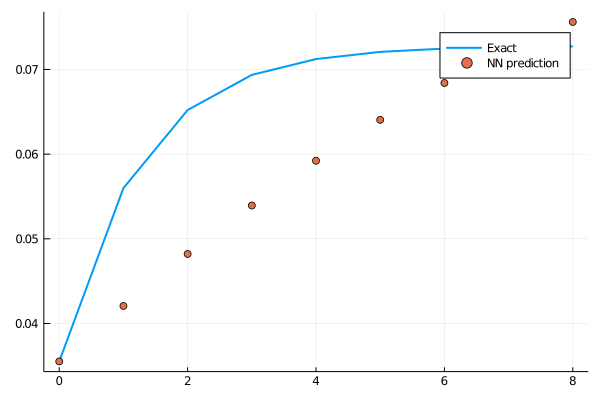

loss: 0.0153:   4%|█▋                                       |  ETA: 0:04:06

0.011372416f0

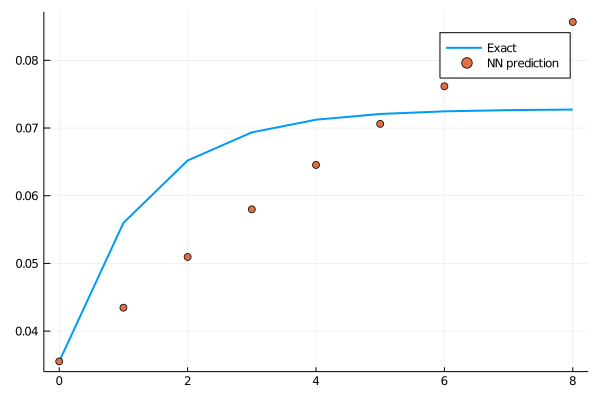

loss: 0.0114:   4%|█▊                                       |  ETA: 0:03:51

0.009773822f0

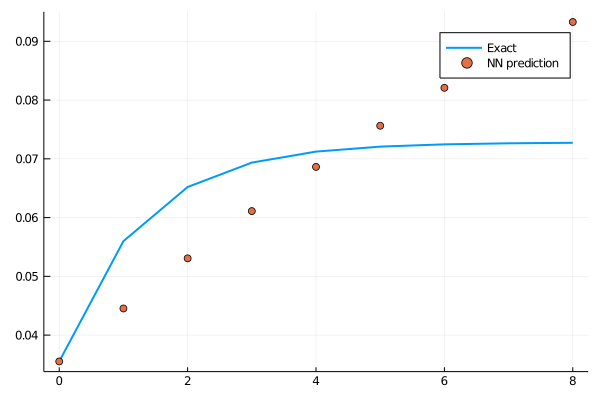

loss: 0.00977:   5%|█▉                                       |  ETA: 0:03:38

0.010645583f0

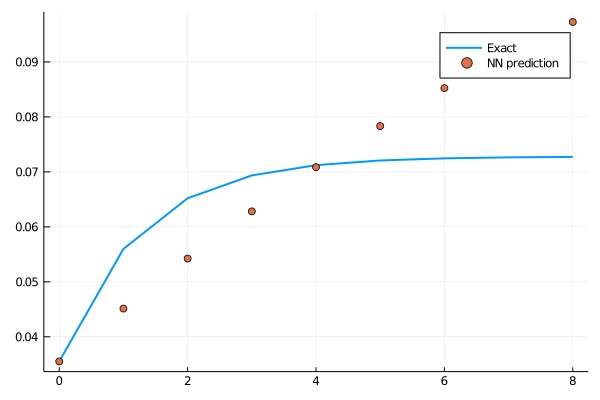

loss: 0.0106:   5%|██                                       |  ETA: 0:03:22

0.012618706f0

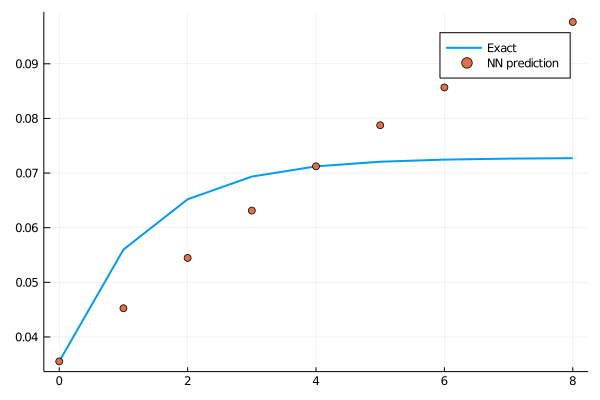

loss: 0.0126:   5%|██▏                                      |  ETA: 0:03:12

0.013766192f0

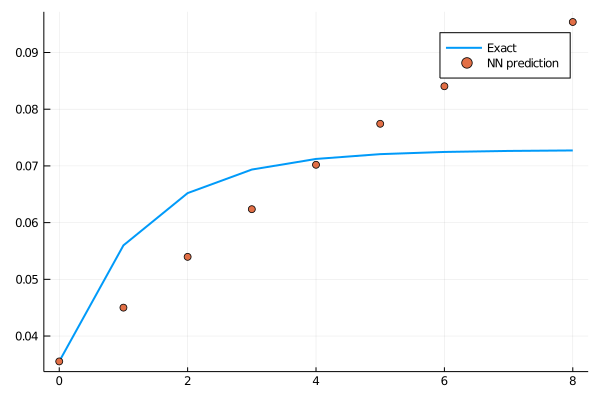

loss: 0.0138:   6%|██▎                                      |  ETA: 0:03:04

0.012922215f0

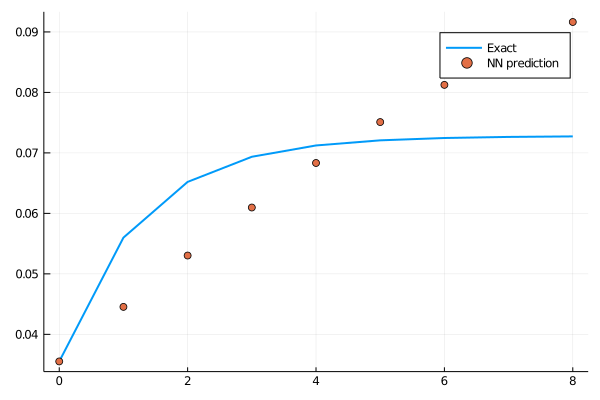

loss: 0.0129:   6%|██▌                                      |  ETA: 0:02:53

0.010521132f0

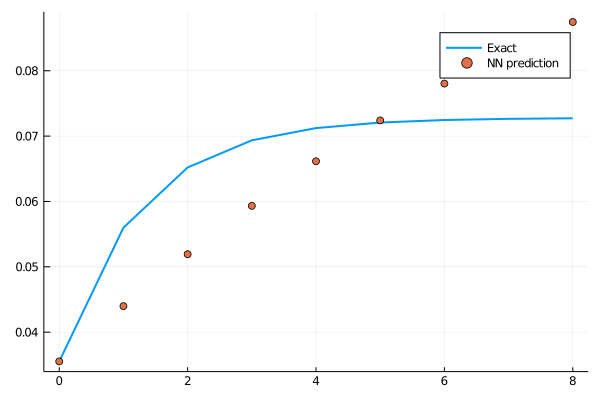

loss: 0.0105:   6%|██▋                                      |  ETA: 0:02:46

0.008128554f0

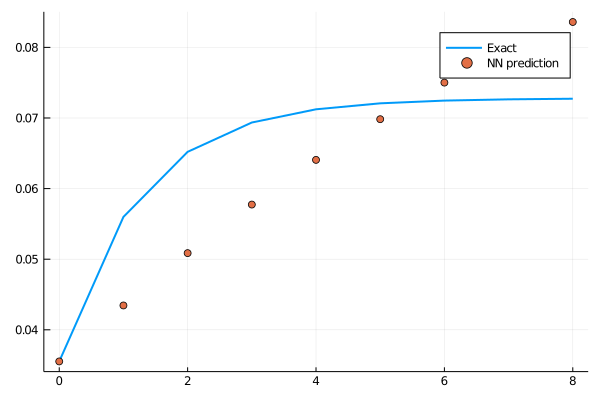

loss: 0.00813:   7%|██▊                                      |  ETA: 0:02:40

0.007033081f0

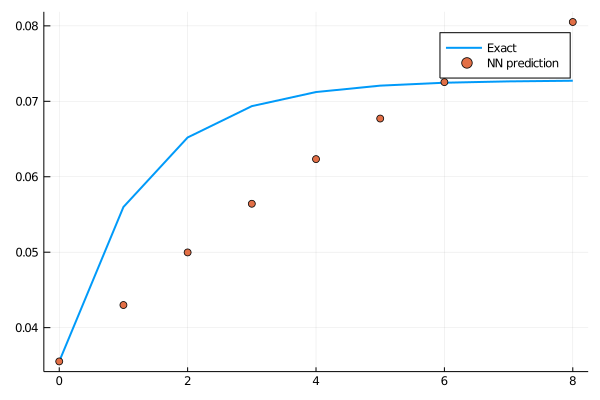

loss: 0.00703:   7%|██▉                                      |  ETA: 0:02:31

0.0074320594f0

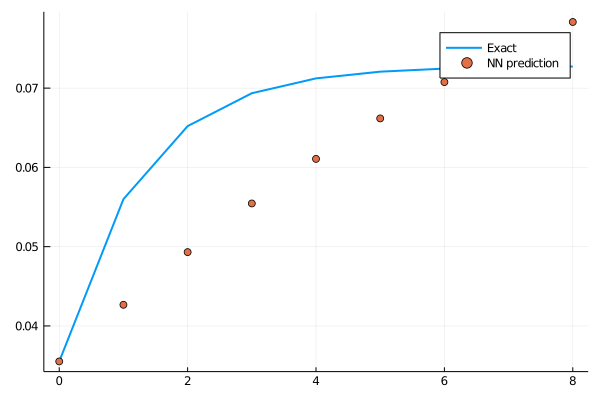

loss: 0.00743:   7%|███                                      |  ETA: 0:02:27

0.008637554f0

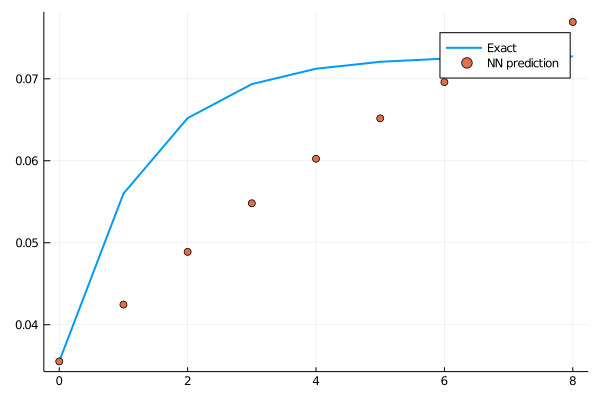

loss: 0.00864:   8%|███▏                                     |  ETA: 0:02:22

0.009552674f0

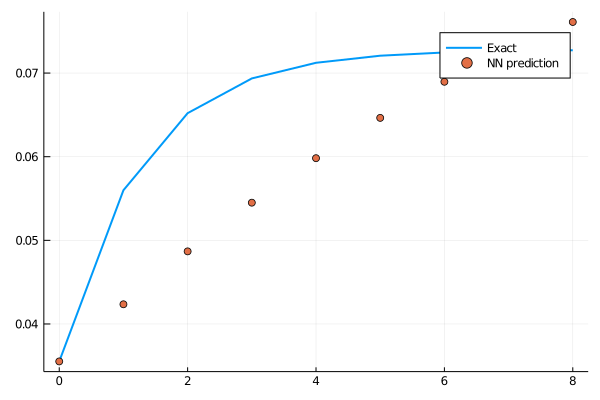

loss: 0.00955:   8%|███▎                                     |  ETA: 0:02:16

0.009414542f0

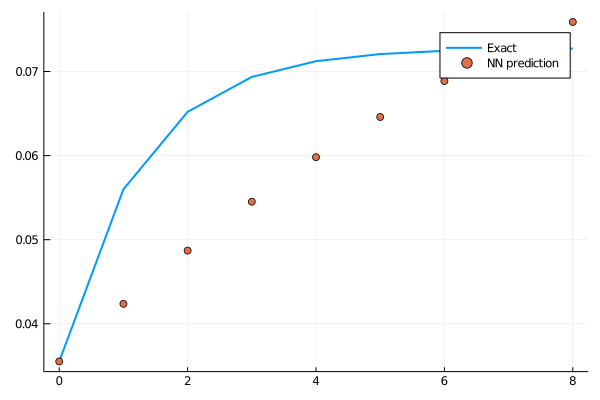

loss: 0.00941:   8%|███▍                                     |  ETA: 0:02:12

0.008370893f0

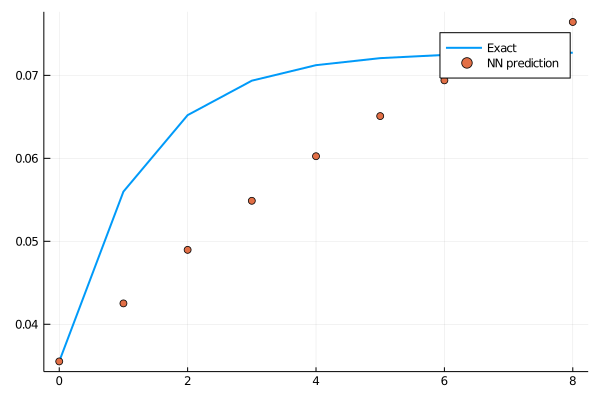

loss: 0.00837:   9%|███▌                                     |  ETA: 0:02:08

0.0071388693f0

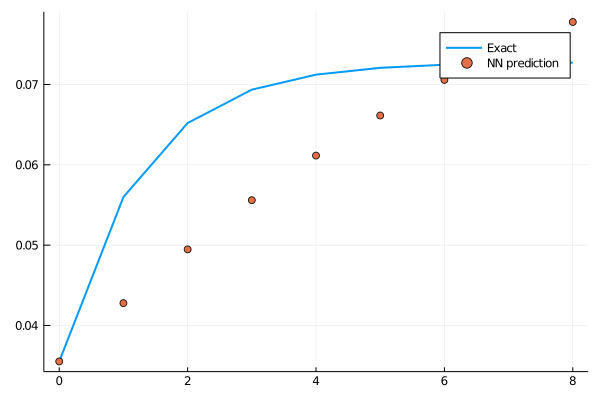

loss: 0.00714:   9%|███▊                                     |  ETA: 0:02:04

0.00632686f0

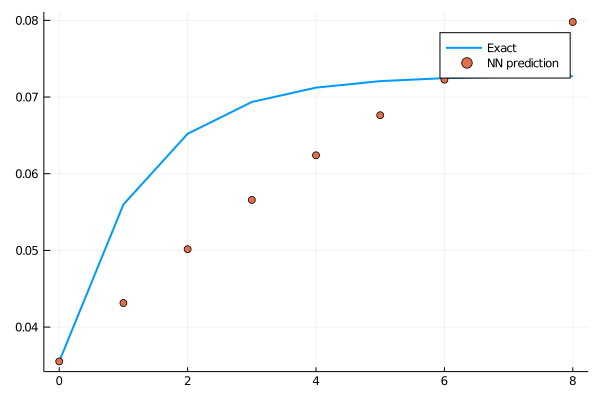

loss: 0.00633:   9%|███▉                                     |  ETA: 0:02:01

0.006155366f0

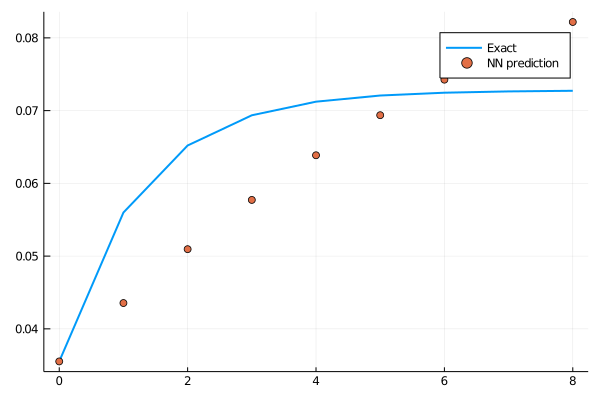

loss: 0.00616:  10%|███▉                                     |  ETA: 0:01:58

0.0065103965f0

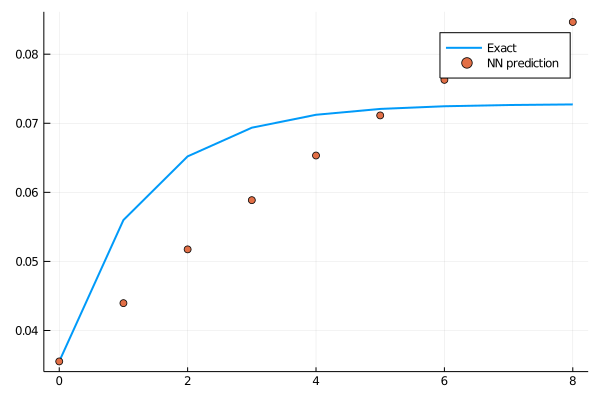

loss: 0.00651:  10%|████▏                                    |  ETA: 0:01:54

0.0070214486f0

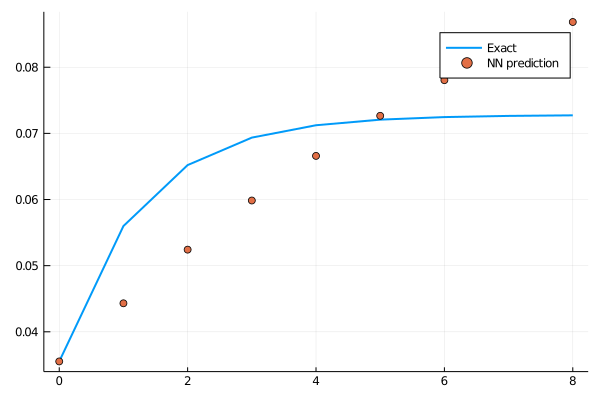

loss: 0.00702:  10%|████▎                                    |  ETA: 0:01:51

0.0072182417f0

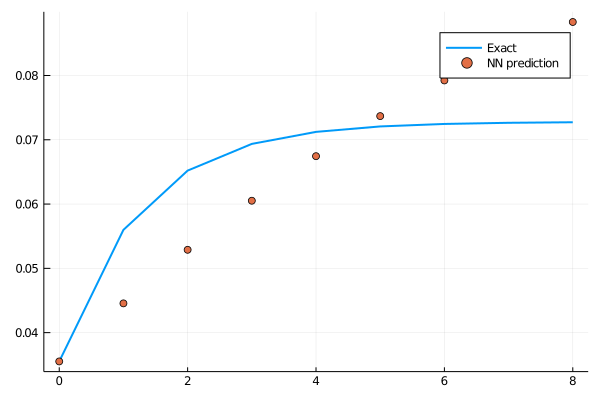

loss: 0.00722:  11%|████▍                                    |  ETA: 0:01:49

0.006905551f0

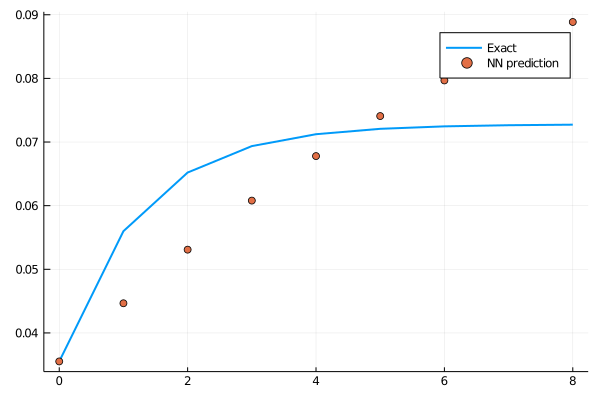

loss: 0.00691:  11%|████▌                                    |  ETA: 0:01:45

0.0063245744f0

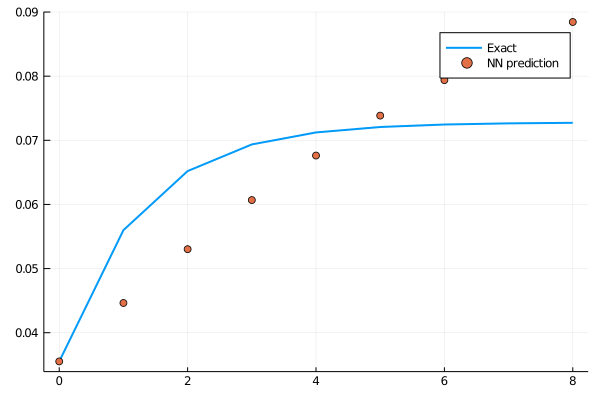

loss: 0.00632:  11%|████▋                                    |  ETA: 0:01:43

0.005842159f0

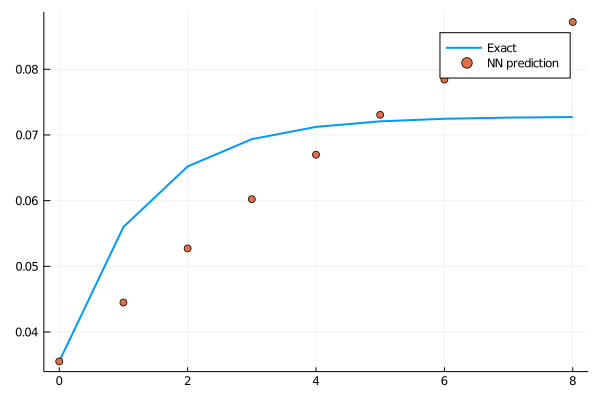

loss: 0.00584:  12%|████▊                                    |  ETA: 0:01:41

0.0056257187f0

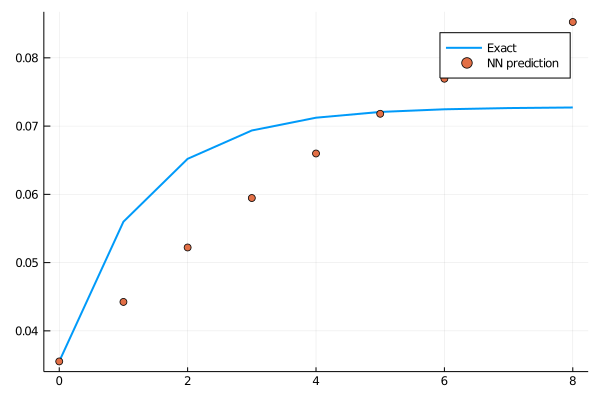

loss: 0.00563:  12%|████▉                                    |  ETA: 0:01:38

0.0056197667f0

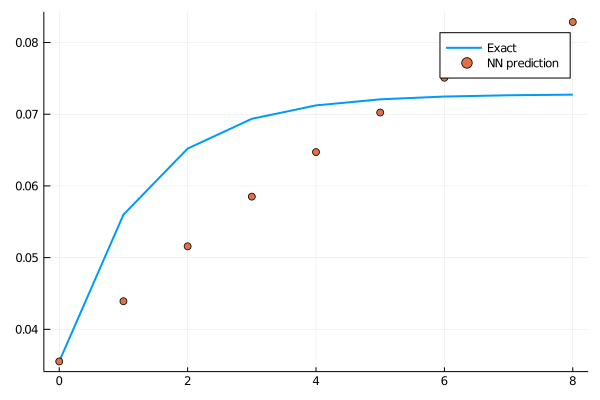

loss: 0.00562:  12%|█████                                    |  ETA: 0:01:37

0.005713608f0

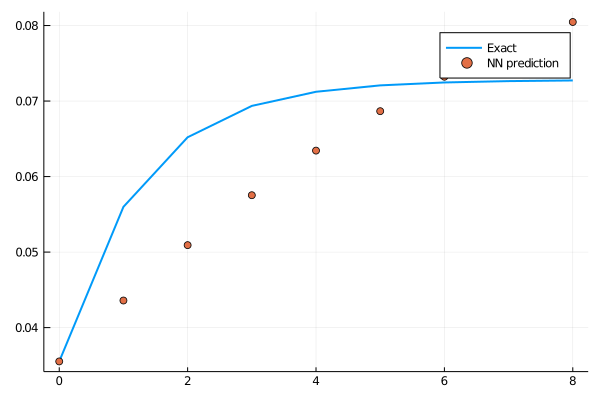

loss: 0.00571:  13%|█████▏                                   |  ETA: 0:01:35

0.005802721f0

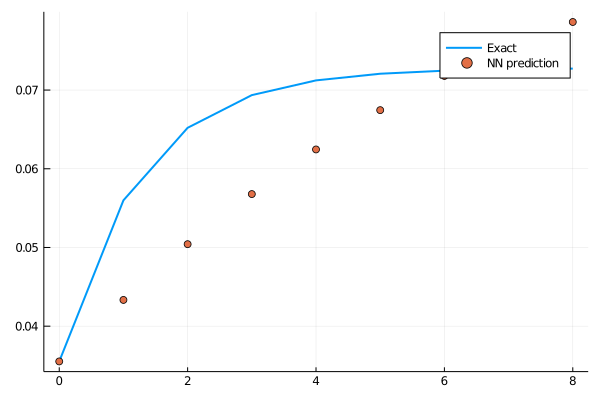

loss: 0.0058:  13%|█████▍                                   |  ETA: 0:01:33

0.005776124f0

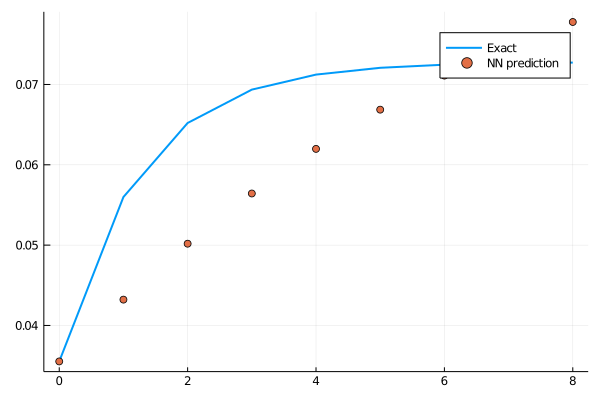

loss: 0.00578:  13%|█████▌                                   |  ETA: 0:01:31

0.0056094136f0

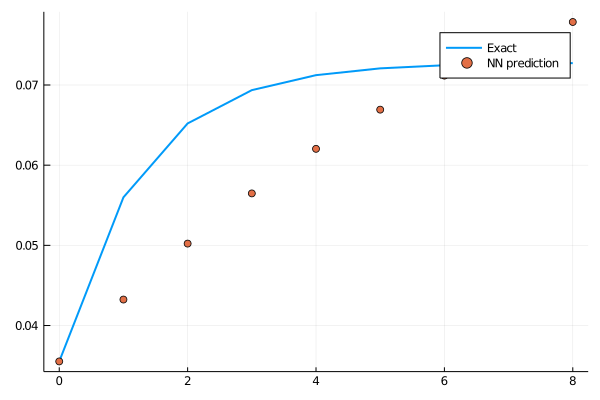

loss: 0.00561:  14%|█████▋                                   |  ETA: 0:01:30

0.00537163f0

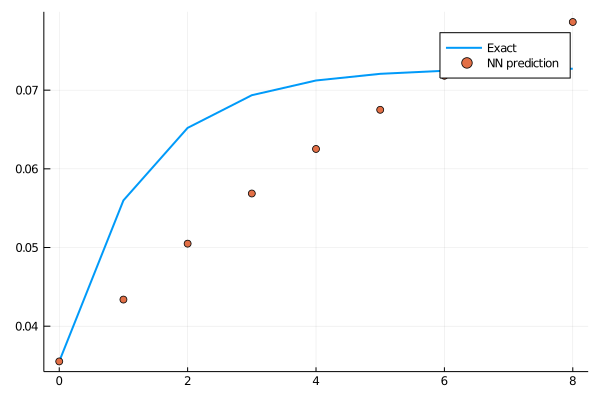

loss: 0.00537:  14%|█████▊                                   |  ETA: 0:01:27

0.005149387f0

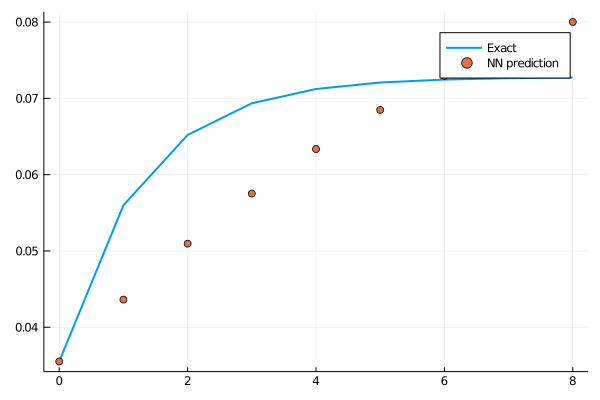

loss: 0.00515:  14%|█████▉                                   |  ETA: 0:01:26

0.0050141606f0

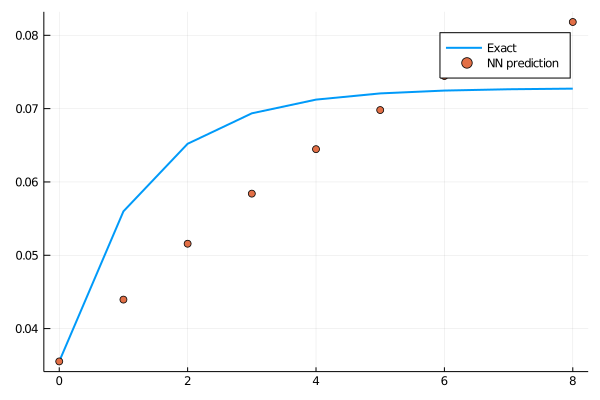

loss: 0.00501:  15%|██████                                   |  ETA: 0:01:25

0.0049781026f0

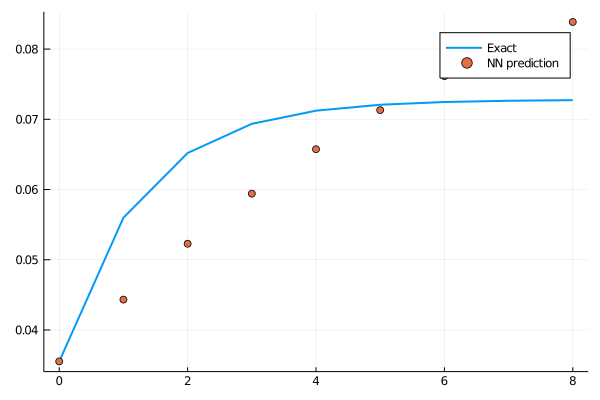

loss: 0.00498:  15%|██████▏                                  |  ETA: 0:01:23

0.004995938f0

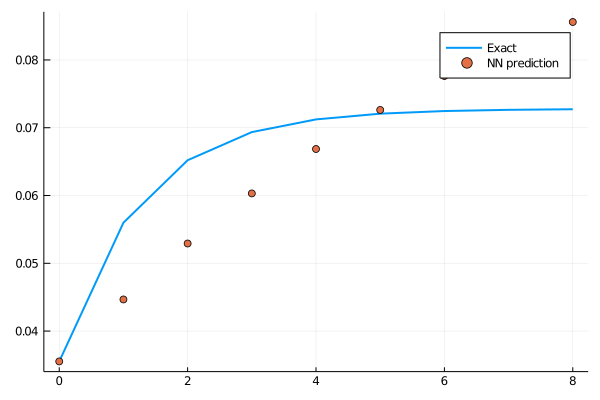

loss: 0.005:  15%|██████▎                                  |  ETA: 0:01:22

0.005001023f0

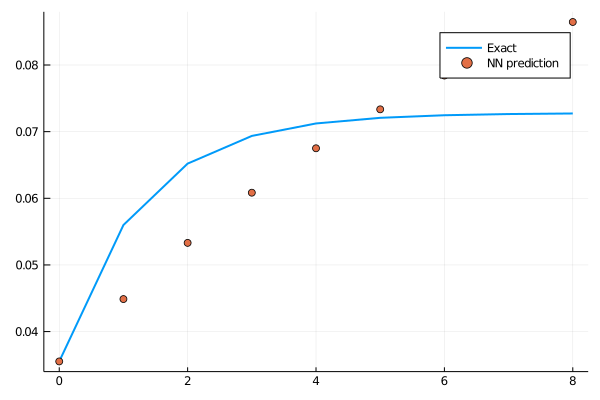

loss: 0.005:  16%|██████▍                                  |  ETA: 0:01:21

0.004943505f0

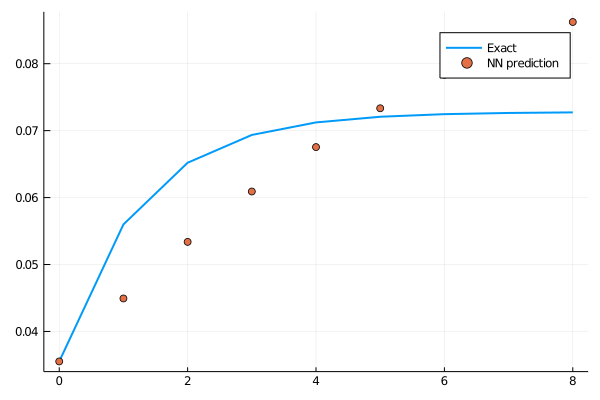

loss: 0.00494:  16%|██████▌                                  |  ETA: 0:01:19

0.0048205503f0

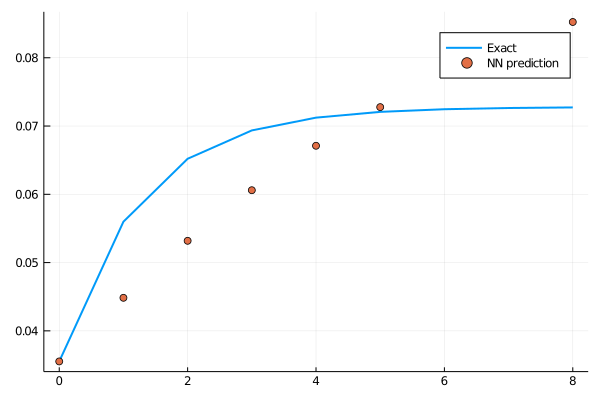

loss: 0.00482:  16%|██████▋                                  |  ETA: 0:01:18

0.0046698847f0

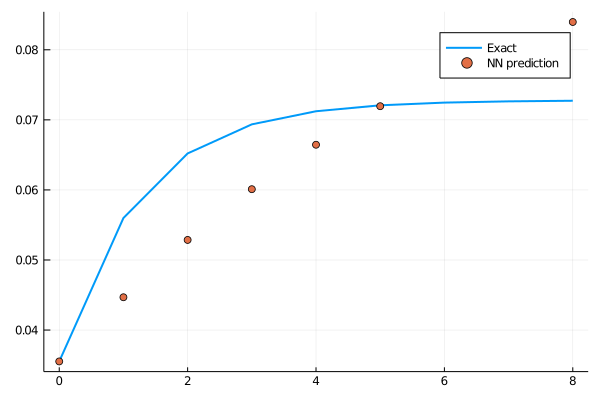

loss: 0.00467:  17%|██████▊                                  |  ETA: 0:01:17

0.0045380853f0

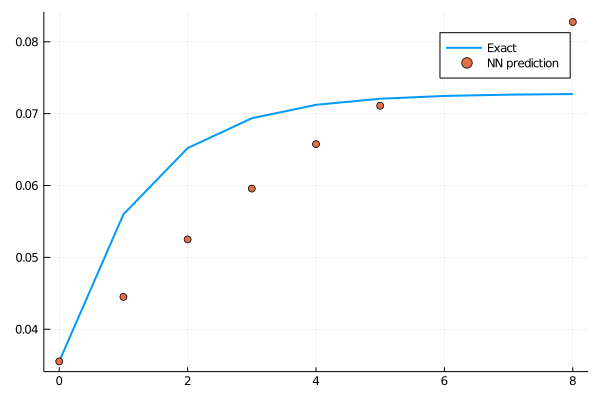

loss: 0.00454:  17%|███████                                  |  ETA: 0:01:15

0.0044529093f0

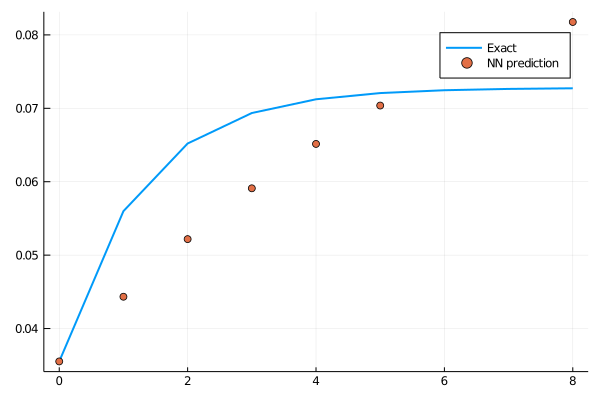

loss: 0.00445:  17%|███████▏                                 |  ETA: 0:01:14

0.004426035f0

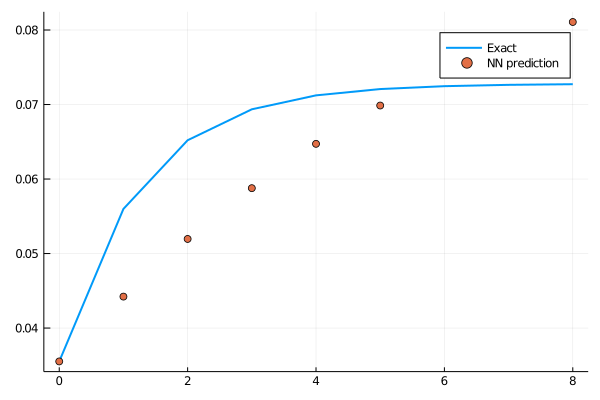

loss: 0.00443:  18%|███████▎                                 |  ETA: 0:01:13

0.004428732f0

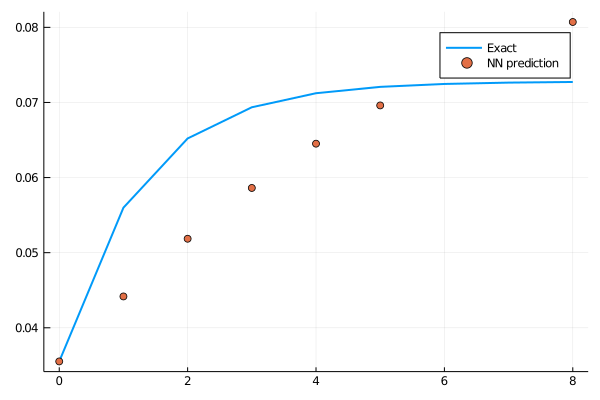

loss: 0.00443:  18%|███████▍                                 |  ETA: 0:01:12

0.0043970114f0

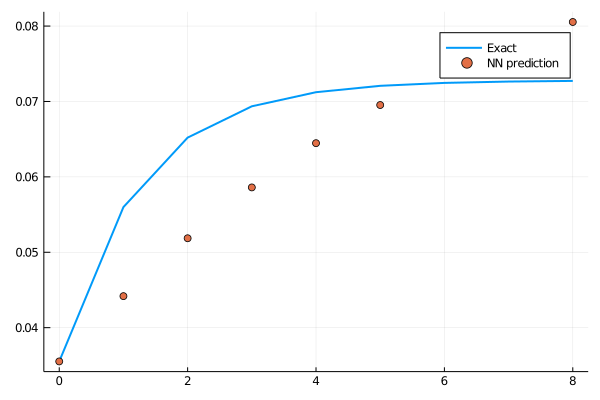

loss: 0.0044:  18%|███████▌                                 |  ETA: 0:01:11

0.0043027736f0

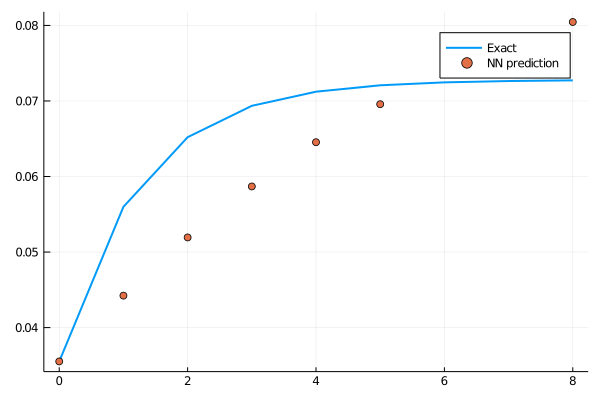

loss: 0.0043:  19%|███████▋                                 |  ETA: 0:01:10

0.0041807783f0

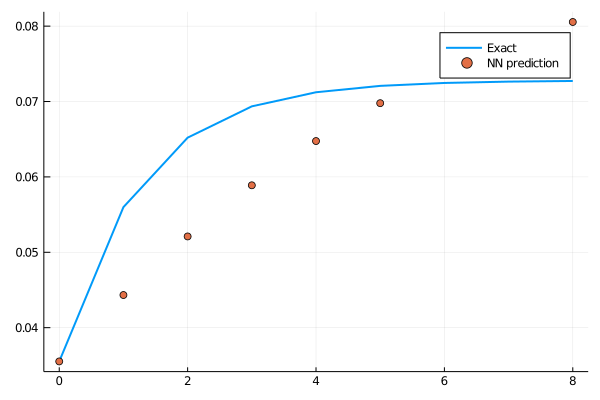

loss: 0.00418:  19%|███████▊                                 |  ETA: 0:01:09

0.004081123f0

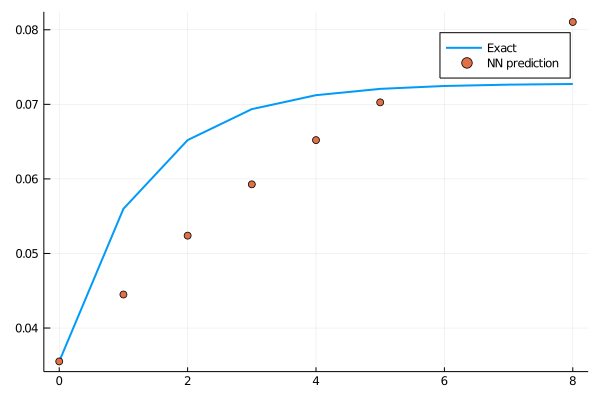

loss: 0.00408:  19%|███████▉                                 |  ETA: 0:01:08

0.004019734f0

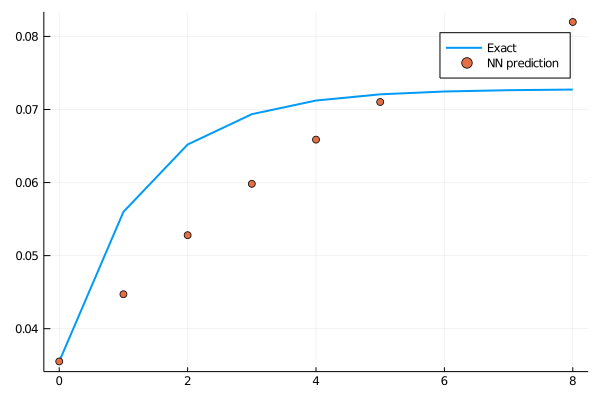

loss: 0.00402:  20%|████████                                 |  ETA: 0:01:08

0.003981815f0

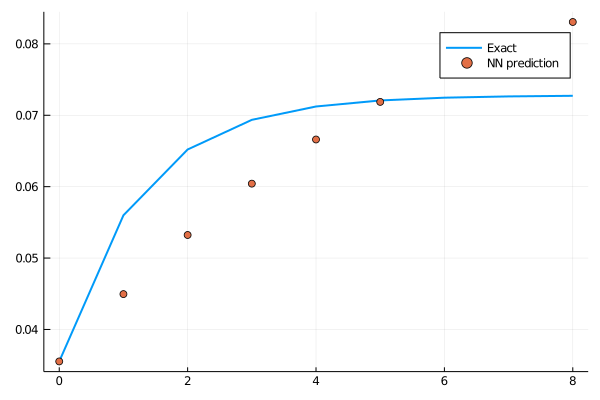

loss: 0.00398:  20%|████████▎                                |  ETA: 0:01:06

0.003947551f0

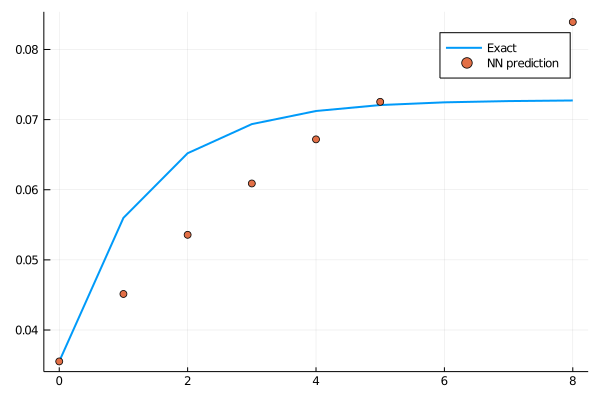

loss: 0.00395:  20%|████████▍                                |  ETA: 0:01:06

0.0038999487f0

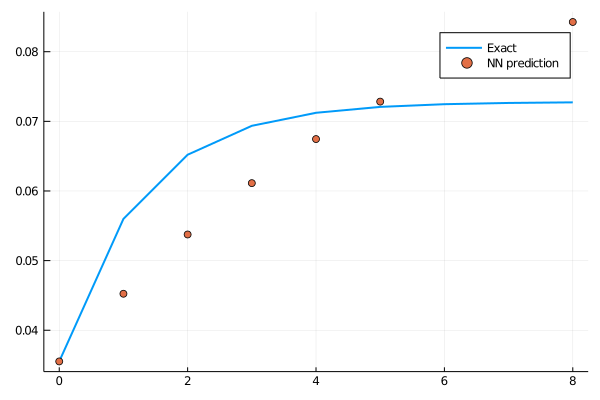

loss: 0.0039:  21%|████████▌                                |  ETA: 0:01:05

0.0038284478f0

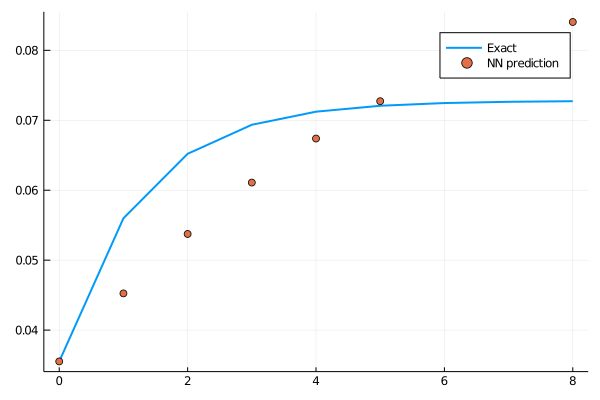

loss: 0.00383:  21%|████████▋                                |  ETA: 0:01:04

0.0037422474f0

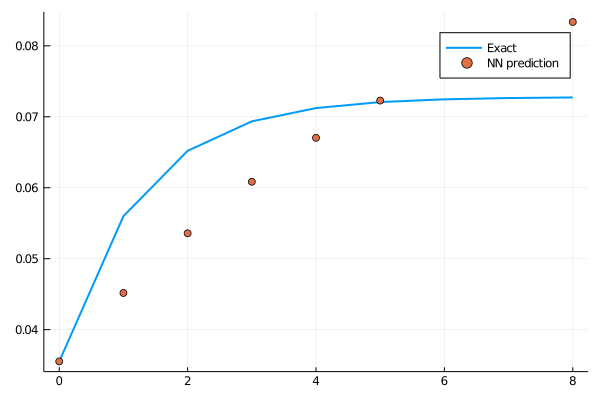

loss: 0.00374:  21%|████████▊                                |  ETA: 0:01:03

0.0036648735f0

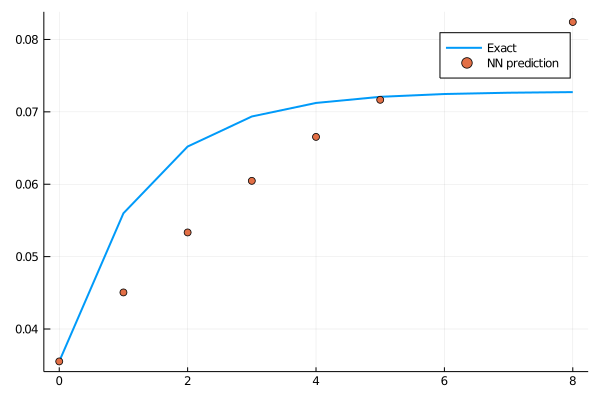

loss: 0.00366:  22%|████████▉                                |  ETA: 0:01:03

0.0036083278f0

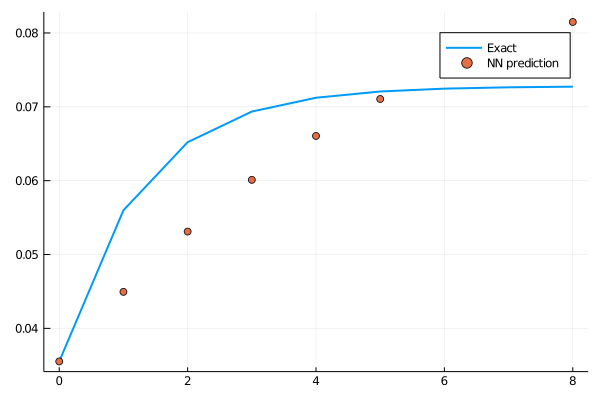

loss: 0.00361:  22%|█████████                                |  ETA: 0:01:02

0.0035647138f0

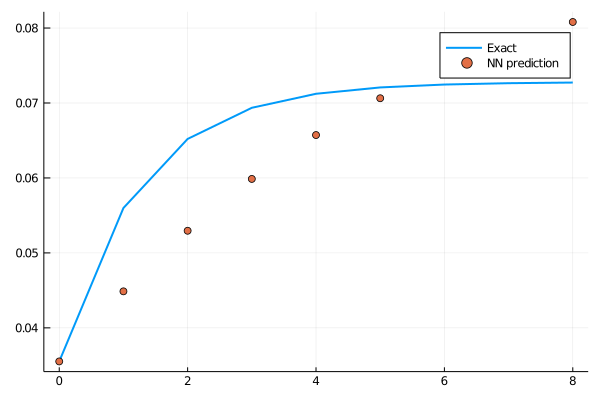

loss: 0.00356:  22%|█████████▏                               |  ETA: 0:01:01

0.0035191237f0

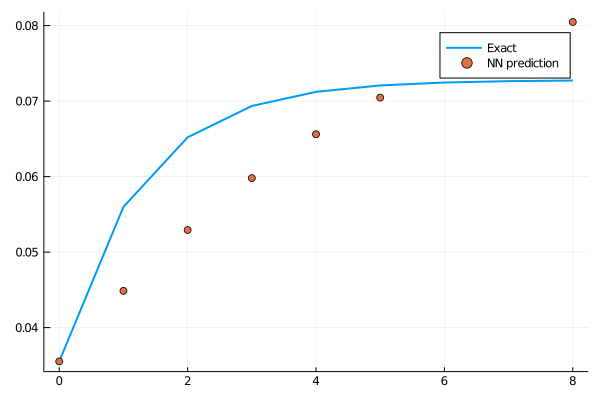

loss: 0.00352:  23%|█████████▎                               |  ETA: 0:01:01

0.003463615f0

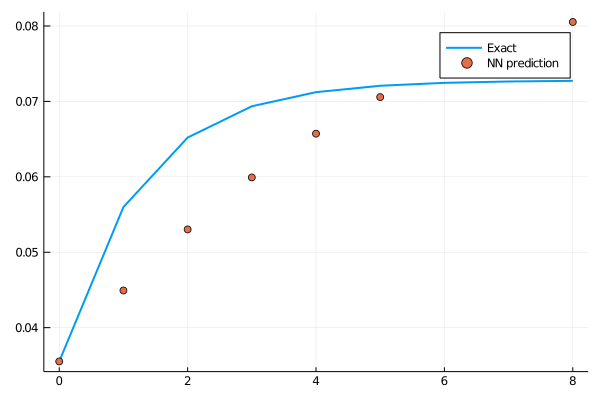

loss: 0.00346:  23%|█████████▍                               |  ETA: 0:01:00

0.003400849f0

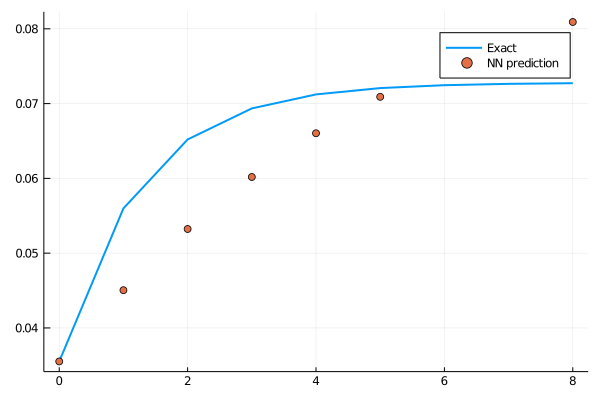

loss: 0.0034:  23%|█████████▌                               |  ETA: 0:00:59

0.0033367837f0

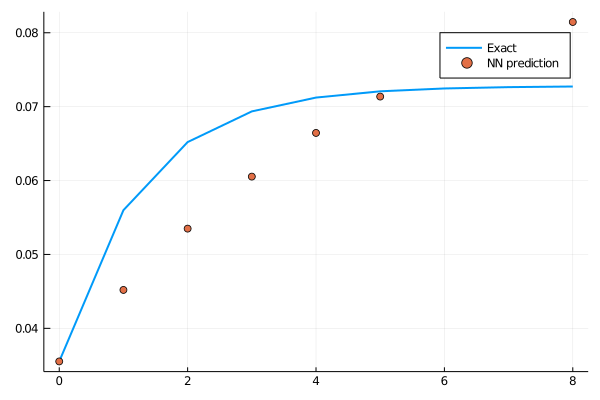

loss: 0.00334:  24%|█████████▋                               |  ETA: 0:00:59

0.0032756997f0

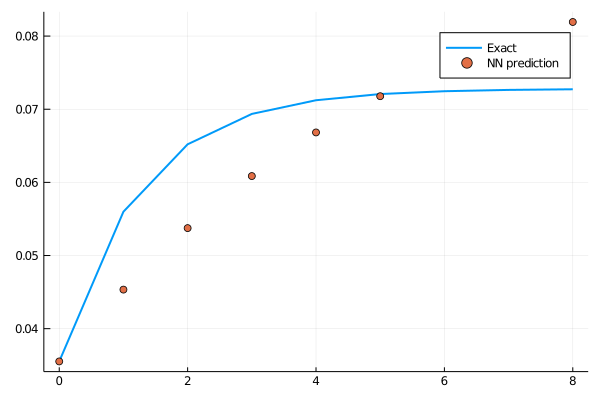

loss: 0.00328:  24%|█████████▉                               |  ETA: 0:00:58

0.0032202096f0

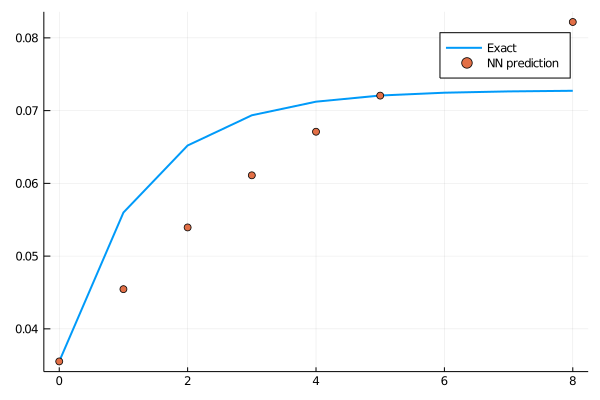

loss: 0.00322:  24%|██████████                               |  ETA: 0:00:57

0.0031707229f0

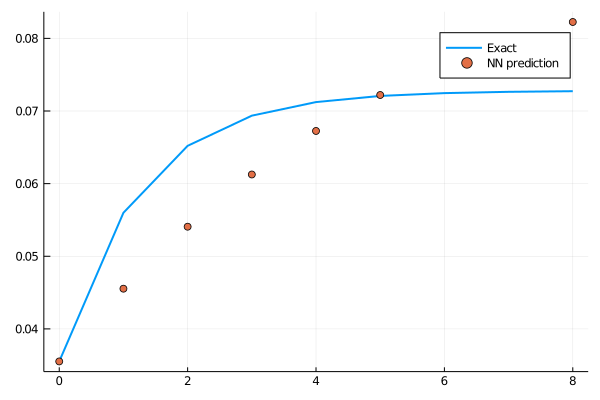

loss: 0.00317:  25%|██████████▏                              |  ETA: 0:00:57

0.0031234084f0

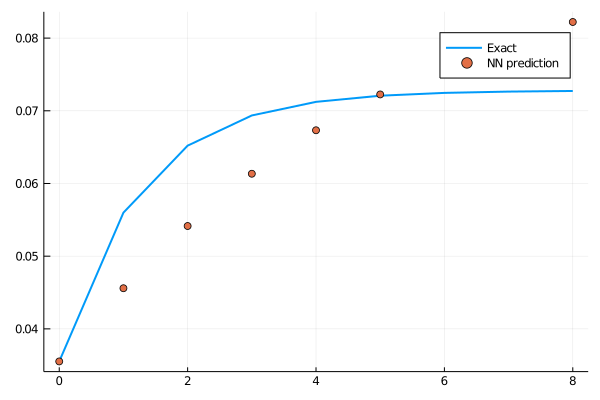

loss: 0.00312:  25%|██████████▎                              |  ETA: 0:00:56

0.003072466f0

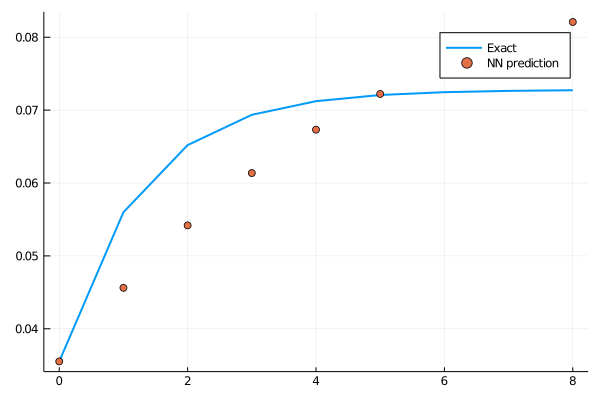

loss: 0.00307:  25%|██████████▍                              |  ETA: 0:00:56

0.0030168863f0

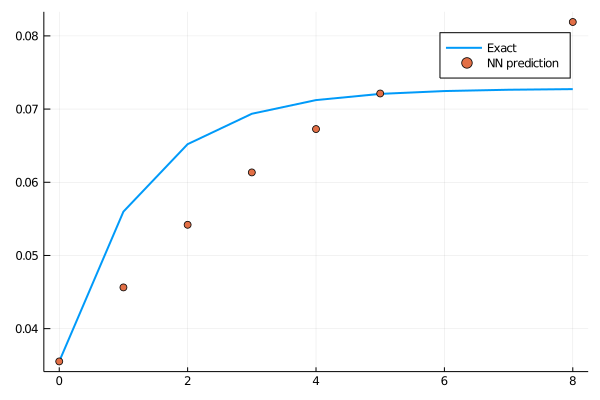

loss: 0.00302:  26%|██████████▌                              |  ETA: 0:00:55

0.0029599515f0

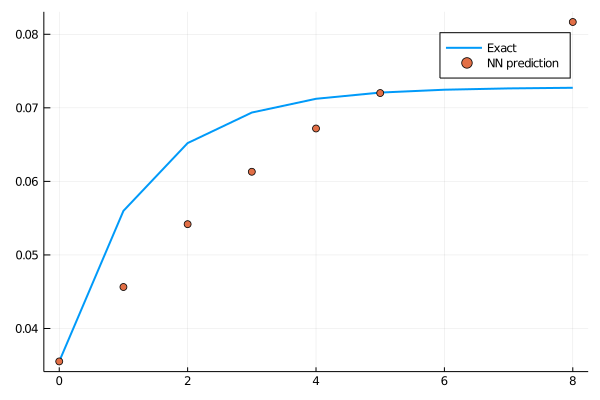

loss: 0.00296:  26%|██████████▋                              |  ETA: 0:00:54

0.002905462f0

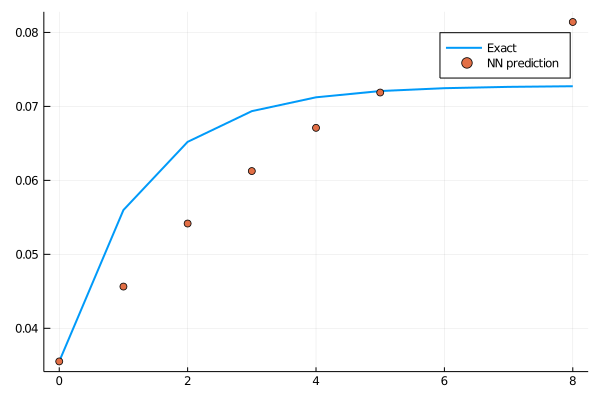

loss: 0.00291:  26%|██████████▊                              |  ETA: 0:00:54

0.002855442f0

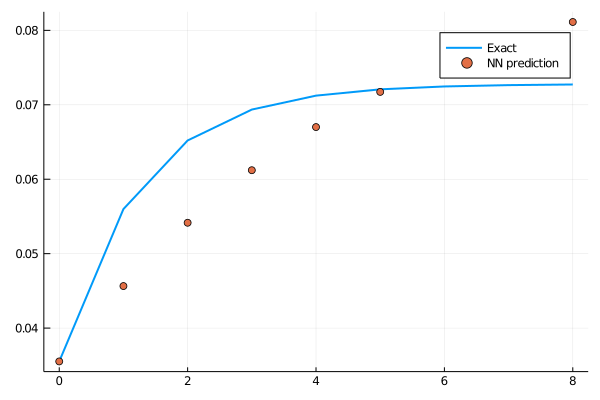

loss: 0.00286:  27%|██████████▉                              |  ETA: 0:00:54

0.0028089045f0

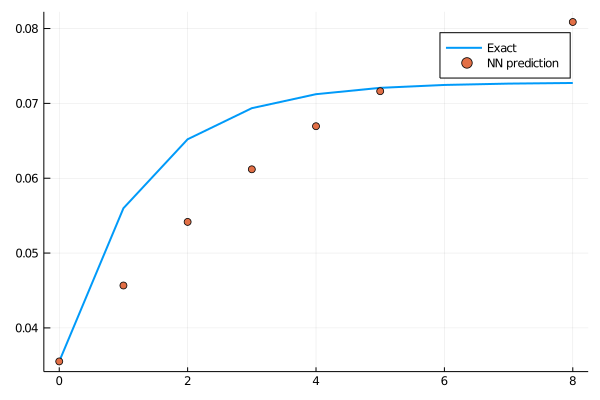

loss: 0.00281:  27%|███████████▏                             |  ETA: 0:00:53

0.002762859f0

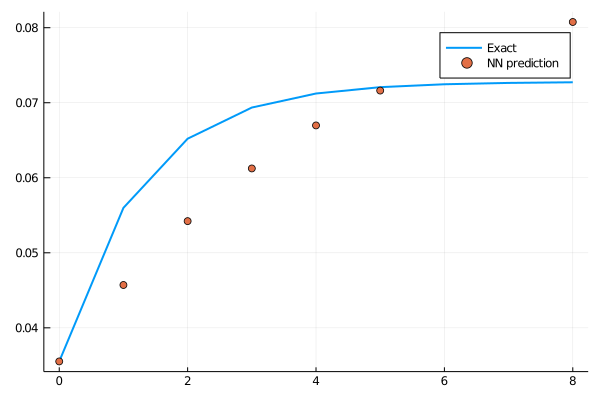

loss: 0.00276:  27%|███████████▎                             |  ETA: 0:00:52

0.0027141855f0

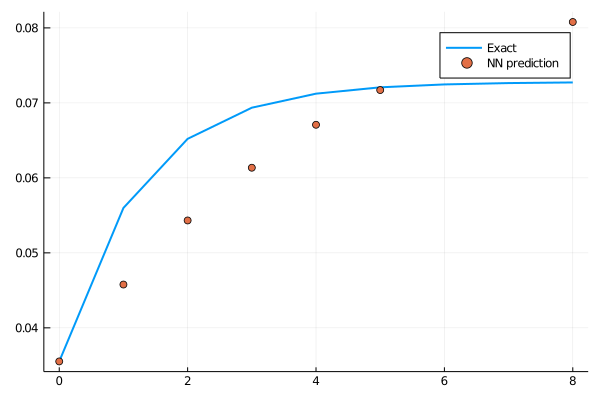

loss: 0.00271:  28%|███████████▍                             |  ETA: 0:00:52

0.0026628f0

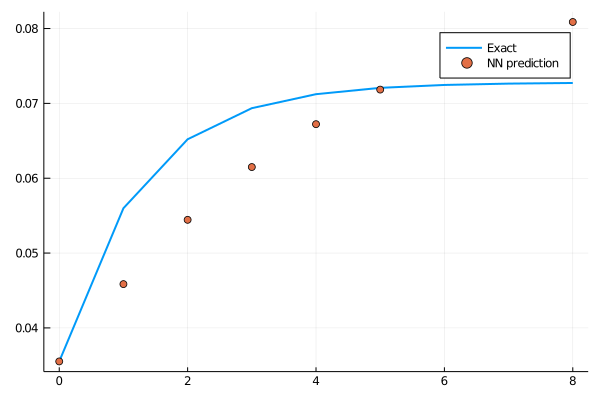

loss: 0.00266:  28%|███████████▌                             |  ETA: 0:00:51

0.0026120665f0

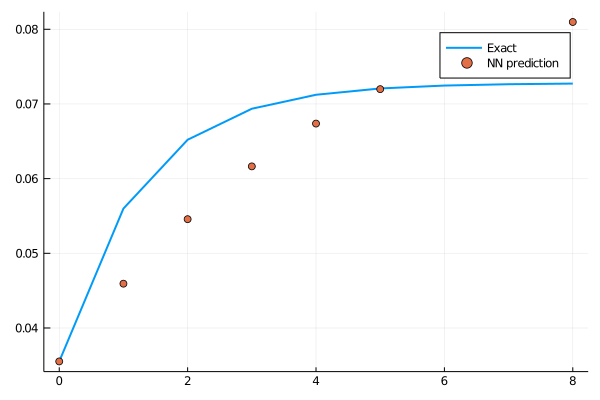

loss: 0.00261:  28%|███████████▋                             |  ETA: 0:00:51

0.0025646074f0

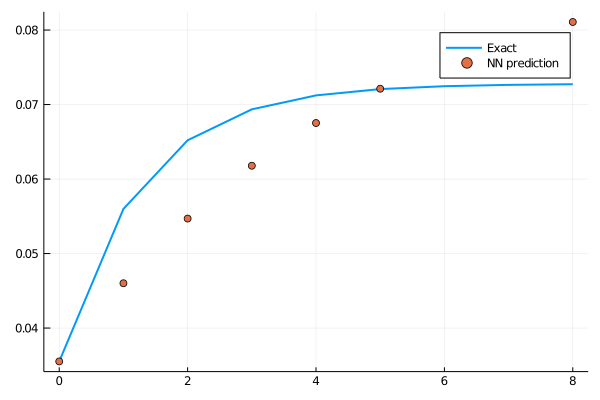

loss: 0.00256:  29%|███████████▊                             |  ETA: 0:00:51

0.002519866f0

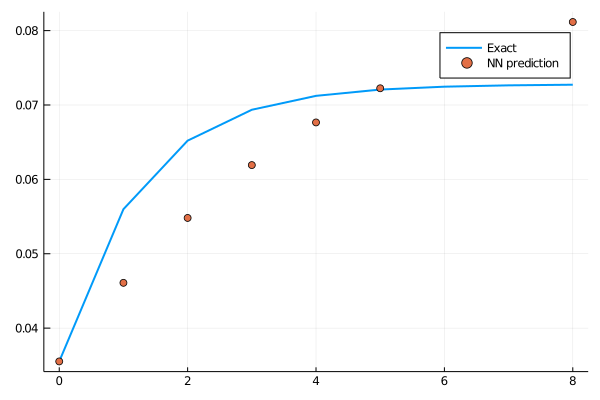

loss: 0.00252:  29%|███████████▉                             |  ETA: 0:00:50

0.002476251f0

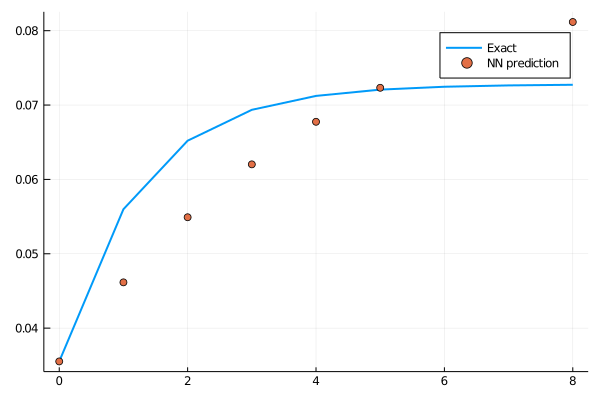

loss: 0.00248:  29%|████████████                             |  ETA: 0:00:50

0.0024318509f0

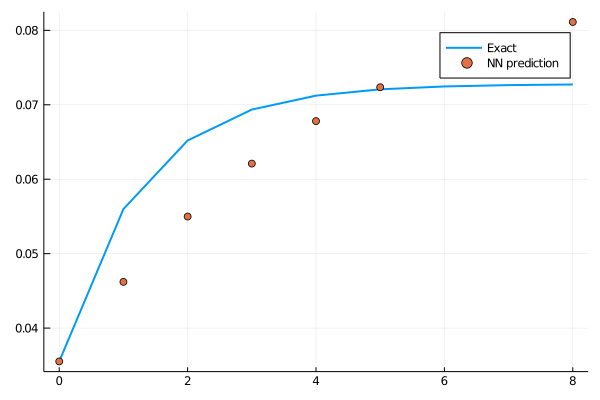

loss: 0.00243:  30%|████████████▏                            |  ETA: 0:00:49

0.0023858626f0

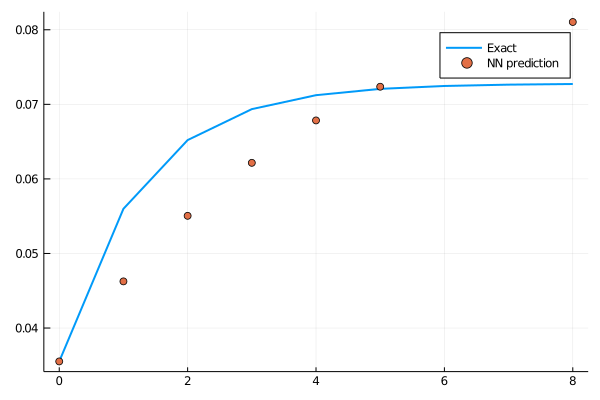

loss: 0.00239:  30%|████████████▎                            |  ETA: 0:00:49

0.002339866f0

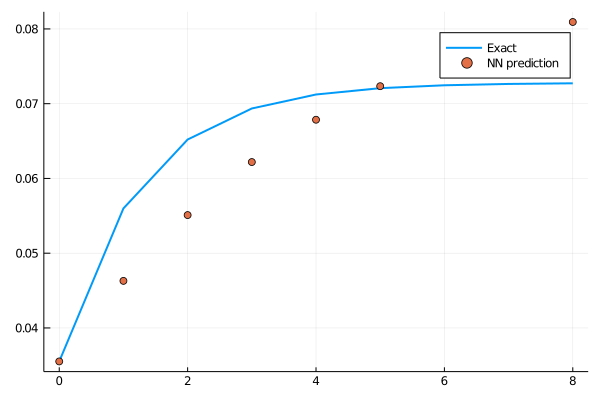

loss: 0.00234:  30%|████████████▍                            |  ETA: 0:00:48

0.0022960366f0

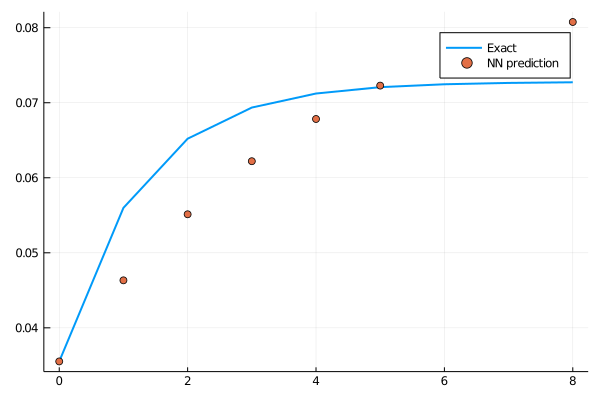

loss: 0.0023:  31%|████████████▌                            |  ETA: 0:00:48

0.0022542558f0

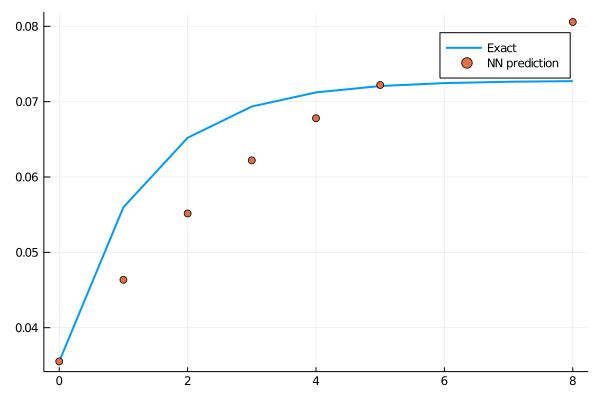

loss: 0.00225:  31%|████████████▊                            |  ETA: 0:00:47

0.0022131088f0

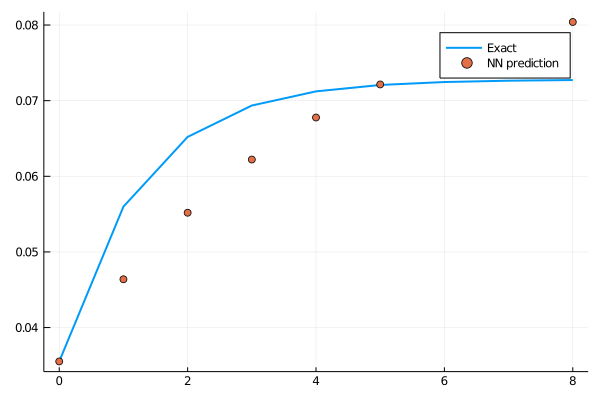

loss: 0.00221:  31%|████████████▉                            |  ETA: 0:00:47

0.0021719057f0

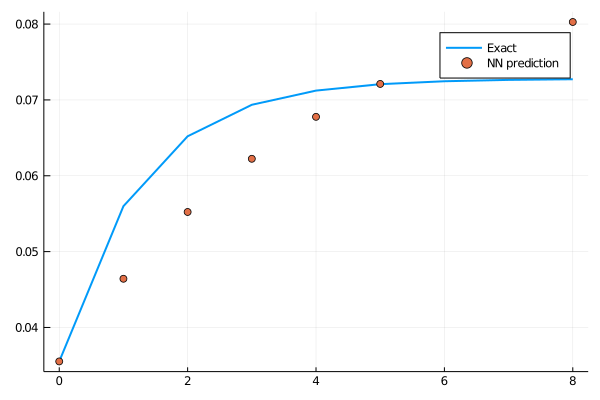

loss: 0.00217:  32%|█████████████                            |  ETA: 0:00:47

0.0021306975f0

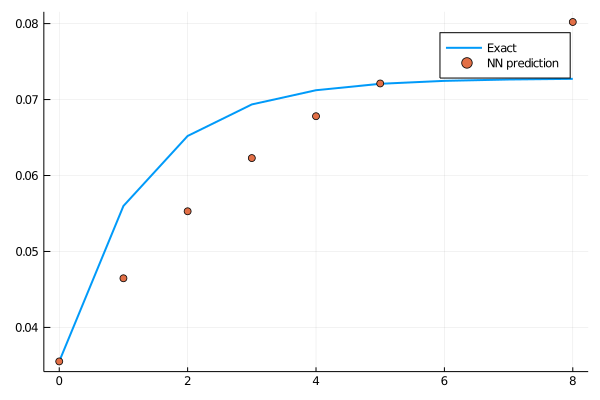

loss: 0.00213:  32%|█████████████▏                           |  ETA: 0:00:46

0.0020897123f0

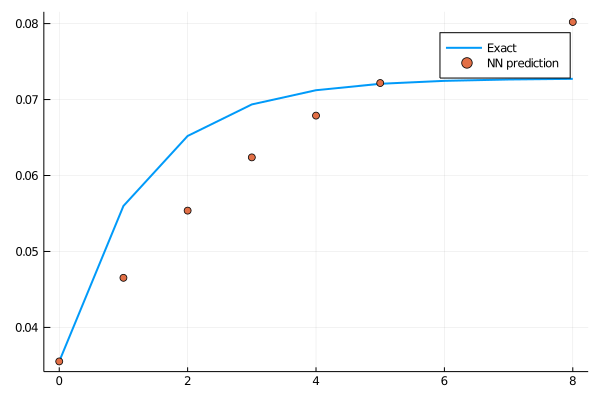

loss: 0.00209:  32%|█████████████▎                           |  ETA: 0:00:46

0.0020495835f0

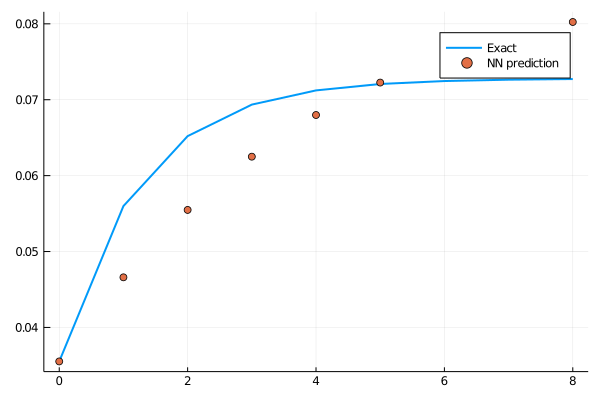

loss: 0.00205:  33%|█████████████▍                           |  ETA: 0:00:45

0.0020107185f0

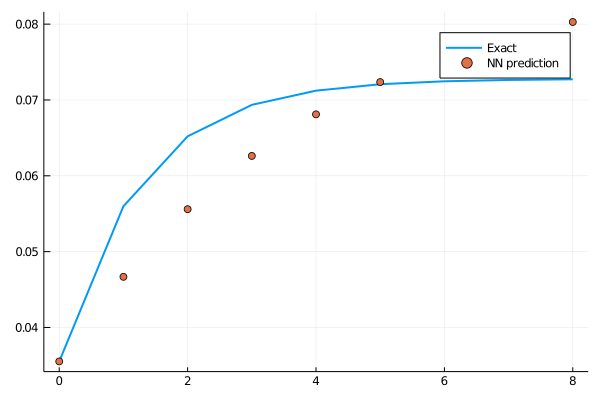

loss: 0.00201:  33%|█████████████▌                           |  ETA: 0:00:45

0.0019727172f0

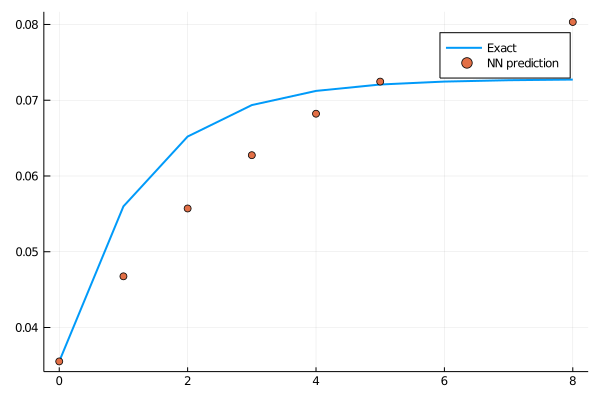

loss: 0.00197:  33%|█████████████▋                           |  ETA: 0:00:45

0.0019351911f0

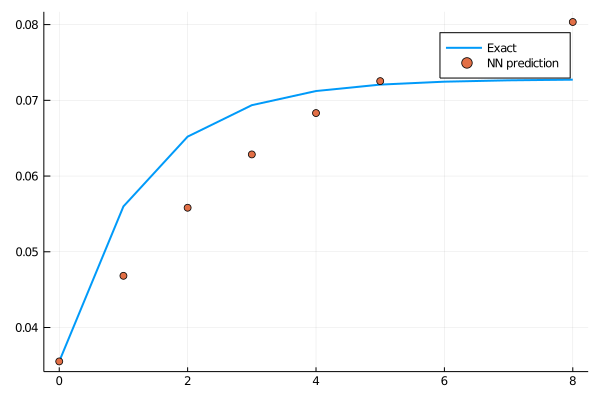

loss: 0.00194:  34%|█████████████▊                           |  ETA: 0:00:44

0.0018979863f0

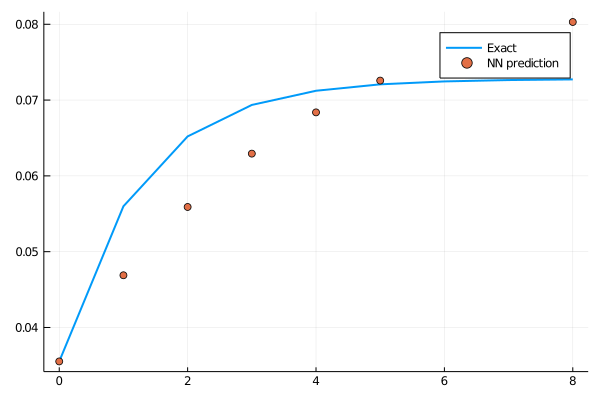

loss: 0.0019:  34%|██████████████                           |  ETA: 0:00:44

0.0018610653f0

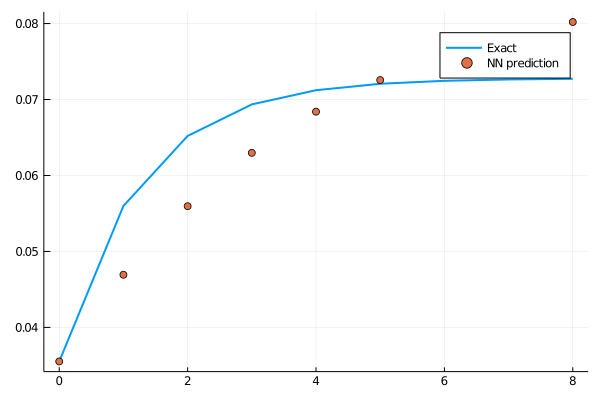

loss: 0.00186:  34%|██████████████▏                          |  ETA: 0:00:44

0.0018247825f0

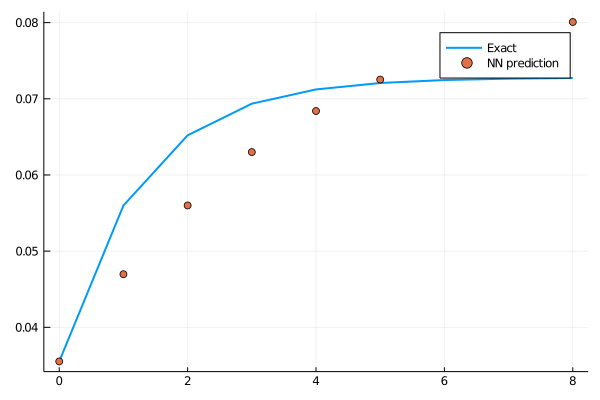

loss: 0.00182:  35%|██████████████▏                          |  ETA: 0:00:43

0.0017893789f0

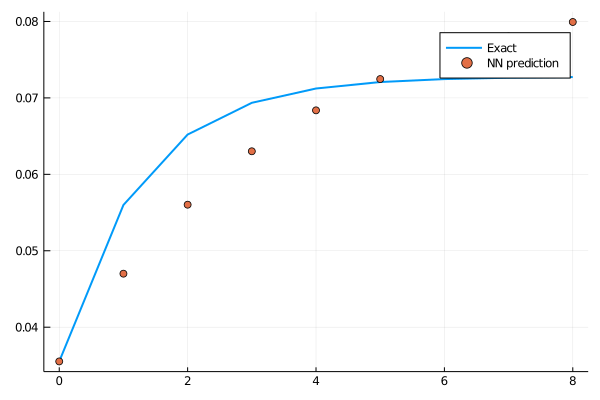

loss: 0.00179:  35%|██████████████▍                          |  ETA: 0:00:43

0.0017547016f0

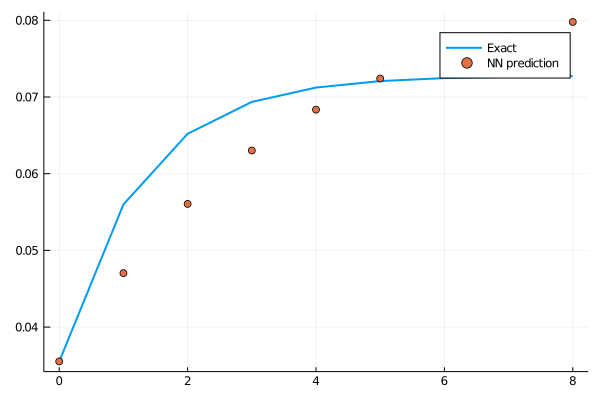

loss: 0.00175:  35%|██████████████▌                          |  ETA: 0:00:42

0.0017207165f0

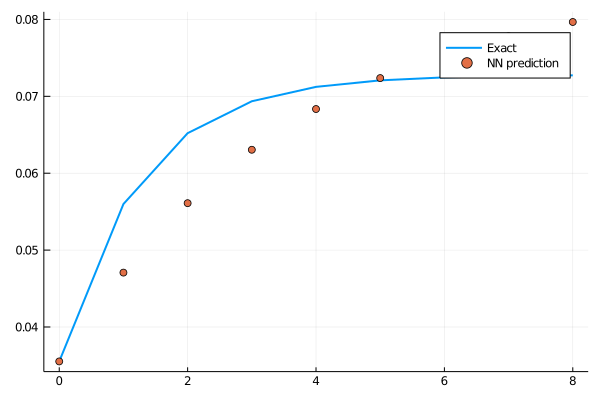

loss: 0.00172:  36%|██████████████▋                          |  ETA: 0:00:42

0.0016872536f0

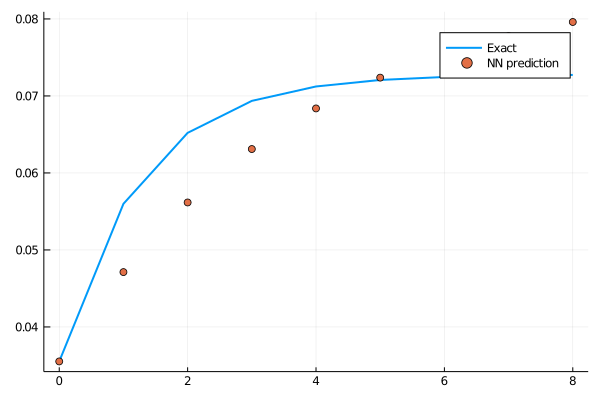

loss: 0.00169:  36%|██████████████▊                          |  ETA: 0:00:42

0.0016541013f0

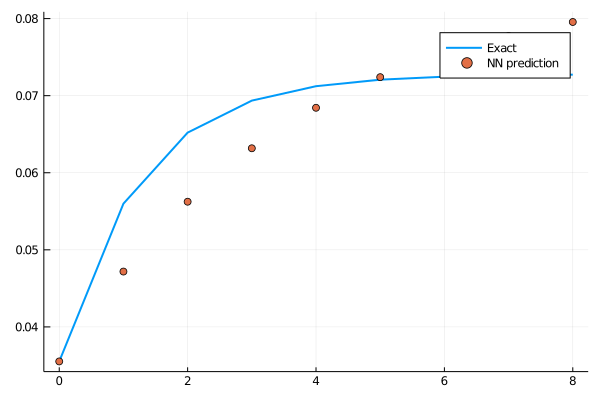

loss: 0.00165:  36%|██████████████▉                          |  ETA: 0:00:41

0.0016213802f0

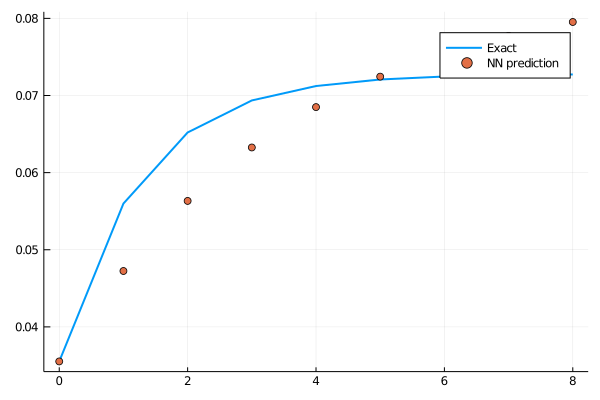

loss: 0.00162:  37%|███████████████                          |  ETA: 0:00:41

0.0015894148f0

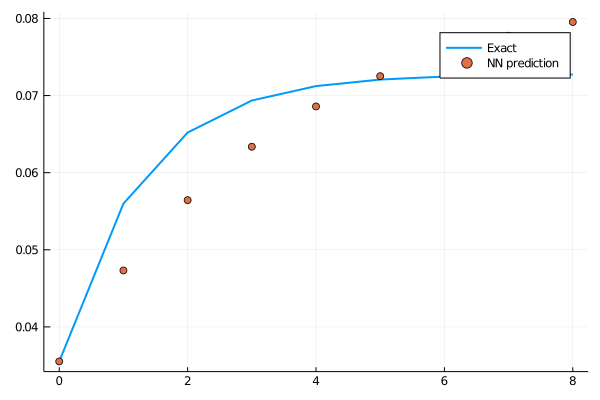

loss: 0.00159:  37%|███████████████▏                         |  ETA: 0:00:41

0.0015582448f0

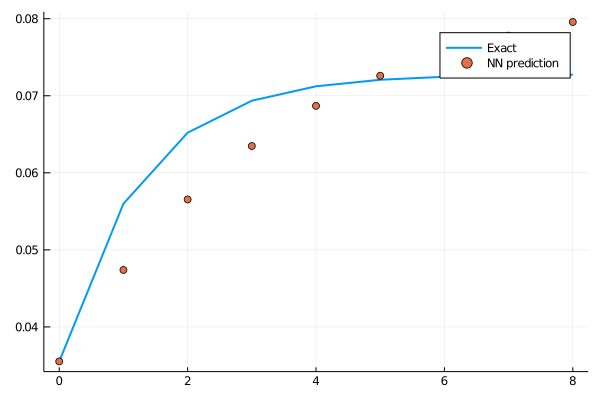

loss: 0.00156:  37%|███████████████▎                         |  ETA: 0:00:40

0.0015276604f0

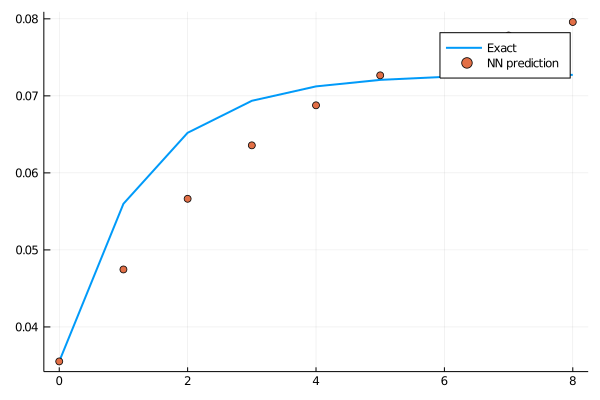

loss: 0.00153:  38%|███████████████▍                         |  ETA: 0:00:40

0.0014975334f0

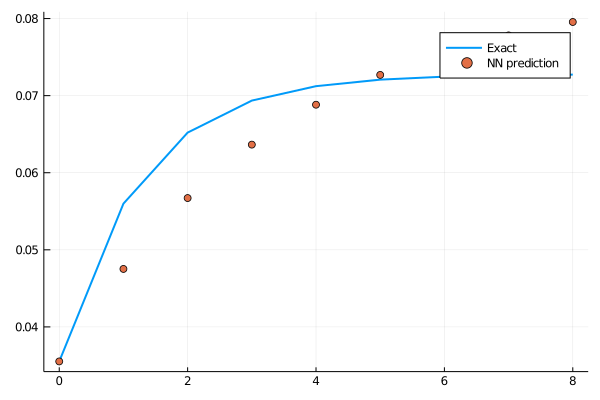

loss: 0.0015:  38%|███████████████▋                         |  ETA: 0:00:40

0.0014678289f0

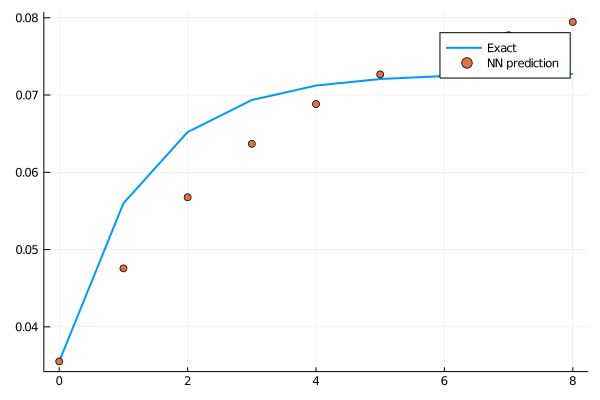

loss: 0.00147:  38%|███████████████▊                         |  ETA: 0:00:39

0.0014385994f0

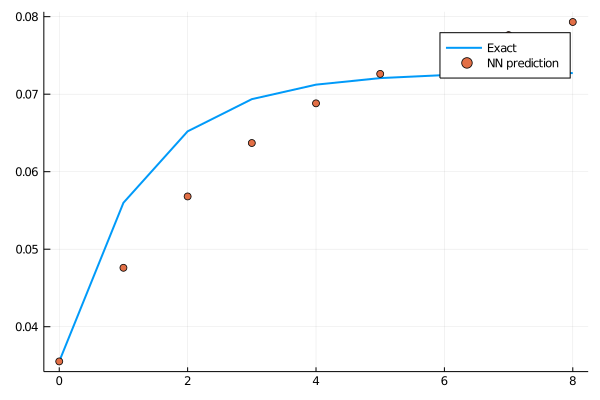

loss: 0.00144:  39%|███████████████▉                         |  ETA: 0:00:39

0.0014100075f0

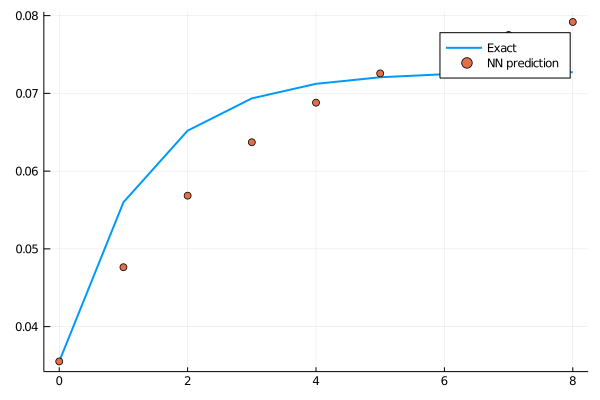

loss: 0.00141:  39%|████████████████                         |  ETA: 0:00:39

0.0013820875f0

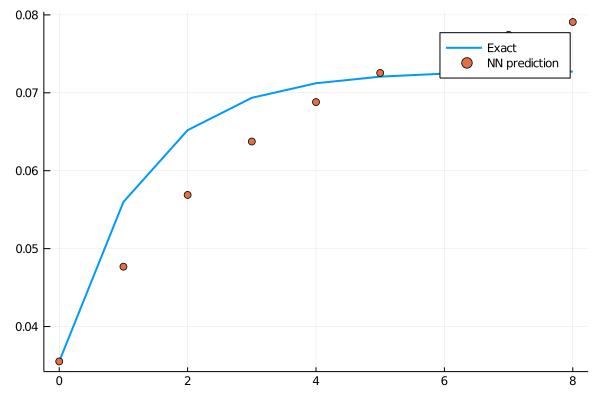

loss: 0.00138:  39%|████████████████▏                        |  ETA: 0:00:38

0.0013547098f0

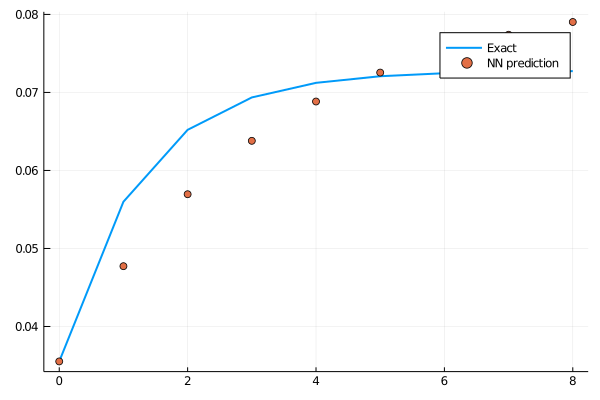

loss: 0.00135:  40%|████████████████▎                        |  ETA: 0:00:38

0.001327768f0

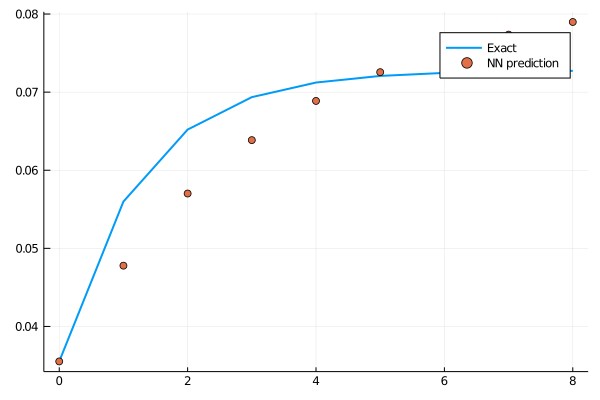

loss: 0.00133:  40%|████████████████▍                        |  ETA: 0:00:38

0.0013012587f0

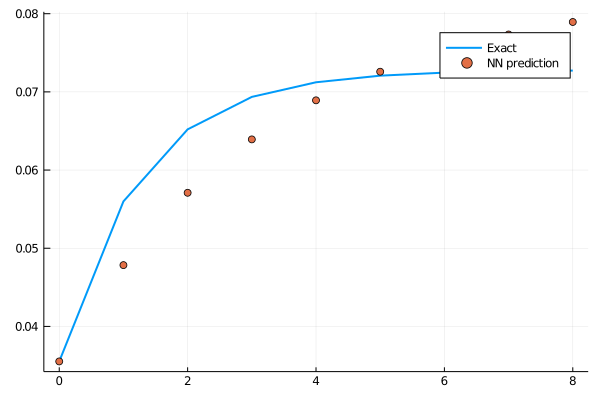

loss: 0.0013:  40%|████████████████▌                        |  ETA: 0:00:37

0.0012752514f0

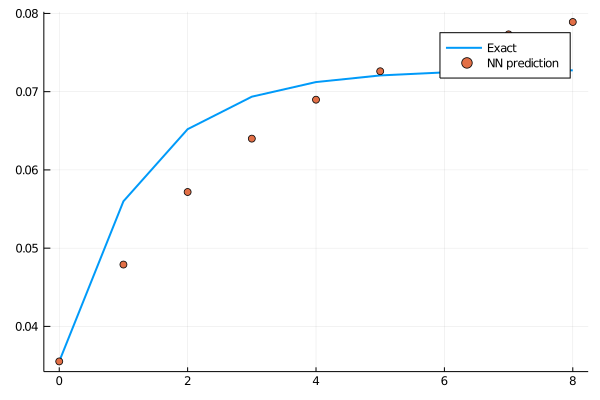

loss: 0.00128:  41%|████████████████▋                        |  ETA: 0:00:37

0.0012498045f0

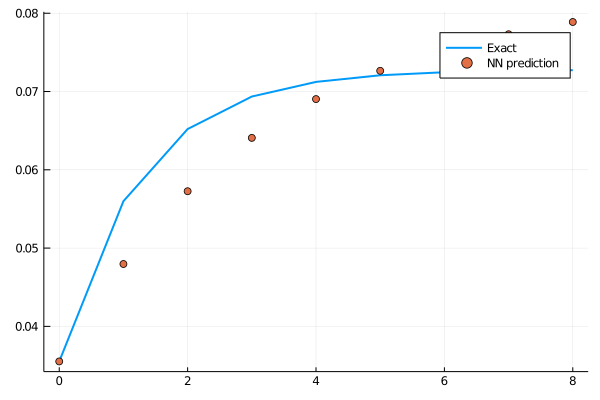

loss: 0.00125:  41%|████████████████▊                        |  ETA: 0:00:37

0.0012249002f0

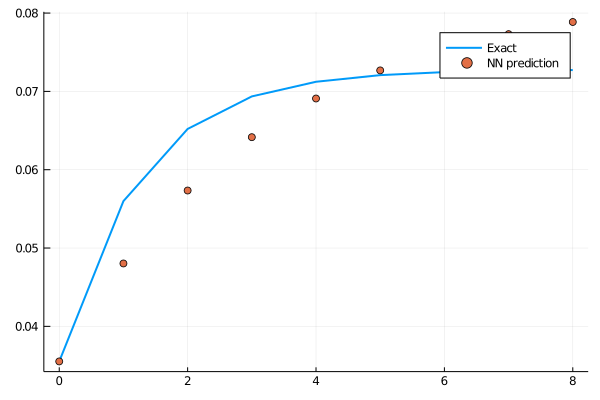

loss: 0.00122:  41%|████████████████▉                        |  ETA: 0:00:36

0.0012004832f0

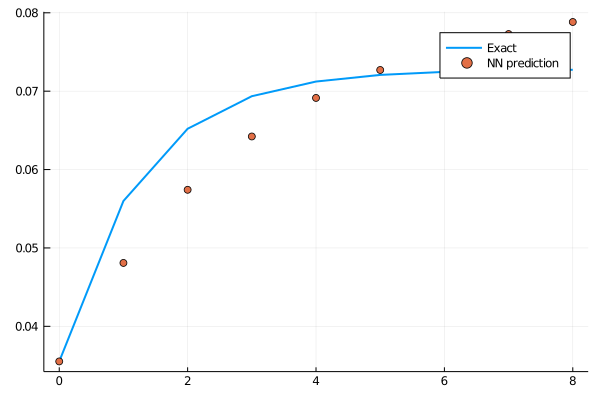

loss: 0.0012:  42%|█████████████████                        |  ETA: 0:00:36

0.0011765065f0

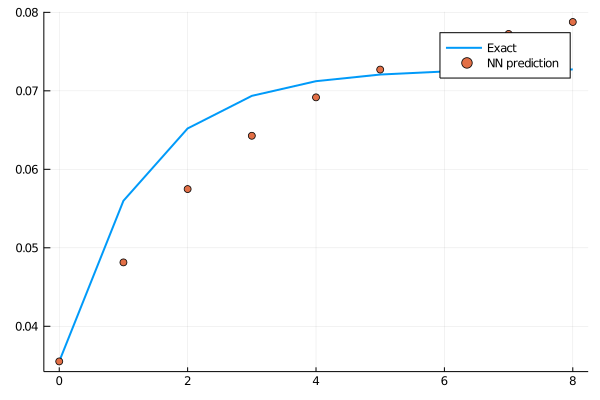

loss: 0.00118:  42%|█████████████████▎                       |  ETA: 0:00:36

0.0011529655f0

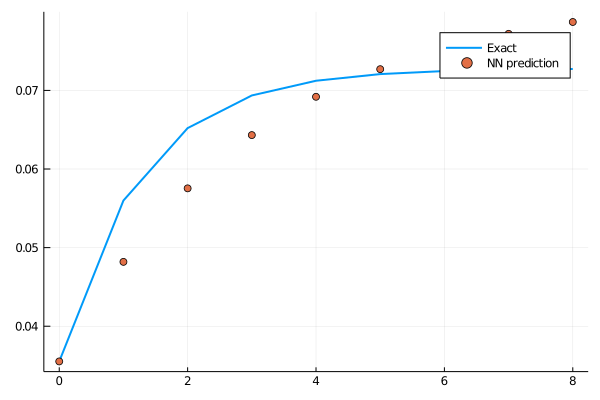

loss: 0.00115:  42%|█████████████████▍                       |  ETA: 0:00:35

0.0011298931f0

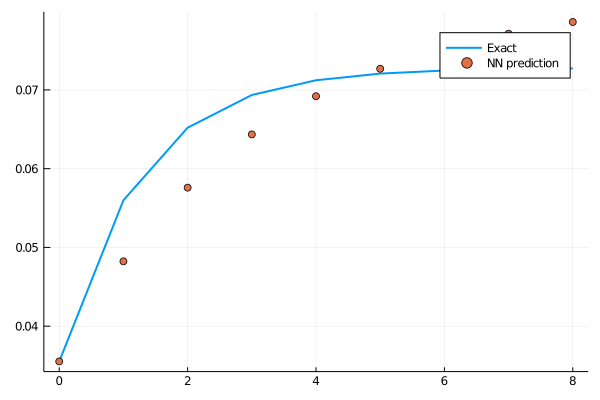

loss: 0.00113:  43%|█████████████████▌                       |  ETA: 0:00:35

0.0011073028f0

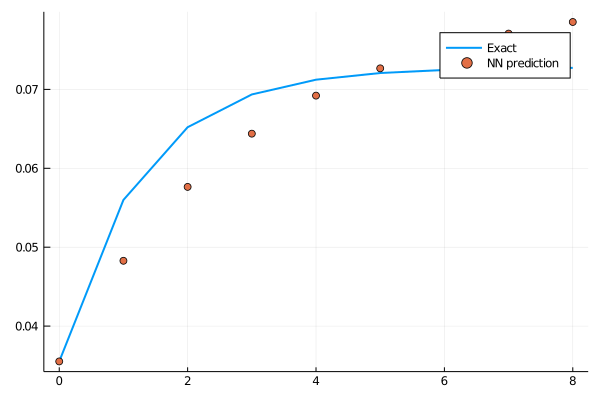

loss: 0.00111:  43%|█████████████████▋                       |  ETA: 0:00:35

0.0010851774f0

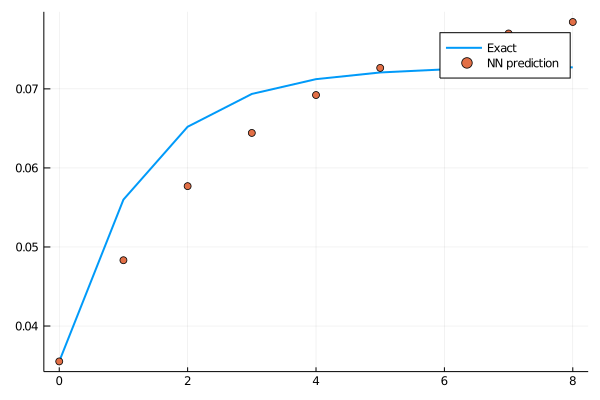

loss: 0.00109:  43%|█████████████████▊                       |  ETA: 0:00:35

0.001063502f0

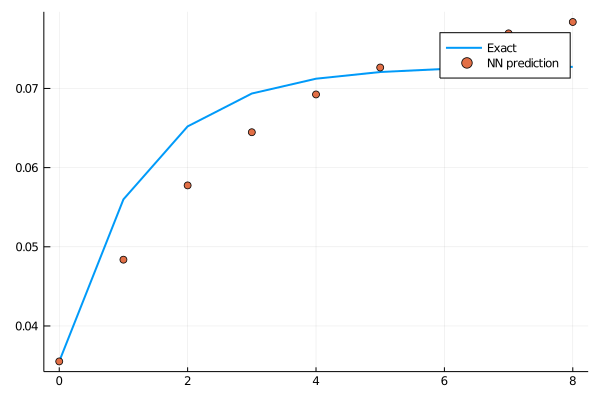

loss: 0.00106:  44%|█████████████████▉                       |  ETA: 0:00:34

0.0010422455f0

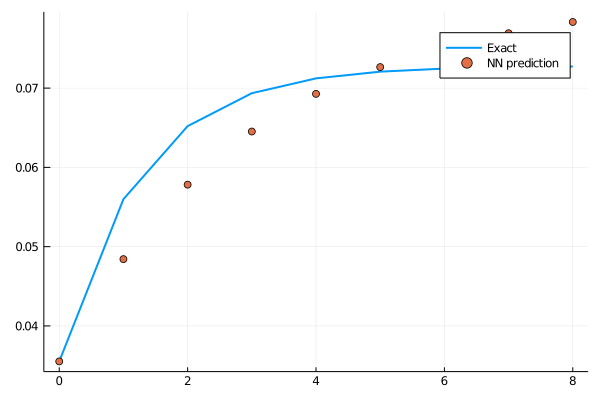

loss: 0.00104:  44%|██████████████████                       |  ETA: 0:00:34

0.0010213923f0

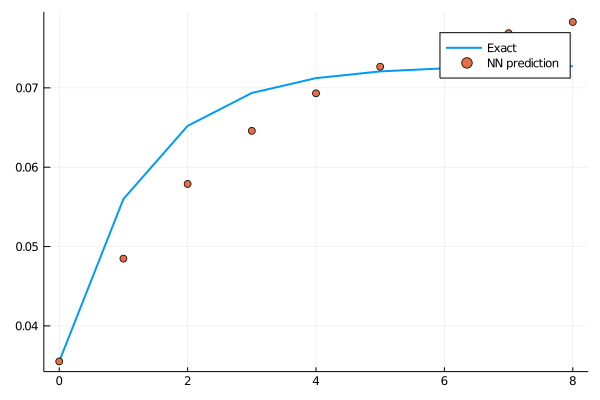

loss: 0.00102:  44%|██████████████████▏                      |  ETA: 0:00:34

0.0010009591f0

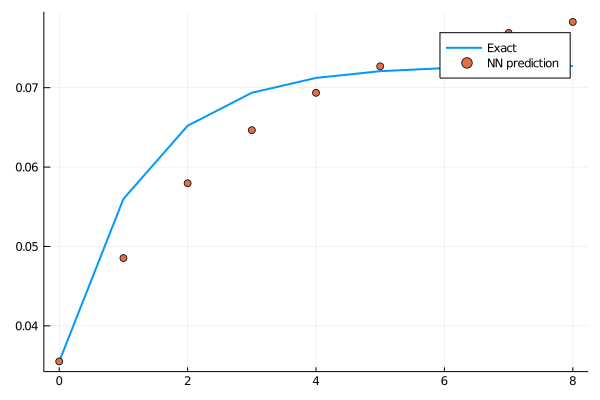

loss: 0.001:  45%|██████████████████▎                      |  ETA: 0:00:33

0.0009809529f0

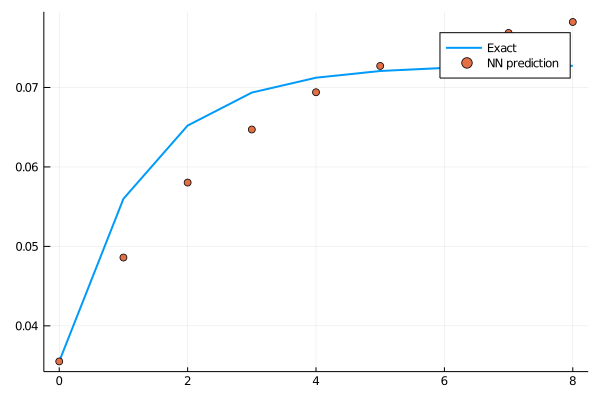

loss: 0.000981:  45%|██████████████████▌                      |  ETA: 0:00:33

0.00096136297f0

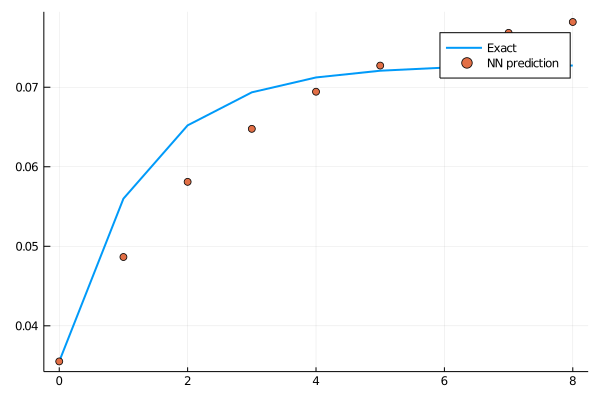

loss: 0.000961:  45%|██████████████████▋                      |  ETA: 0:00:33

0.0009421757f0

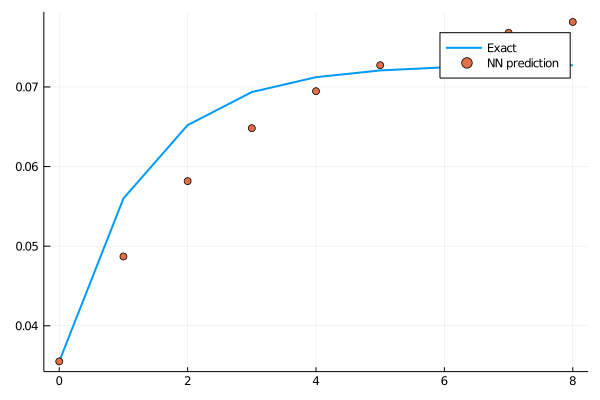

loss: 0.000942:  46%|██████████████████▊                      |  ETA: 0:00:33

0.0009233706f0

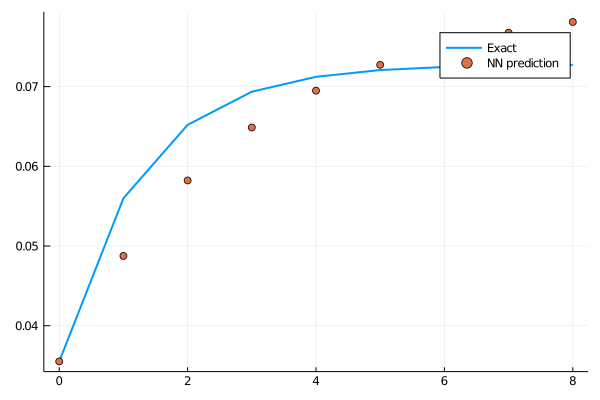

loss: 0.000923:  46%|██████████████████▉                      |  ETA: 0:00:32

0.0009049335f0

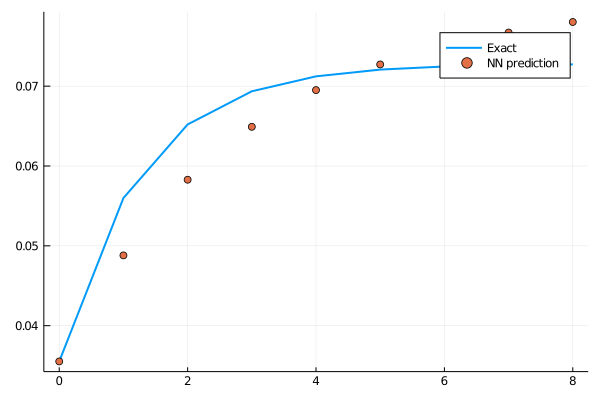

loss: 0.000905:  46%|███████████████████                      |  ETA: 0:00:32

0.00088687276f0

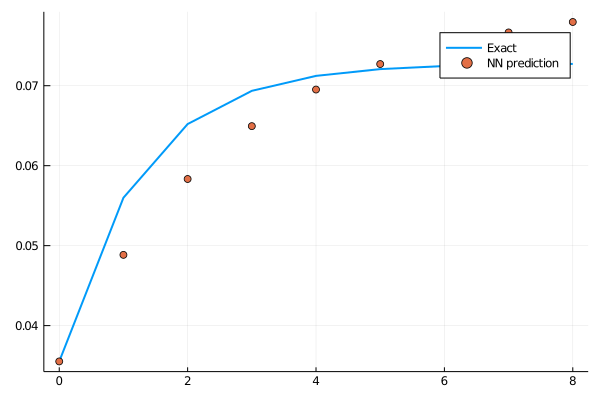

loss: 0.000887:  47%|███████████████████▏                     |  ETA: 0:00:32

0.0008691961f0

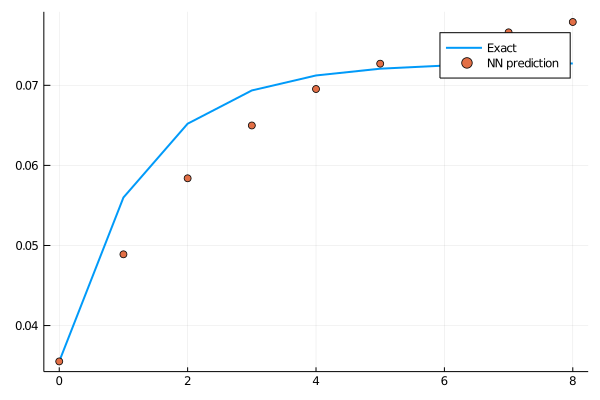

loss: 0.000869:  47%|███████████████████▎                     |  ETA: 0:00:31

0.0008518868f0

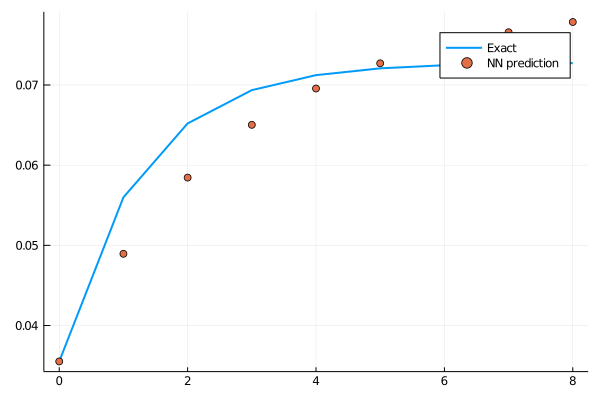

loss: 0.000852:  47%|███████████████████▍                     |  ETA: 0:00:31

0.0008349316f0

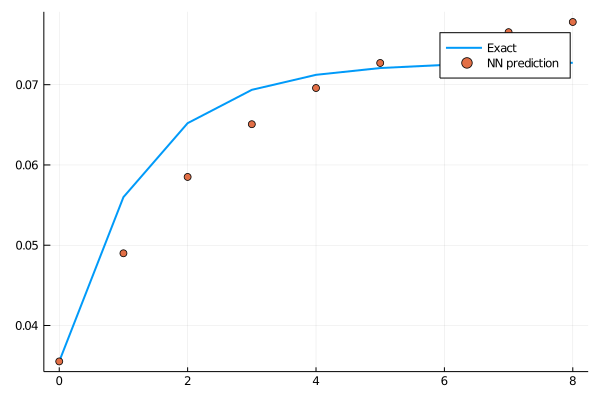

loss: 0.000835:  48%|███████████████████▌                     |  ETA: 0:00:31

0.0008183149f0

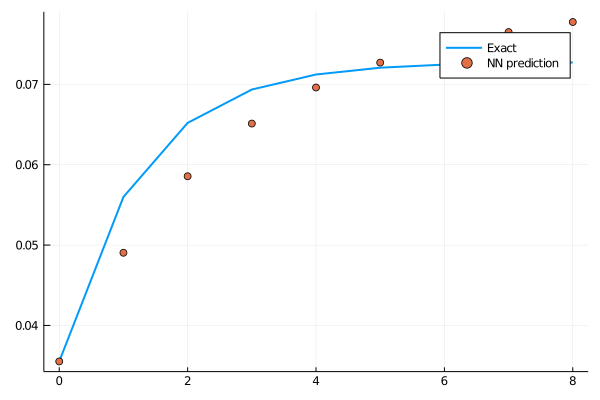

loss: 0.000818:  48%|███████████████████▋                     |  ETA: 0:00:31

0.000802036f0

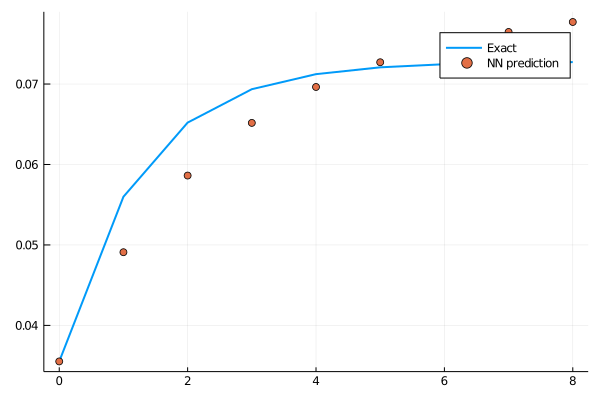

loss: 0.000802:  48%|███████████████████▊                     |  ETA: 0:00:30

0.0007860964f0

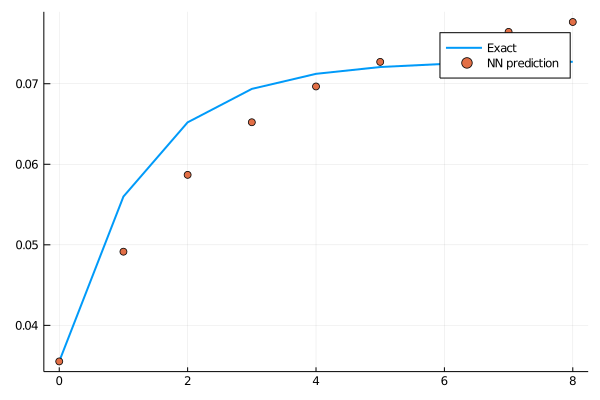

loss: 0.000786:  49%|███████████████████▉                     |  ETA: 0:00:30

0.00077049114f0

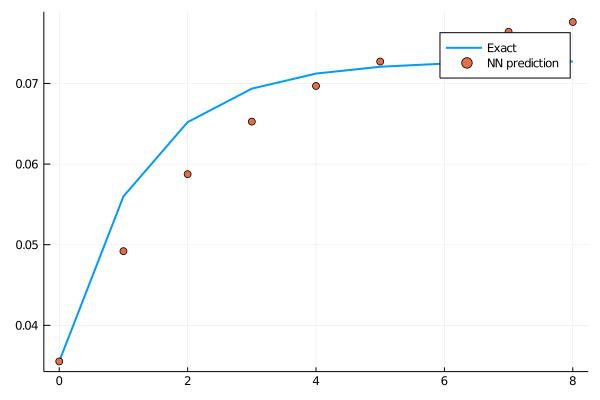

loss: 0.00077:  49%|████████████████████▏                    |  ETA: 0:00:30

0.00075520895f0

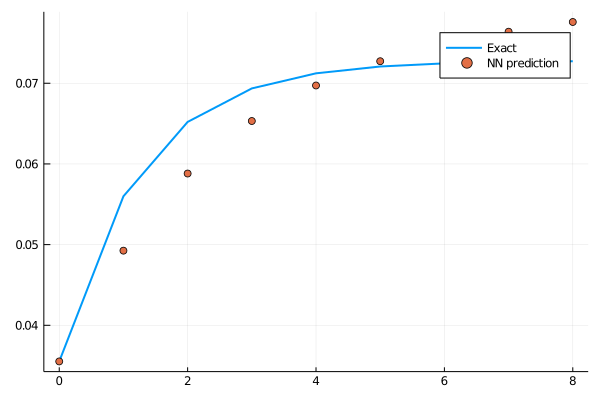

loss: 0.000755:  49%|████████████████████▎                    |  ETA: 0:00:30

0.000740241f0

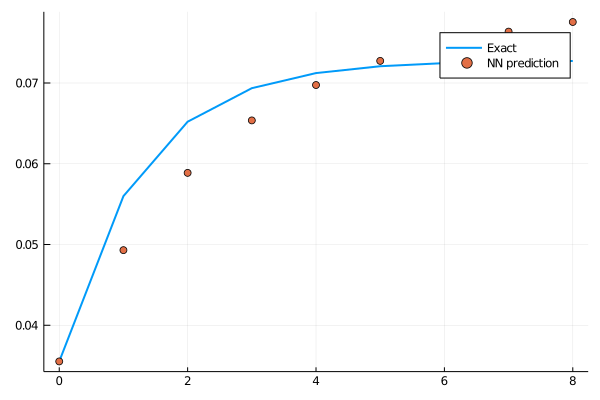

loss: 0.00074:  50%|████████████████████▍                    |  ETA: 0:00:30

0.0007255774f0

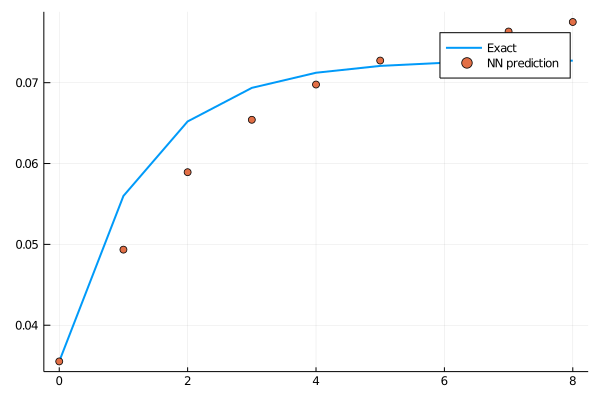

loss: 0.000726:  50%|████████████████████▌                    |  ETA: 0:00:29

0.00071121554f0

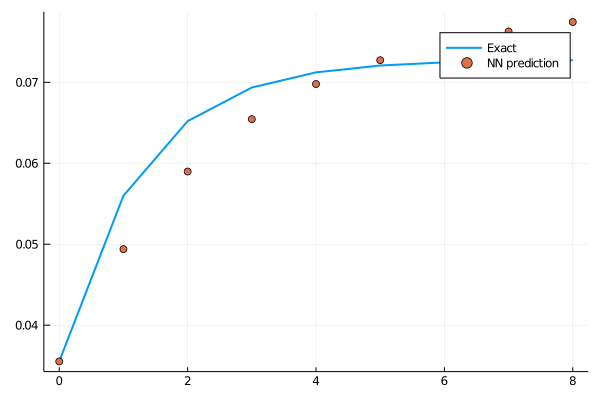

loss: 0.000711:  50%|████████████████████▋                    |  ETA: 0:00:29

0.0006971549f0

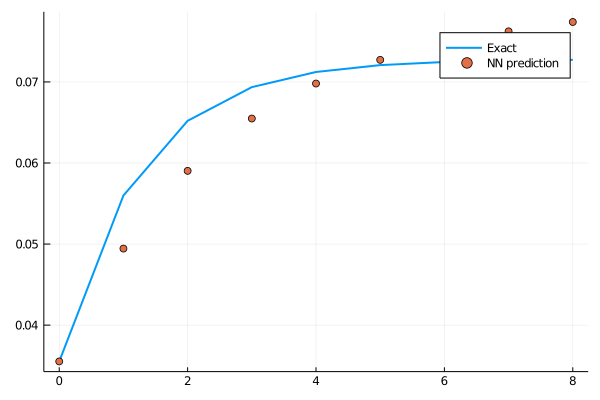

loss: 0.000697:  51%|████████████████████▊                    |  ETA: 0:00:29

0.0006833864f0

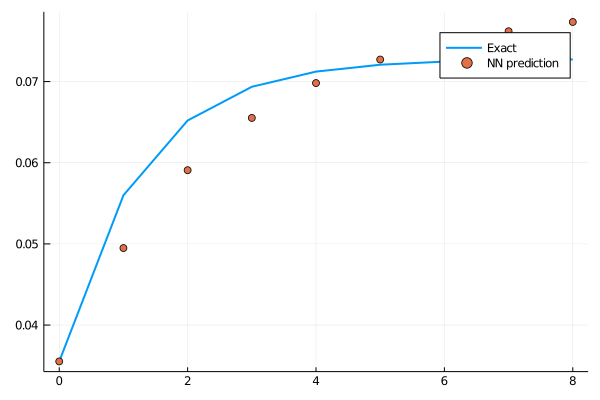

loss: 0.000683:  51%|████████████████████▉                    |  ETA: 0:00:29

0.0006699047f0

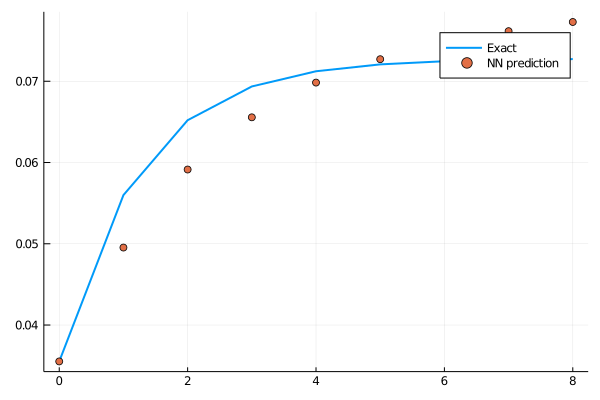

loss: 0.00067:  51%|█████████████████████                    |  ETA: 0:00:28

0.0006566987f0

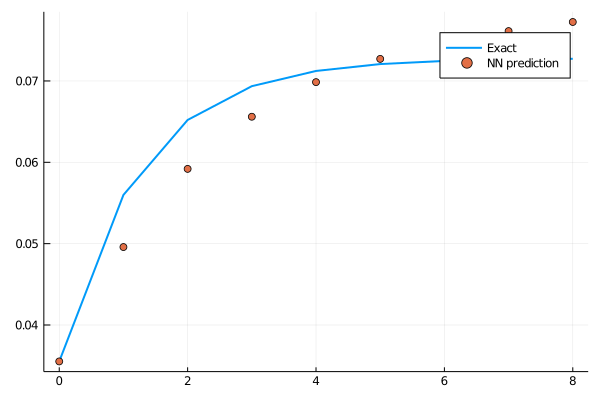

loss: 0.000657:  52%|█████████████████████▏                   |  ETA: 0:00:28

0.0006437657f0

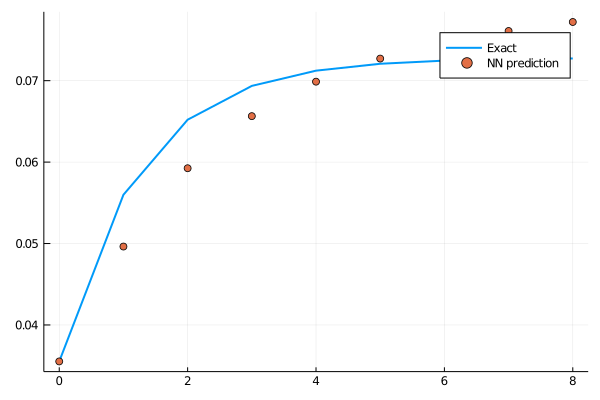

loss: 0.000644:  52%|█████████████████████▍                   |  ETA: 0:00:28

0.00063109916f0

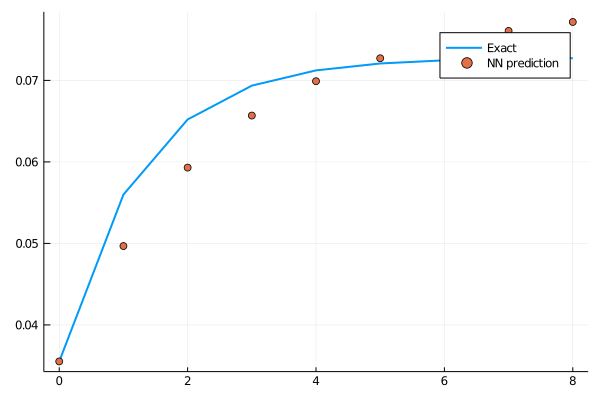

loss: 0.000631:  52%|█████████████████████▌                   |  ETA: 0:00:28

0.00061869825f0

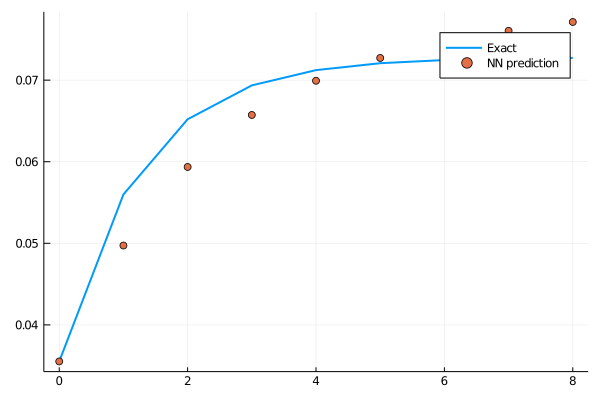

loss: 0.000619:  53%|█████████████████████▋                   |  ETA: 0:00:28

0.0006065525f0

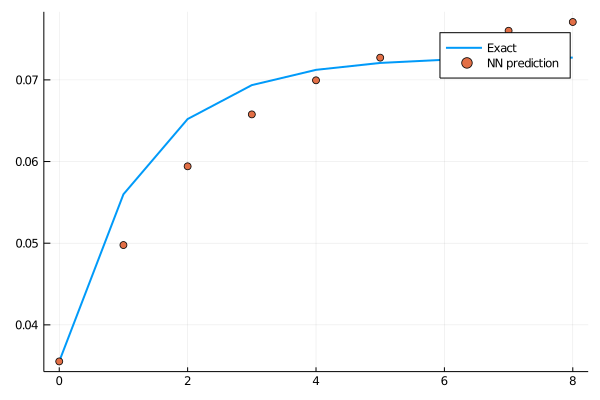

loss: 0.000607:  53%|█████████████████████▊                   |  ETA: 0:00:27

0.0005946591f0

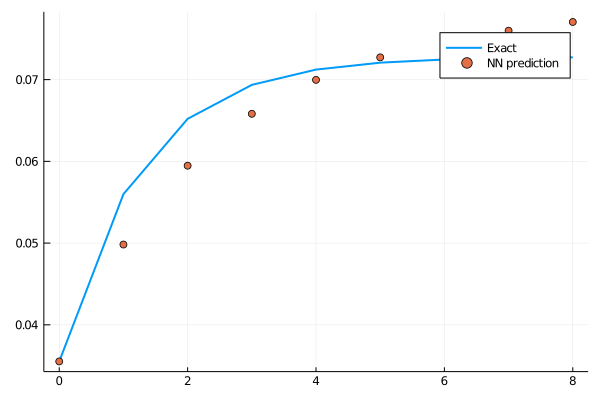

loss: 0.000595:  53%|█████████████████████▉                   |  ETA: 0:00:27

0.0005830116f0

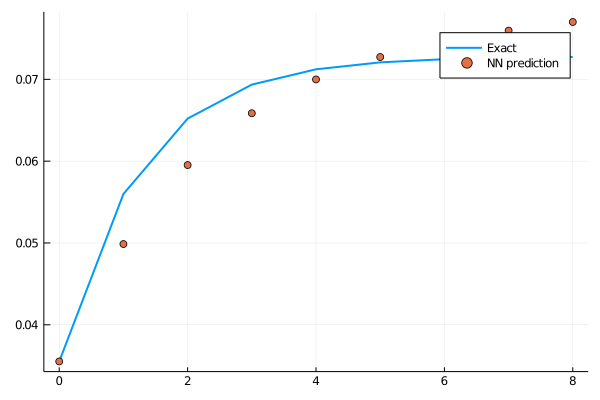

loss: 0.000583:  54%|██████████████████████                   |  ETA: 0:00:27

0.0005716004f0

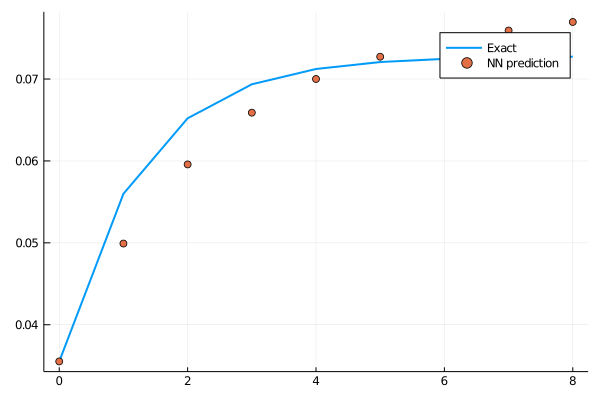

loss: 0.000572:  54%|██████████████████████▏                  |  ETA: 0:00:27

0.0005604286f0

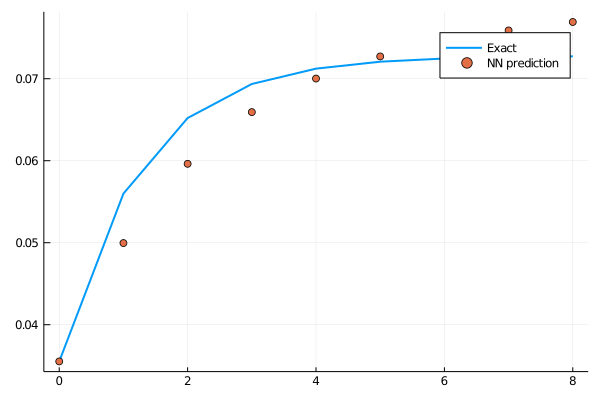

loss: 0.00056:  54%|██████████████████████▎                  |  ETA: 0:00:27

0.0005494862f0

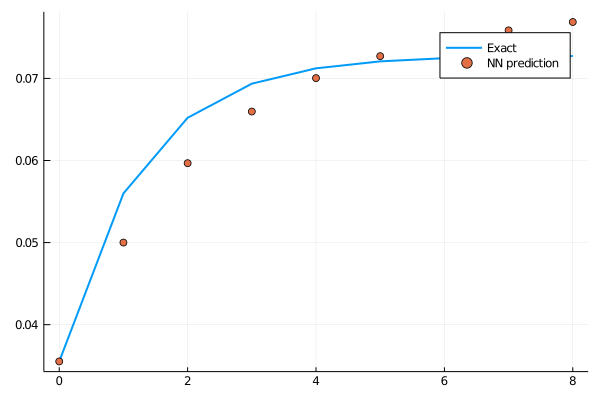

loss: 0.000549:  55%|██████████████████████▍                  |  ETA: 0:00:26

0.00053877366f0

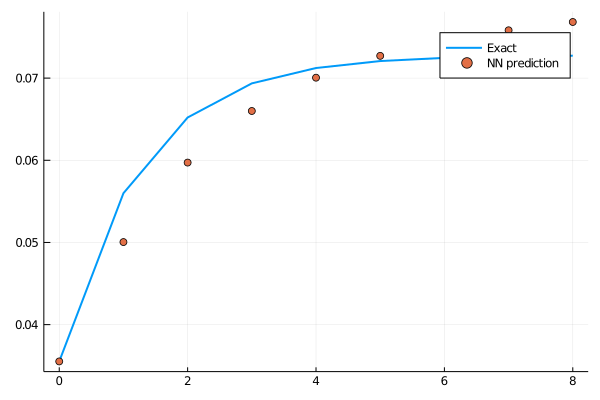

loss: 0.000539:  55%|██████████████████████▌                  |  ETA: 0:00:26

0.00052827963f0

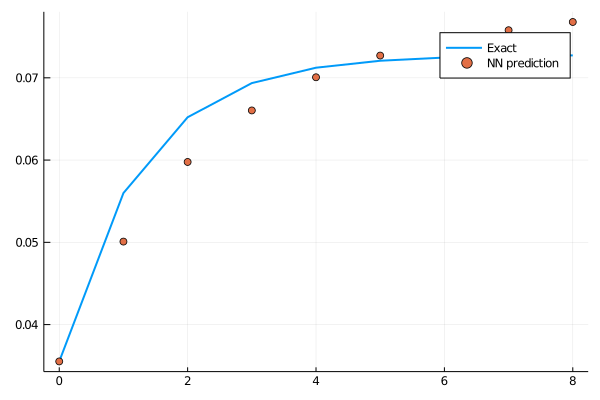

loss: 0.000528:  55%|██████████████████████▋                  |  ETA: 0:00:26

0.00051800197f0

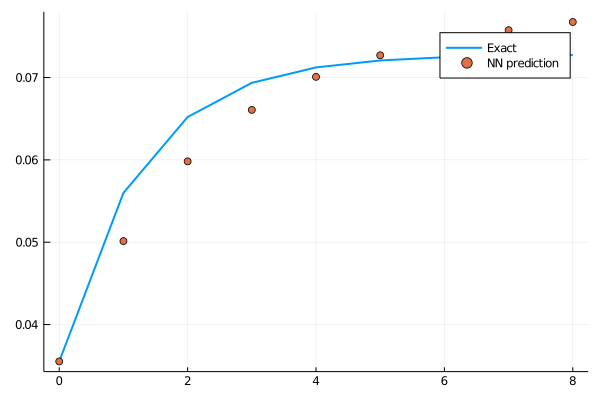

loss: 0.000518:  56%|██████████████████████▊                  |  ETA: 0:00:26

0.0005079344f0

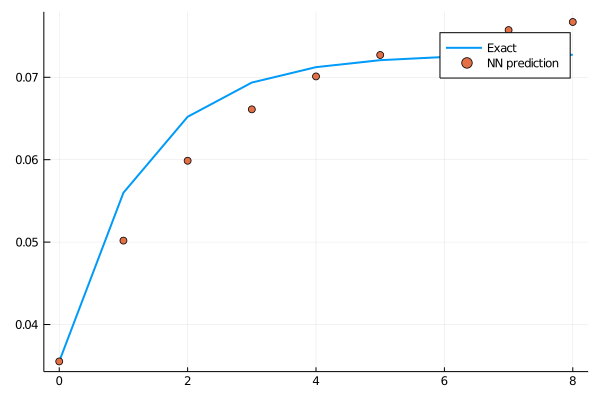

loss: 0.000508:  56%|███████████████████████                  |  ETA: 0:00:25

0.00049807574f0

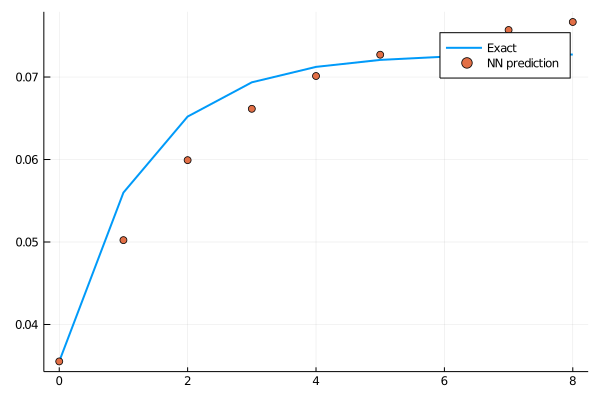

loss: 0.000498:  56%|███████████████████████▏                 |  ETA: 0:00:25

0.0004884181f0

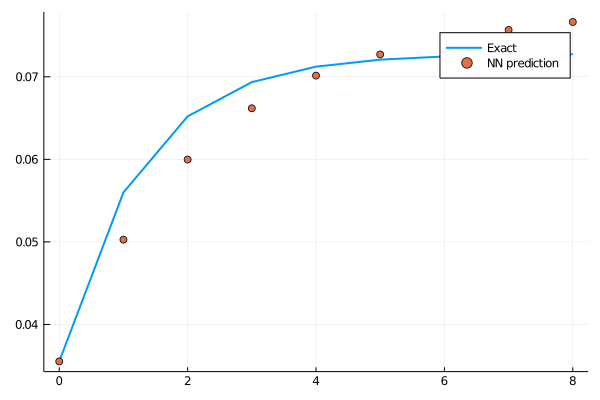

loss: 0.000488:  57%|███████████████████████▎                 |  ETA: 0:00:25

0.0004789607f0

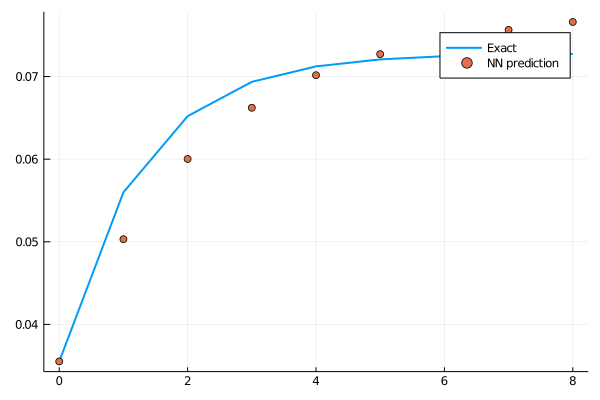

loss: 0.000479:  57%|███████████████████████▍                 |  ETA: 0:00:25

0.00046969505f0

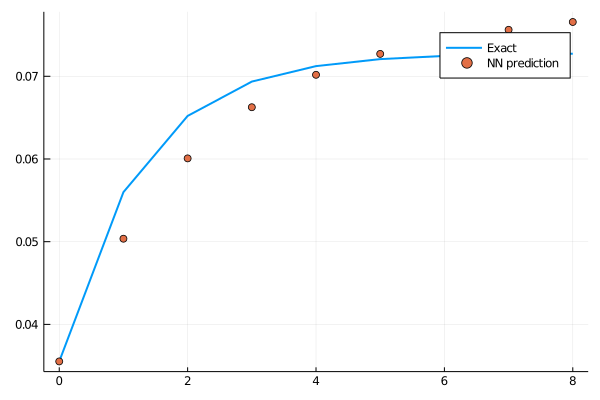

loss: 0.00047:  57%|███████████████████████▌                 |  ETA: 0:00:25

0.0004606225f0

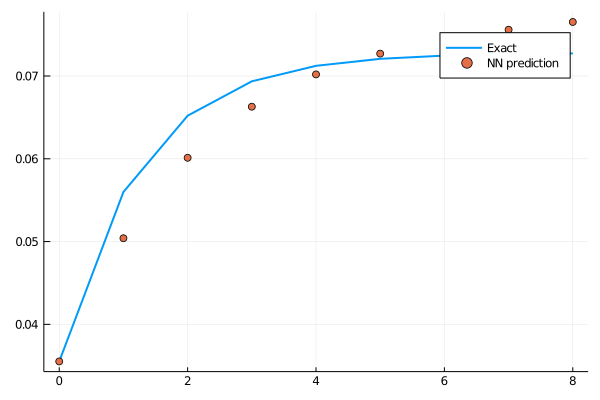

loss: 0.000461:  58%|███████████████████████▋                 |  ETA: 0:00:24

0.00045173505f0

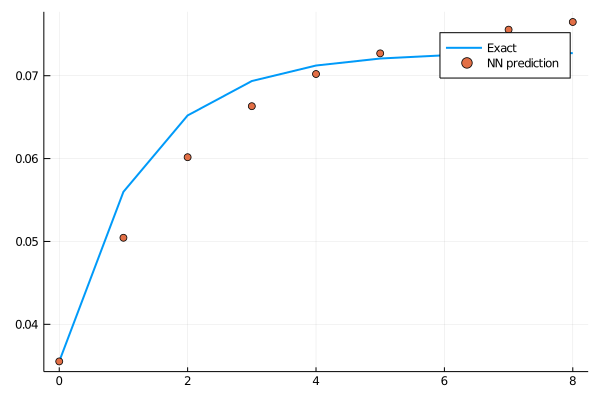

loss: 0.000452:  58%|███████████████████████▊                 |  ETA: 0:00:24

0.00044302878f0

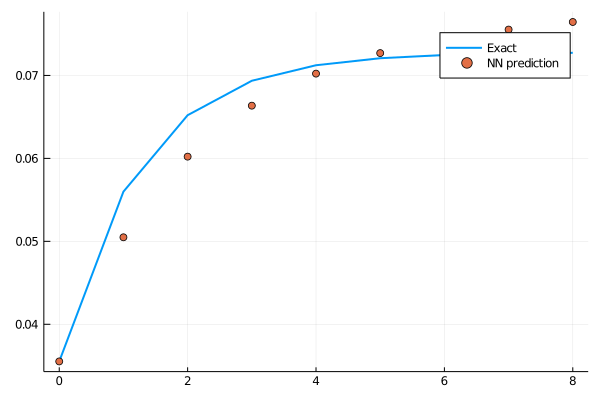

loss: 0.000443:  58%|███████████████████████▉                 |  ETA: 0:00:24

0.00043450046f0

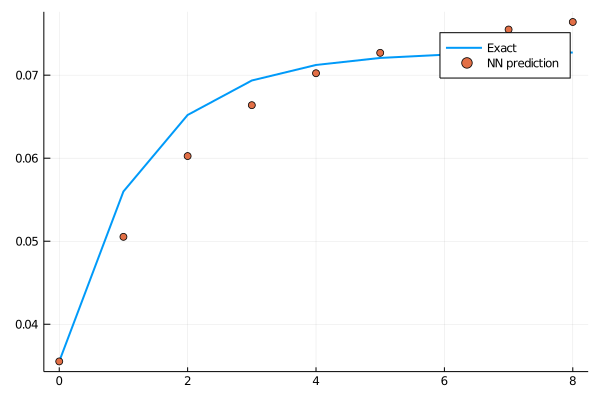

loss: 0.000435:  59%|████████████████████████                 |  ETA: 0:00:24

0.0004261483f0

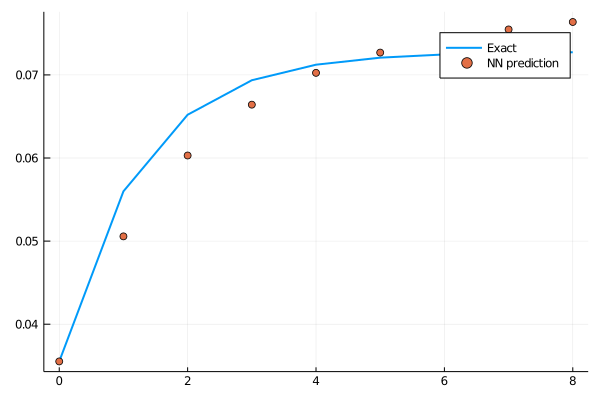

loss: 0.000426:  59%|████████████████████████▎                |  ETA: 0:00:23

0.00041796415f0

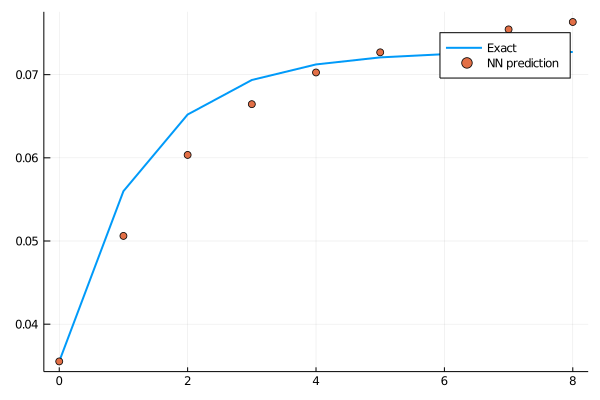

loss: 0.000418:  59%|████████████████████████▍                |  ETA: 0:00:23

0.00040994794f0

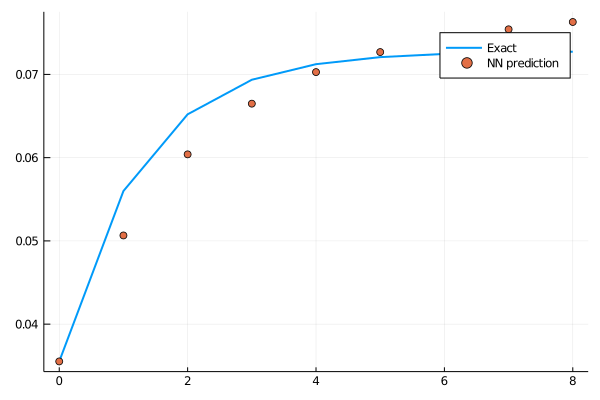

loss: 0.00041:  60%|████████████████████████▍                |  ETA: 0:00:23

0.00040209442f0

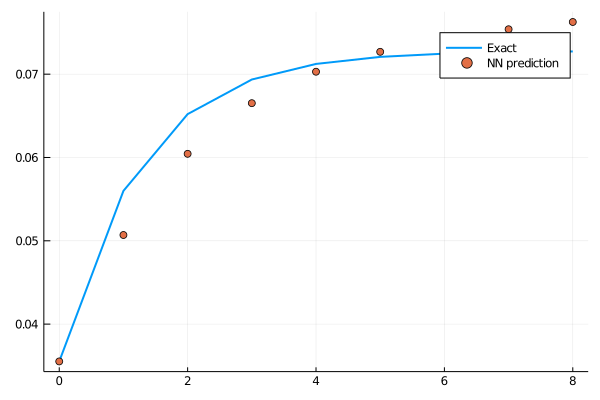

loss: 0.000402:  60%|████████████████████████▋                |  ETA: 0:00:23

0.00039440067f0

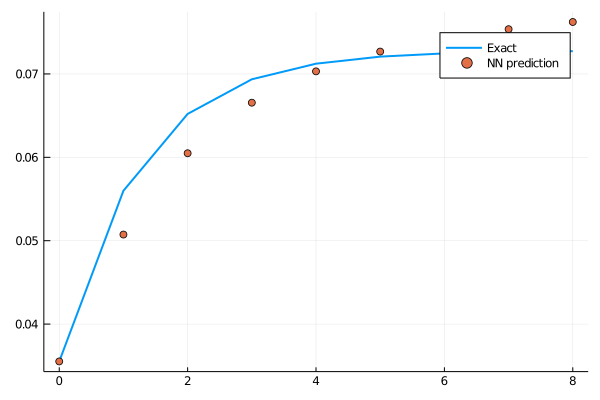

loss: 0.000394:  60%|████████████████████████▊                |  ETA: 0:00:23

0.0003868622f0

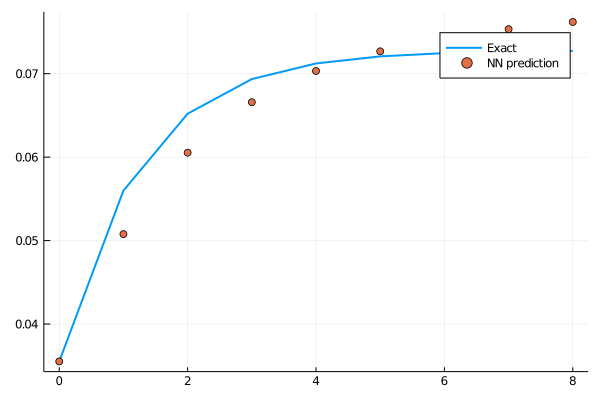

loss: 0.000387:  61%|████████████████████████▉                |  ETA: 0:00:23

0.0003794799f0

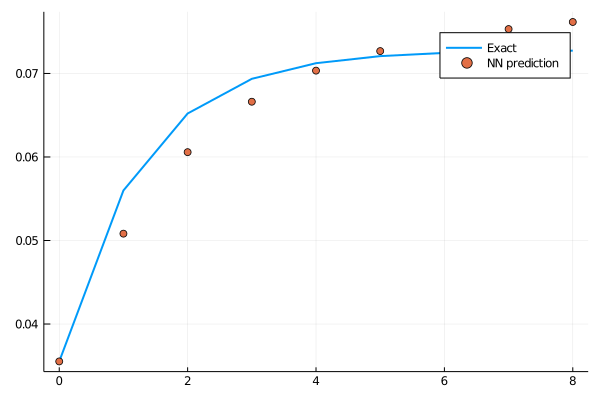

loss: 0.000379:  61%|█████████████████████████                |  ETA: 0:00:22

0.000372244f0

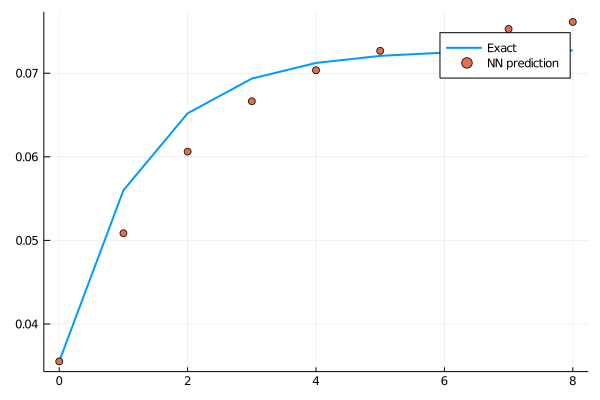

loss: 0.000372:  61%|█████████████████████████▏               |  ETA: 0:00:22

0.00036515613f0

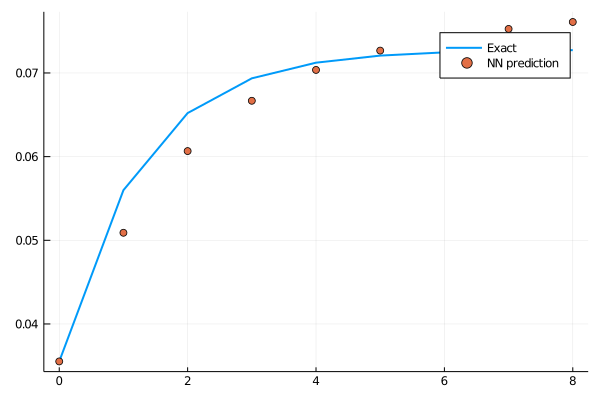

loss: 0.000365:  62%|█████████████████████████▎               |  ETA: 0:00:22

0.00035821073f0

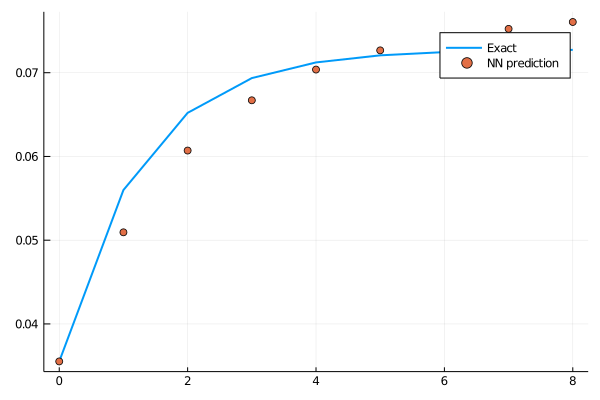

loss: 0.000358:  62%|█████████████████████████▍               |  ETA: 0:00:22

0.0003514058f0

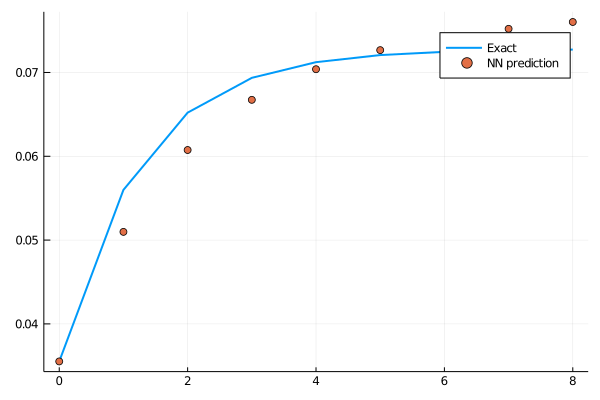

loss: 0.000351:  62%|█████████████████████████▌               |  ETA: 0:00:21

0.00034473787f0

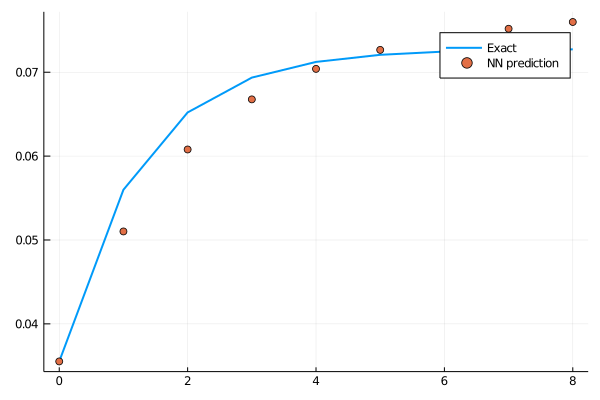

loss: 0.000345:  63%|█████████████████████████▋               |  ETA: 0:00:21

0.00033820412f0

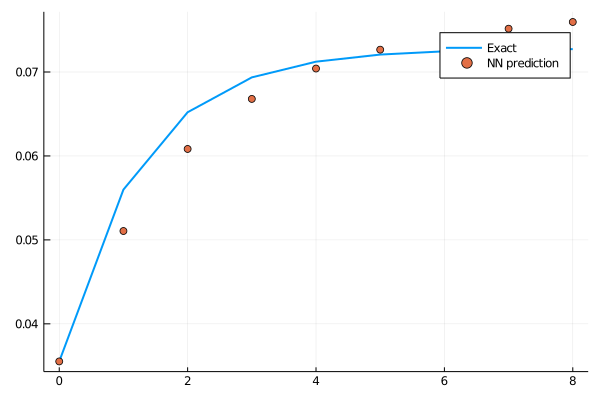

loss: 0.000338:  63%|█████████████████████████▉               |  ETA: 0:00:21

0.00033180174f0

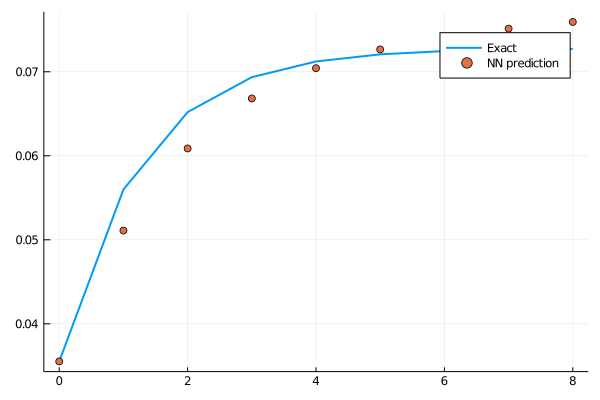

loss: 0.000332:  63%|██████████████████████████               |  ETA: 0:00:21

0.00032552736f0

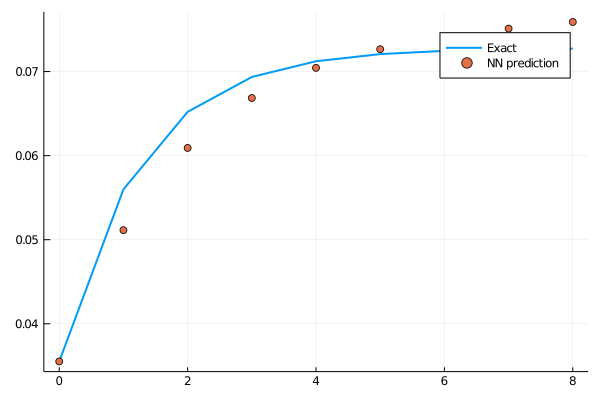

loss: 0.000326:  64%|██████████████████████████▏              |  ETA: 0:00:21

0.00031937982f0

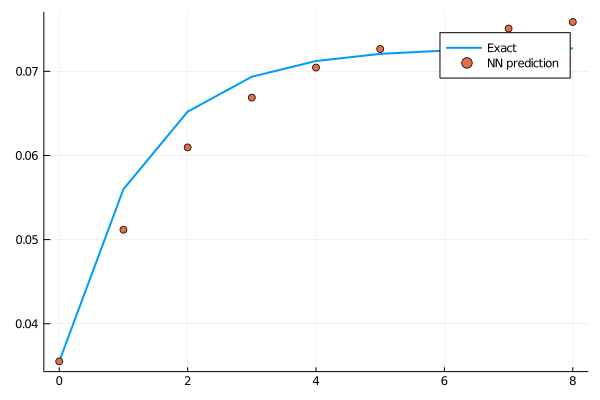

loss: 0.000319:  64%|██████████████████████████▎              |  ETA: 0:00:20

0.00031335434f0

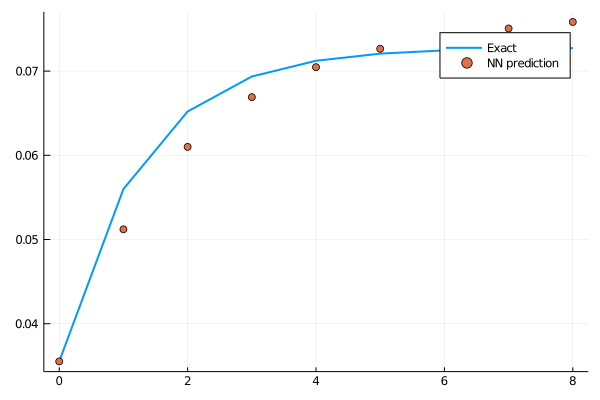

loss: 0.000313:  64%|██████████████████████████▍              |  ETA: 0:00:20

0.00030744963f0

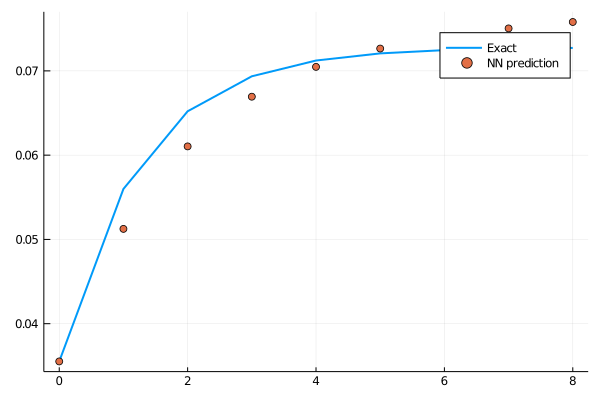

loss: 0.000307:  65%|██████████████████████████▌              |  ETA: 0:00:20

0.000301664f0

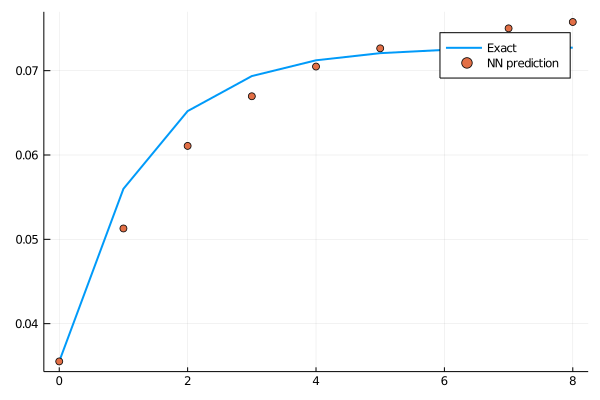

loss: 0.000302:  65%|██████████████████████████▋              |  ETA: 0:00:20

0.00029599335f0

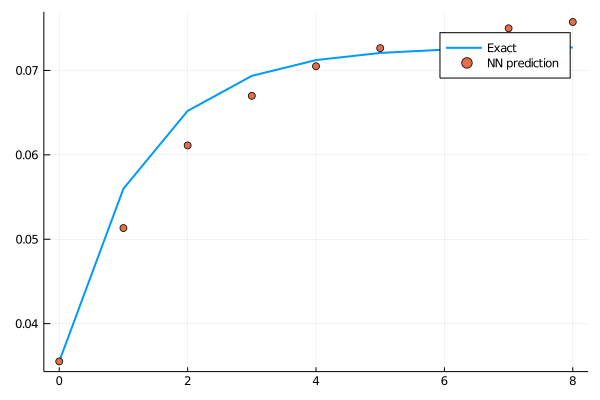

loss: 0.000296:  65%|██████████████████████████▊              |  ETA: 0:00:20

0.00029043495f0

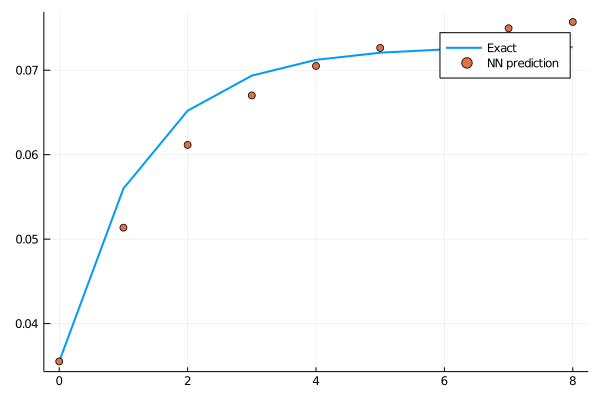

loss: 0.00029:  66%|██████████████████████████▉              |  ETA: 0:00:19

0.00028498756f0

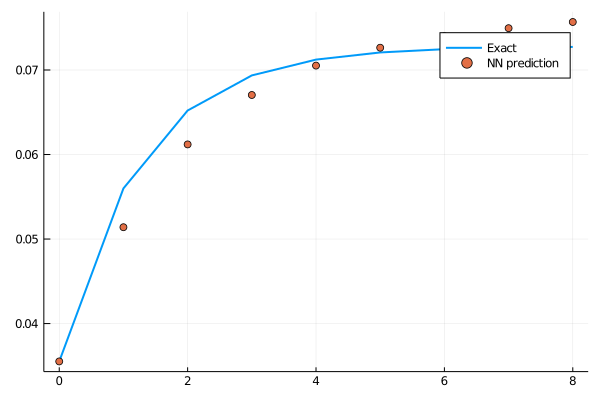

loss: 0.000285:  66%|███████████████████████████              |  ETA: 0:00:19

0.0002796476f0

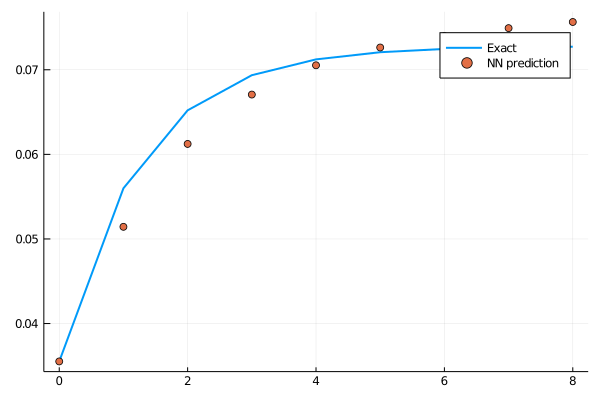

loss: 0.00028:  66%|███████████████████████████▏             |  ETA: 0:00:19

0.00027441478f0

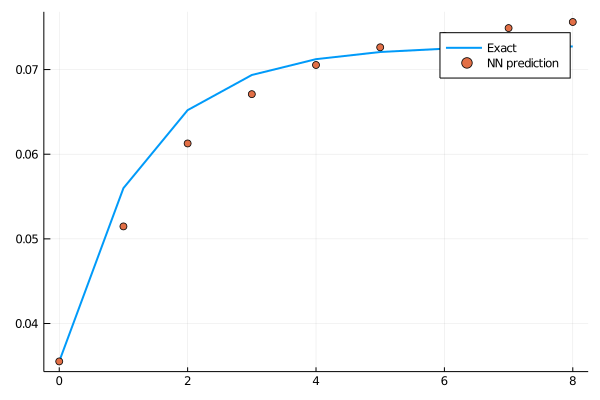

loss: 0.000274:  67%|███████████████████████████▎             |  ETA: 0:00:19

0.00026928433f0

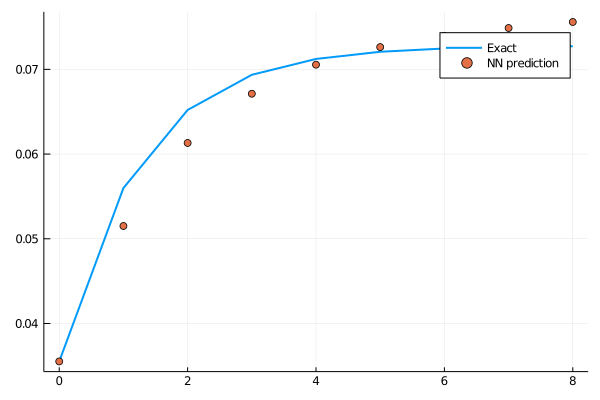

loss: 0.000269:  67%|███████████████████████████▌             |  ETA: 0:00:19

0.00026425533f0

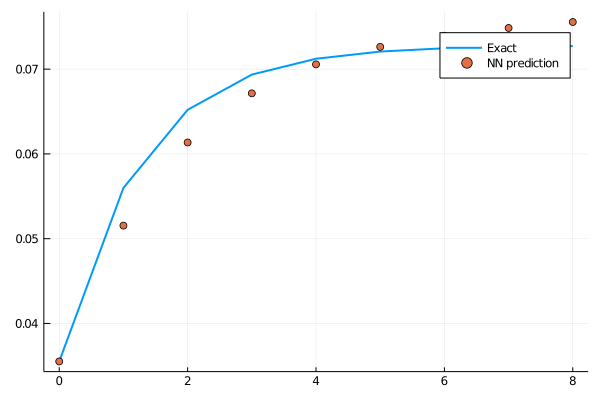

loss: 0.000264:  67%|███████████████████████████▋             |  ETA: 0:00:18

0.00025932895f0

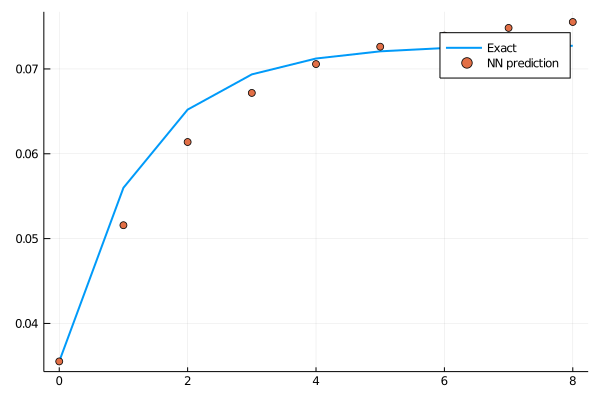

loss: 0.000259:  68%|███████████████████████████▊             |  ETA: 0:00:18

0.00025449652f0

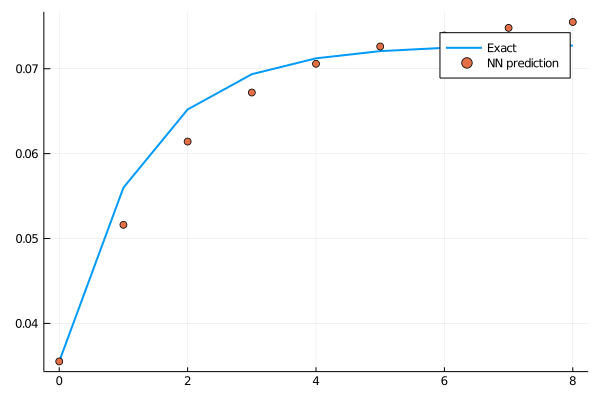

loss: 0.000254:  68%|███████████████████████████▉             |  ETA: 0:00:18

0.00024975924f0

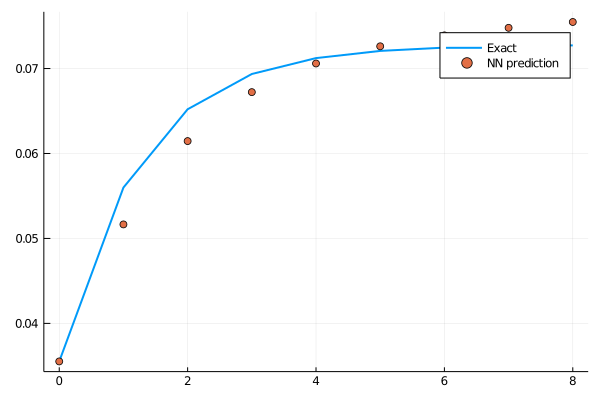

loss: 0.00025:  68%|████████████████████████████             |  ETA: 0:00:18

0.00024511662f0

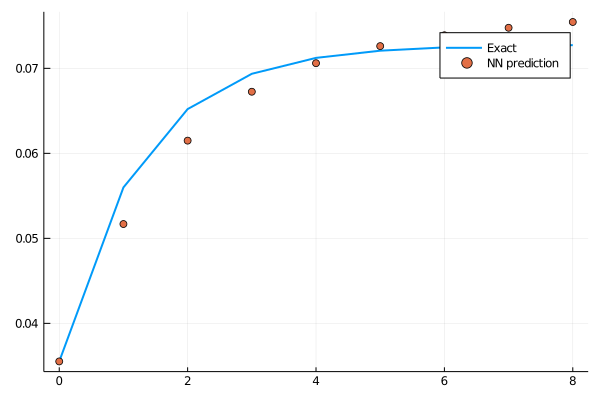

loss: 0.000245:  69%|████████████████████████████▏            |  ETA: 0:00:18

0.0002405646f0

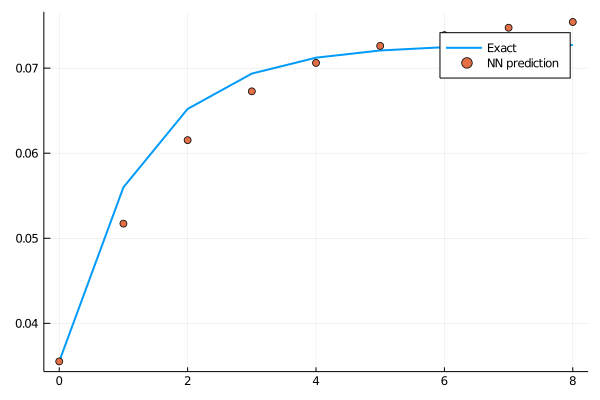

loss: 0.000241:  69%|████████████████████████████▎            |  ETA: 0:00:17

0.0002361025f0

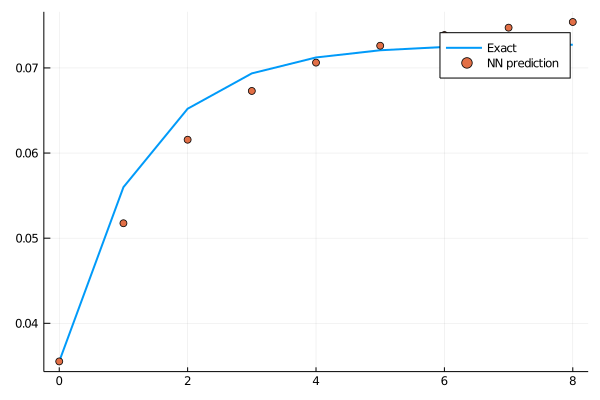

loss: 0.000236:  69%|████████████████████████████▍            |  ETA: 0:00:17

0.00023172743f0

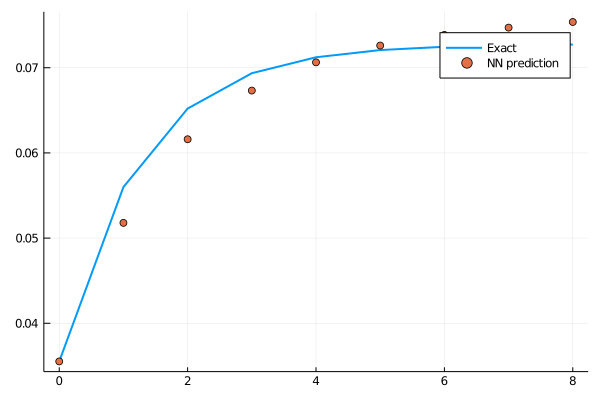

loss: 0.000232:  70%|████████████████████████████▌            |  ETA: 0:00:17

0.00022743762f0

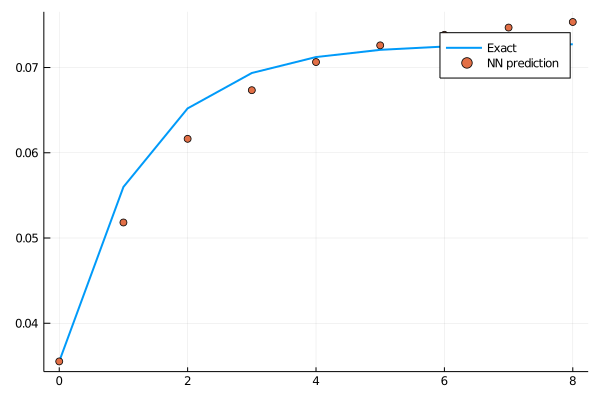

loss: 0.000227:  70%|████████████████████████████▊            |  ETA: 0:00:17

0.00022323198f0

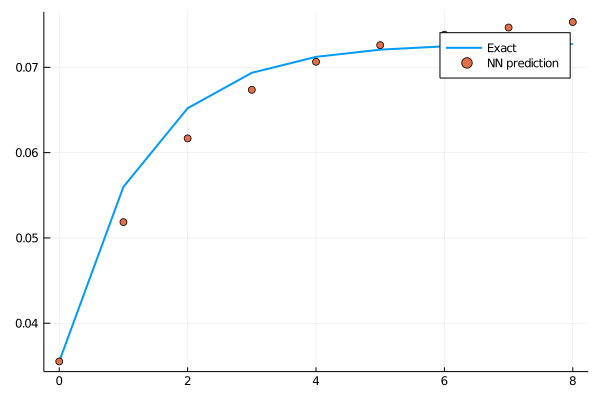

loss: 0.000223:  70%|████████████████████████████▉            |  ETA: 0:00:17

0.00021910868f0

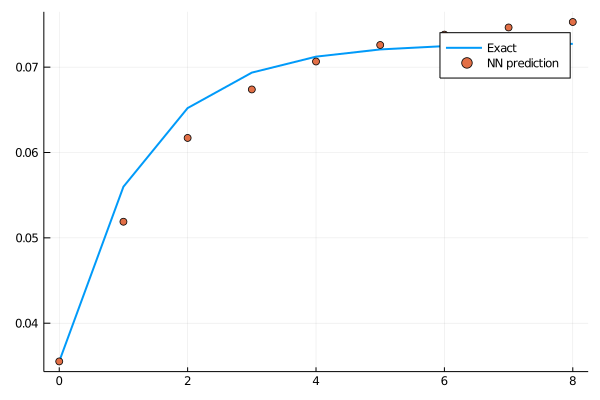

loss: 0.000219:  71%|█████████████████████████████            |  ETA: 0:00:16

0.00021506552f0

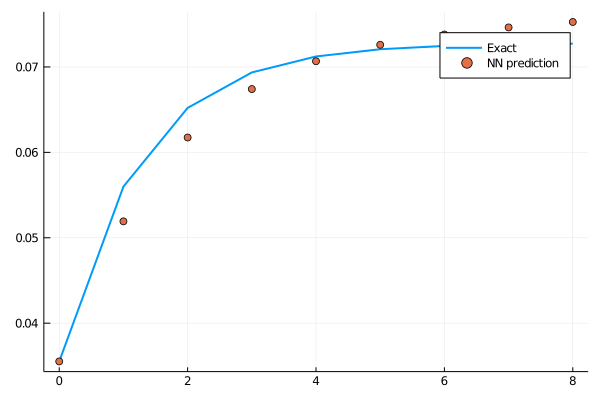

loss: 0.000215:  71%|█████████████████████████████▏           |  ETA: 0:00:16

0.00021110196f0

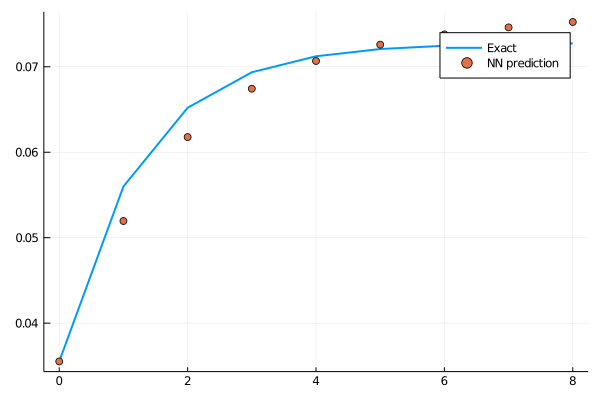

loss: 0.000211:  71%|█████████████████████████████▎           |  ETA: 0:00:16

0.00020721482f0

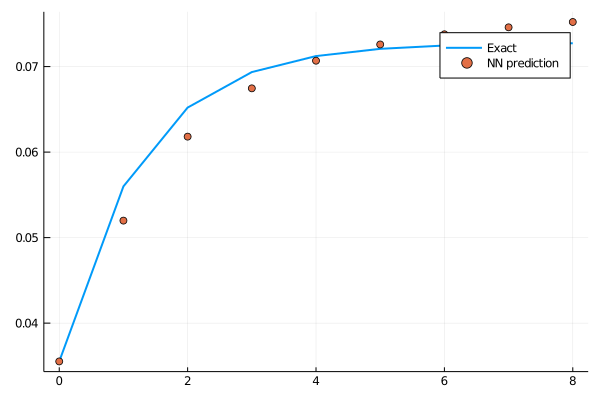

loss: 0.000207:  72%|█████████████████████████████▍           |  ETA: 0:00:16

0.00020340254f0

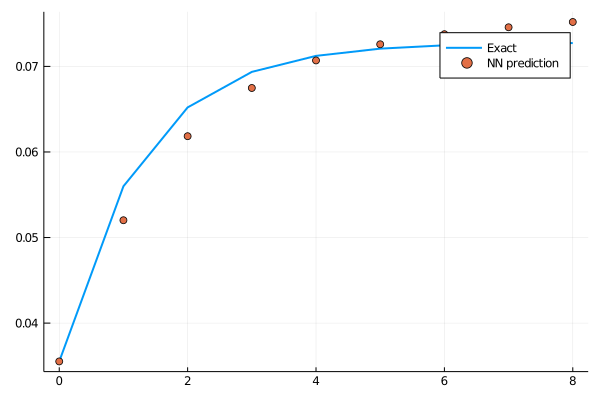

loss: 0.000203:  72%|█████████████████████████████▌           |  ETA: 0:00:16

0.00019966585f0

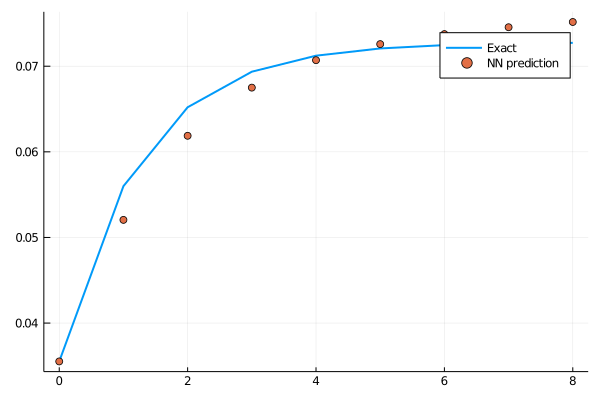

loss: 0.0002:  72%|█████████████████████████████▋           |  ETA: 0:00:15

0.00019599967f0

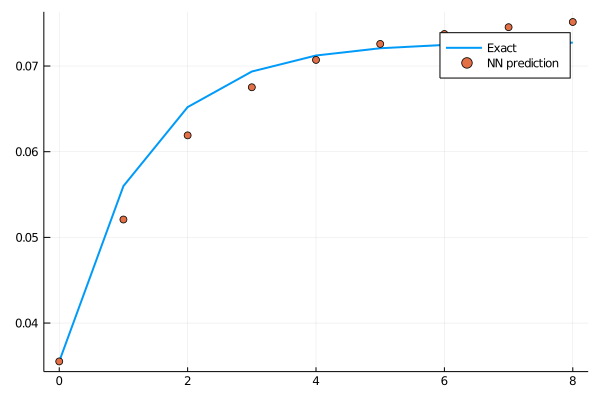

loss: 0.000196:  73%|█████████████████████████████▊           |  ETA: 0:00:15

0.0001924053f0

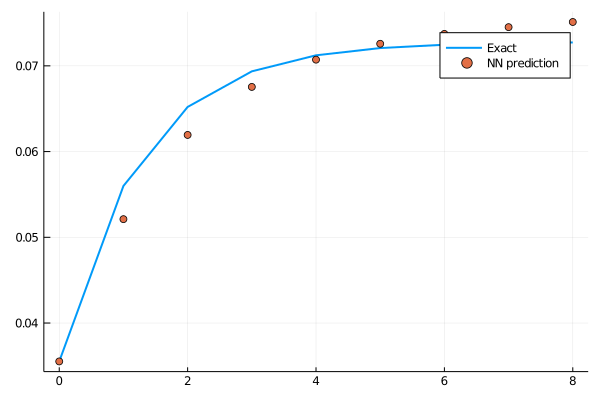

loss: 0.000192:  73%|█████████████████████████████▉           |  ETA: 0:00:15

0.00018888063f0

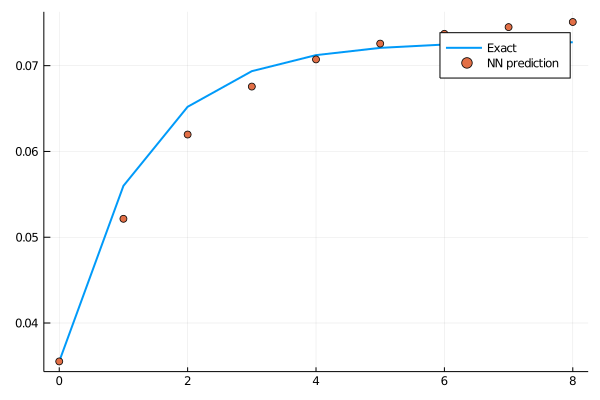

loss: 0.000189:  73%|██████████████████████████████           |  ETA: 0:00:15

0.00018542376f0

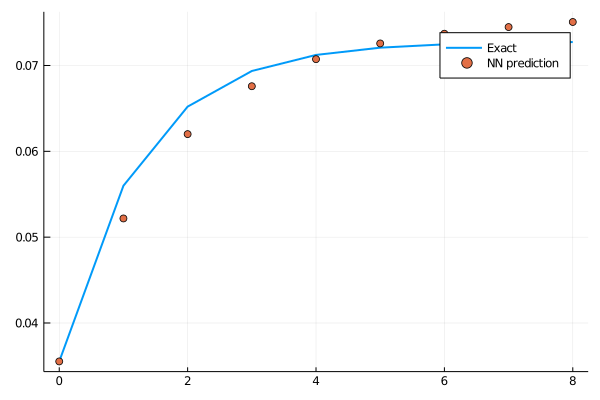

loss: 0.000185:  74%|██████████████████████████████▏          |  ETA: 0:00:15

0.0001820329f0

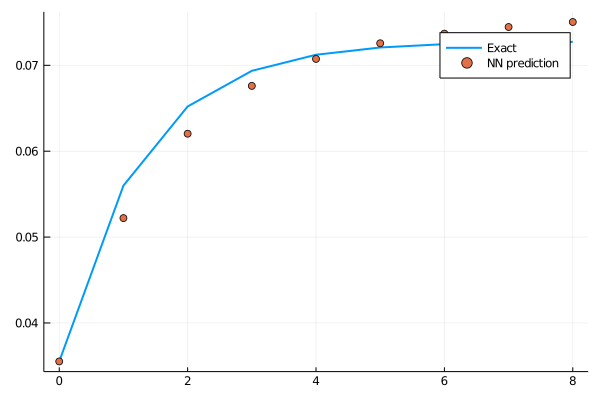

loss: 0.000182:  74%|██████████████████████████████▍          |  ETA: 0:00:15

0.00017870672f0

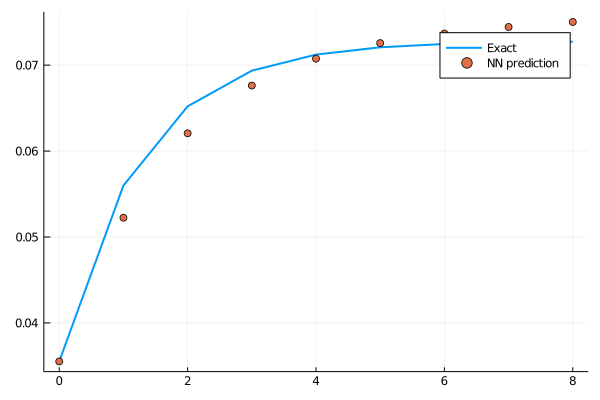

loss: 0.000179:  74%|██████████████████████████████▌          |  ETA: 0:00:14

0.00017544677f0

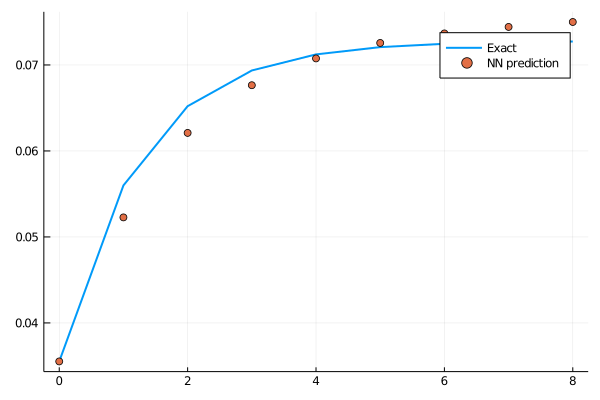

loss: 0.000175:  75%|██████████████████████████████▋          |  ETA: 0:00:14

0.00017224881f0

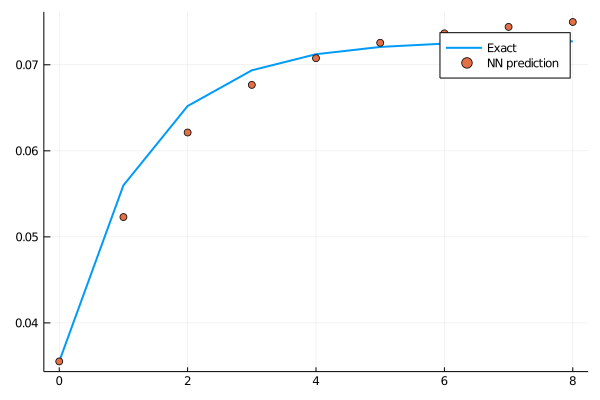

loss: 0.000172:  75%|██████████████████████████████▊          |  ETA: 0:00:14

0.00016911107f0

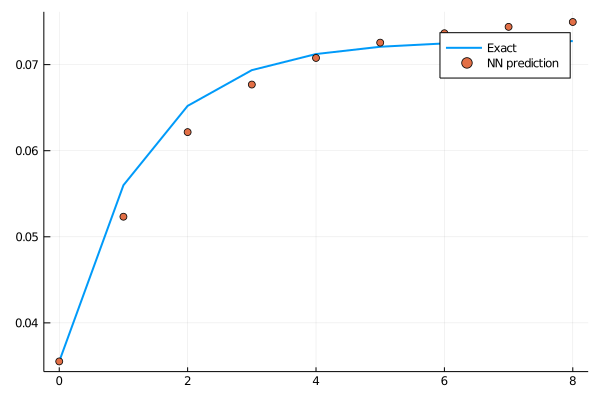

loss: 0.000169:  75%|██████████████████████████████▉          |  ETA: 0:00:14

0.0001660323f0

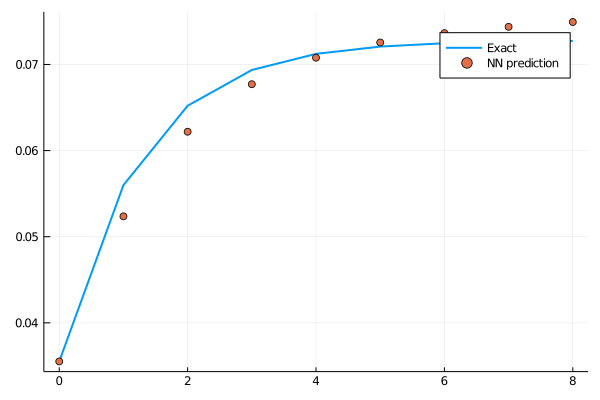

loss: 0.000166:  76%|███████████████████████████████          |  ETA: 0:00:14

0.00016301419f0

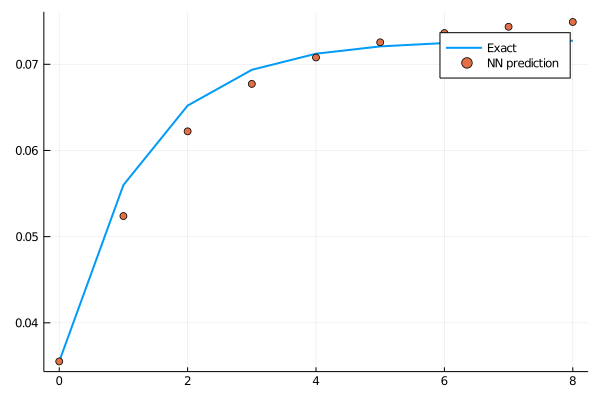

loss: 0.000163:  76%|███████████████████████████████▏         |  ETA: 0:00:13

0.00016005448f0

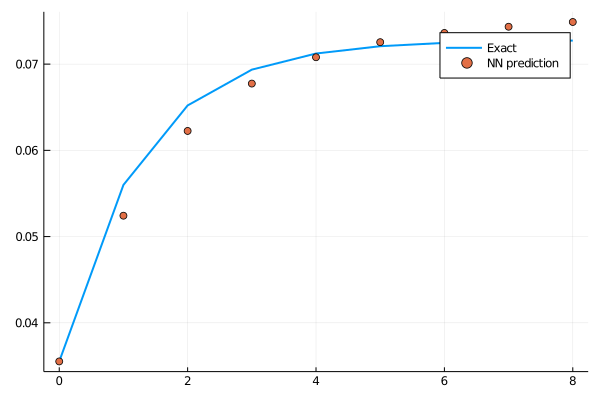

loss: 0.00016:  76%|███████████████████████████████▎         |  ETA: 0:00:13

0.00015714946f0

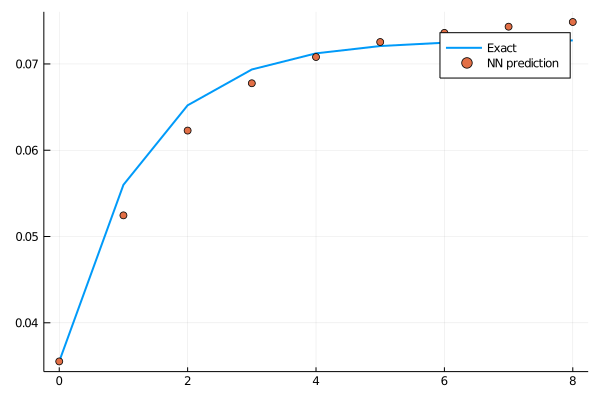

loss: 0.000157:  77%|███████████████████████████████▍         |  ETA: 0:00:13

0.00015430231f0

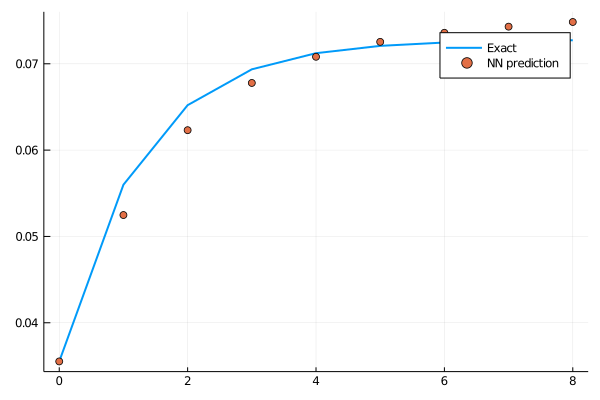

loss: 0.000154:  77%|███████████████████████████████▋         |  ETA: 0:00:13

0.00015150609f0

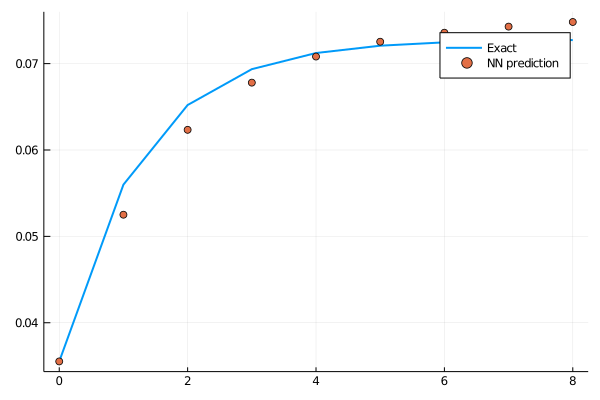

loss: 0.000152:  77%|███████████████████████████████▊         |  ETA: 0:00:13

0.00014876638f0

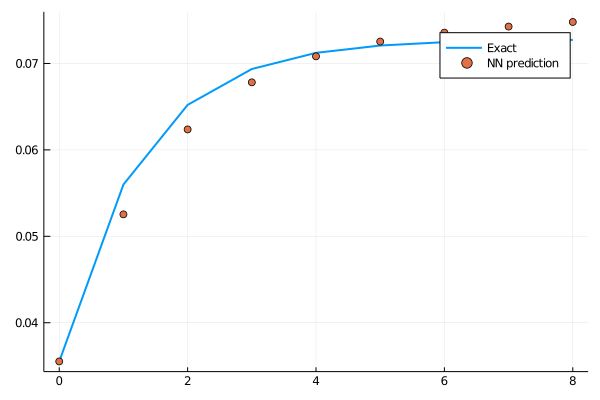

loss: 0.000149:  78%|███████████████████████████████▉         |  ETA: 0:00:12

0.00014607575f0

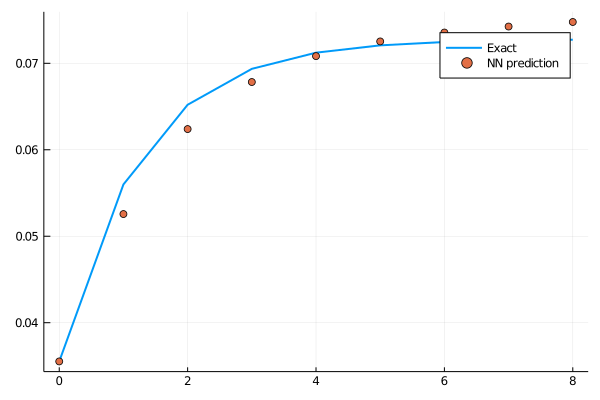

loss: 0.000146:  78%|████████████████████████████████         |  ETA: 0:00:12

0.00014343677f0

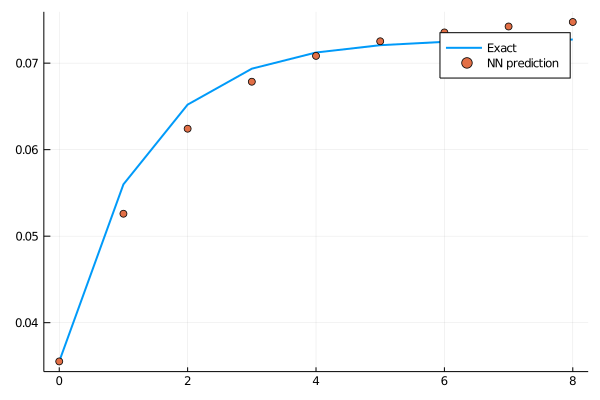

loss: 0.000143:  78%|████████████████████████████████▏        |  ETA: 0:00:12

0.00014084905f0

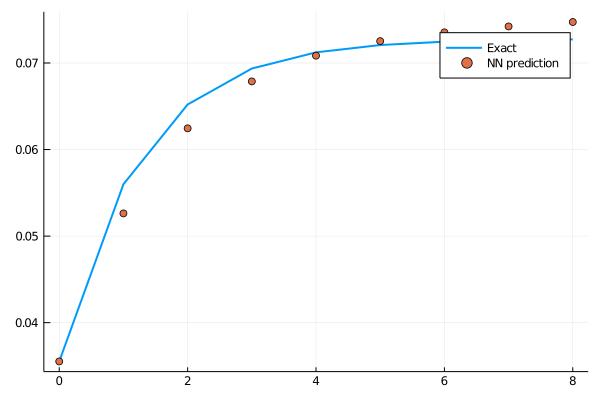

loss: 0.000141:  79%|████████████████████████████████▎        |  ETA: 0:00:12

0.00013831005f0

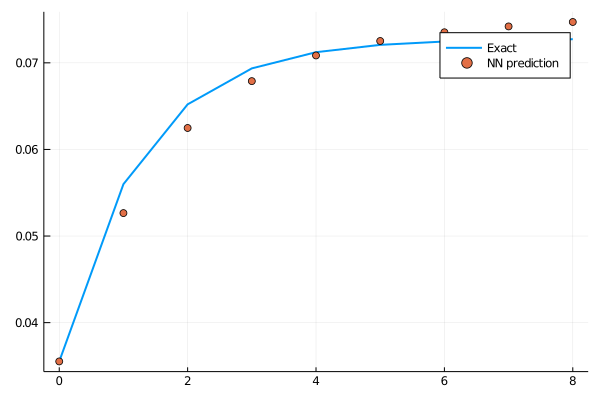

loss: 0.000138:  79%|████████████████████████████████▍        |  ETA: 0:00:12

0.00013581873f0

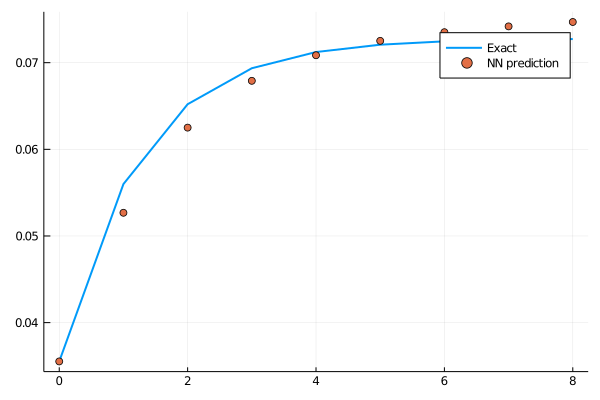

loss: 0.000136:  79%|████████████████████████████████▌        |  ETA: 0:00:12

0.0001333744f0

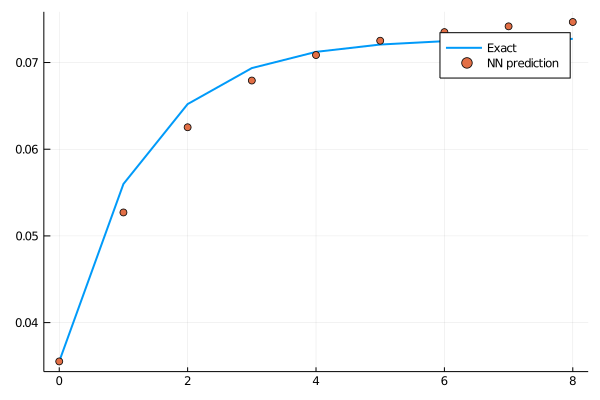

loss: 0.000133:  80%|████████████████████████████████▋        |  ETA: 0:00:11

0.00013097655f0

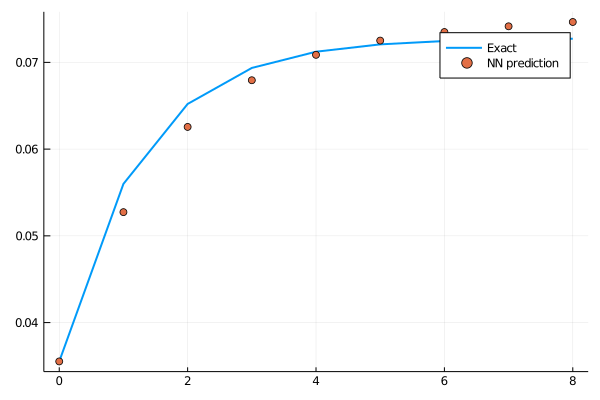

loss: 0.000131:  80%|████████████████████████████████▊        |  ETA: 0:00:11

0.00012862362f0

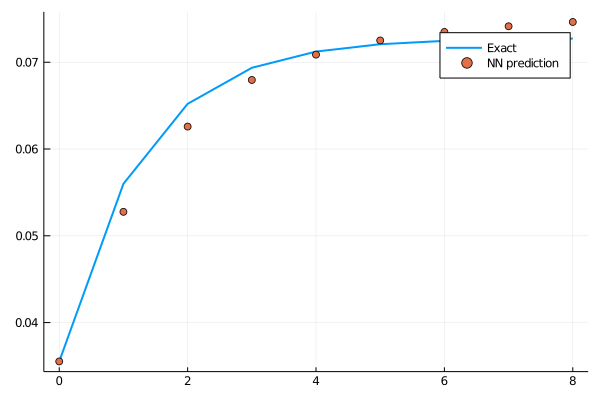

loss: 0.000129:  80%|████████████████████████████████▉        |  ETA: 0:00:11

0.00012631448f0

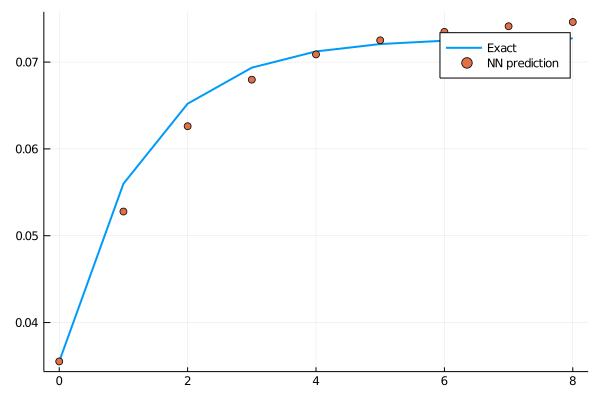

loss: 0.000126:  81%|█████████████████████████████████        |  ETA: 0:00:11

0.00012405048f0

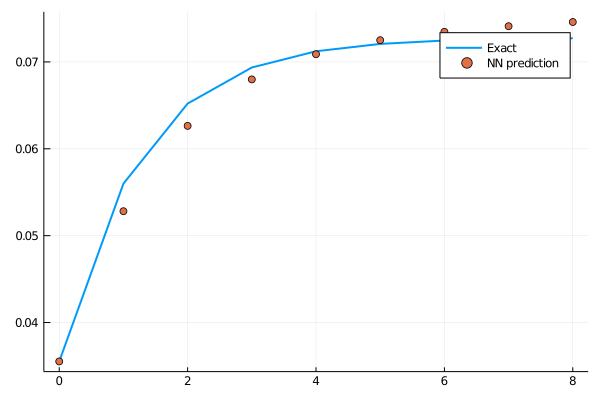

loss: 0.000124:  81%|█████████████████████████████████▎       |  ETA: 0:00:11

0.00012182712f0

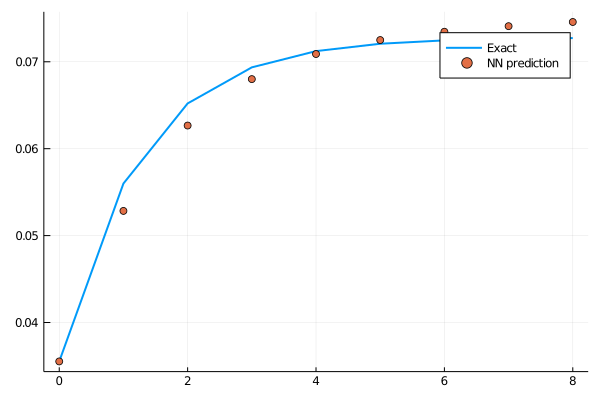

loss: 0.000122:  81%|█████████████████████████████████▍       |  ETA: 0:00:10

0.00011964726f0

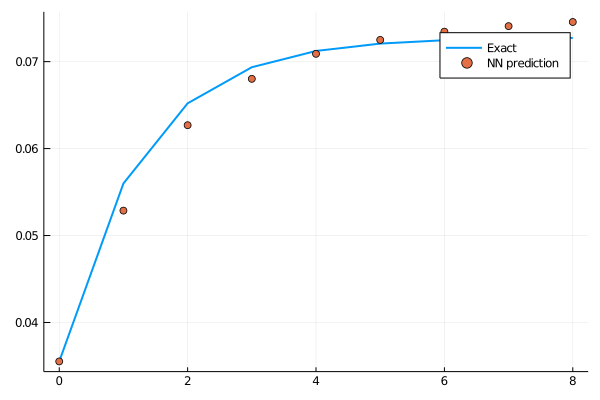

loss: 0.00012:  82%|█████████████████████████████████▌       |  ETA: 0:00:10

0.00011750667f0

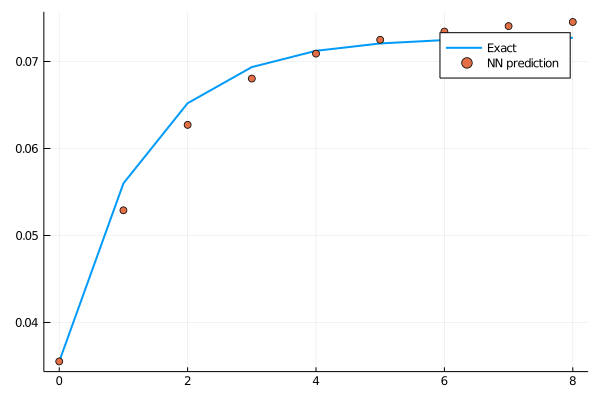

loss: 0.000118:  82%|█████████████████████████████████▋       |  ETA: 0:00:10

0.00011540682f0

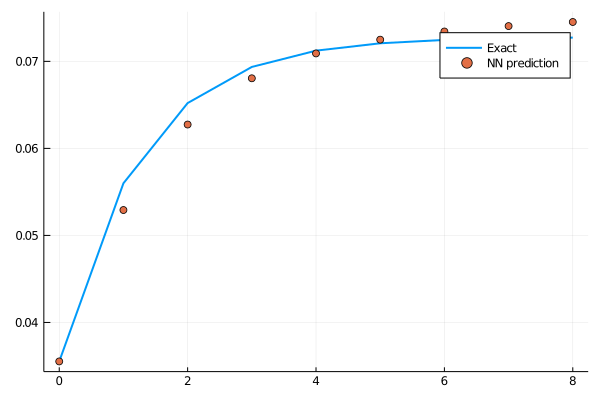

loss: 0.000115:  82%|█████████████████████████████████▊       |  ETA: 0:00:10

0.0001133464f0

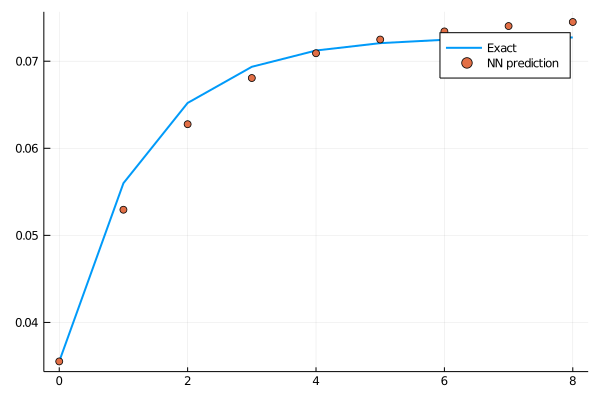

loss: 0.000113:  83%|█████████████████████████████████▉       |  ETA: 0:00:10

0.000111324465f0

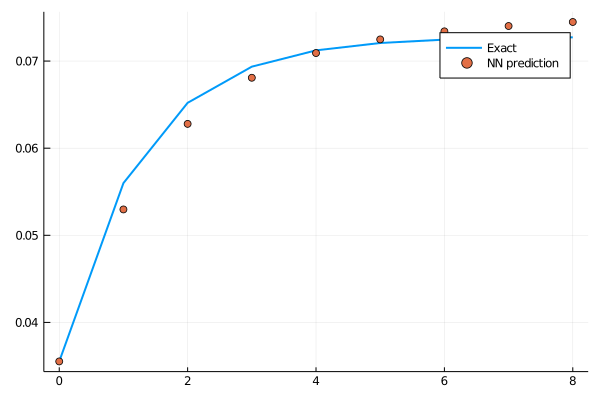

loss: 0.000111:  83%|██████████████████████████████████       |  ETA: 0:00:09

0.00010934081f0

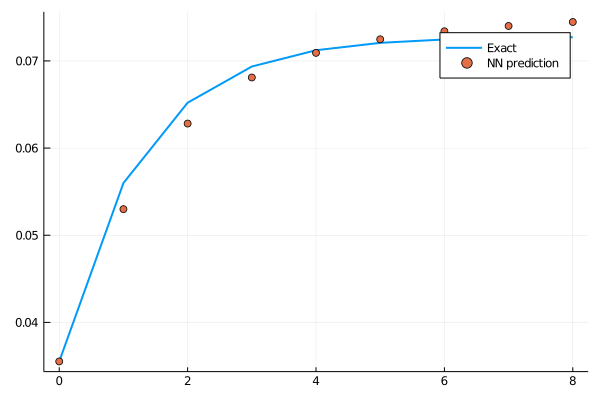

loss: 0.000109:  83%|██████████████████████████████████▏      |  ETA: 0:00:09

0.00010739321f0

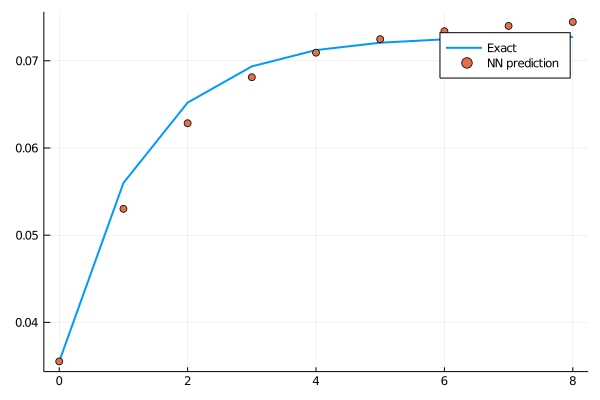

loss: 0.000107:  84%|██████████████████████████████████▎      |  ETA: 0:00:09

0.000105482504f0

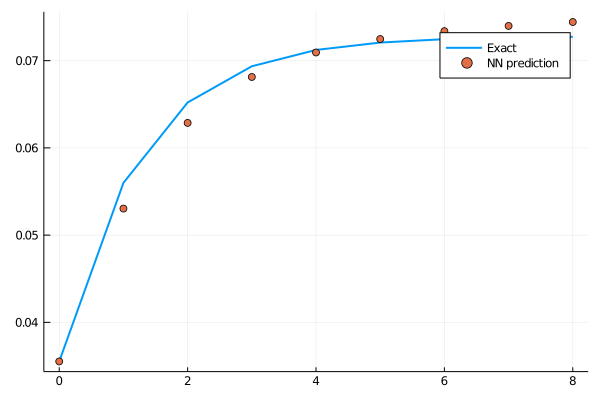

loss: 0.000105:  84%|██████████████████████████████████▌      |  ETA: 0:00:09

0.00010360726f0

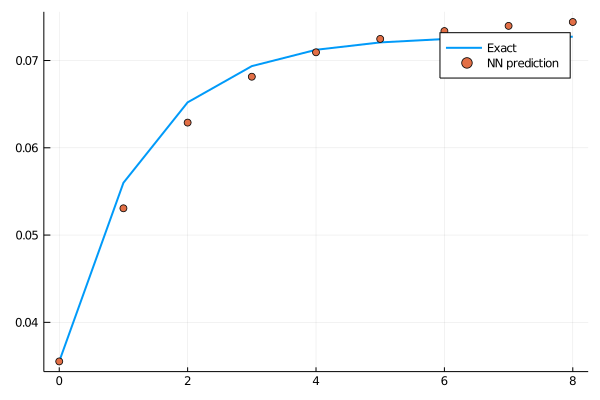

loss: 0.000104:  84%|██████████████████████████████████▋      |  ETA: 0:00:09

0.00010176691f0

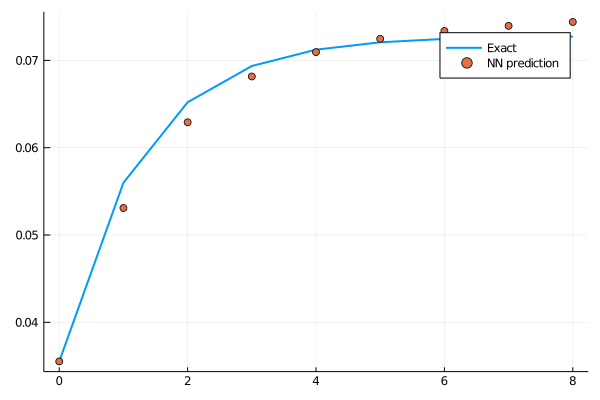

loss: 0.000102:  85%|██████████████████████████████████▋      |  ETA: 0:00:09

9.996086f-5

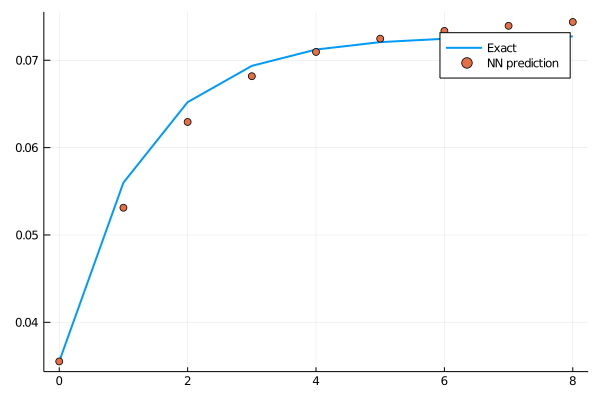

loss: 1e-04:  85%|██████████████████████████████████▉      |  ETA: 0:00:08

9.818803f-5

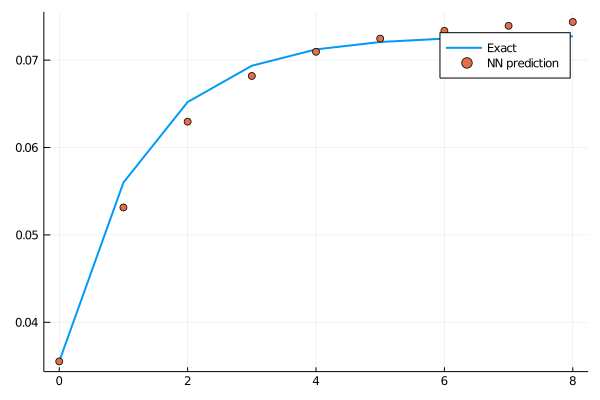

loss: 9.82e-05:  85%|███████████████████████████████████      |  ETA: 0:00:08

9.644839f-5

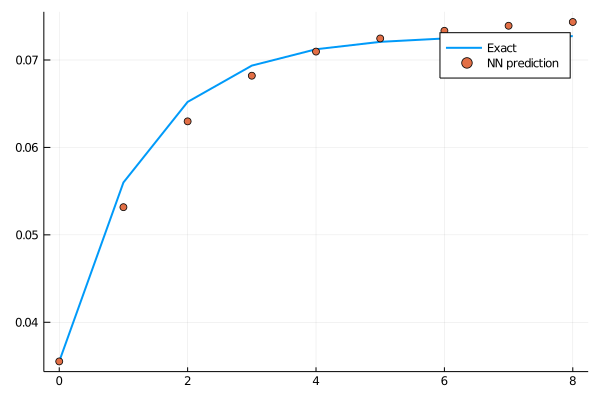

loss: 9.64e-05:  86%|███████████████████████████████████▏     |  ETA: 0:00:08

9.474142f-5

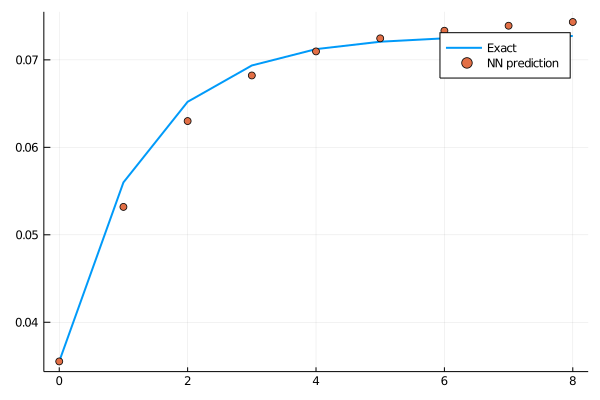

loss: 9.47e-05:  86%|███████████████████████████████████▎     |  ETA: 0:00:08

9.306529f-5

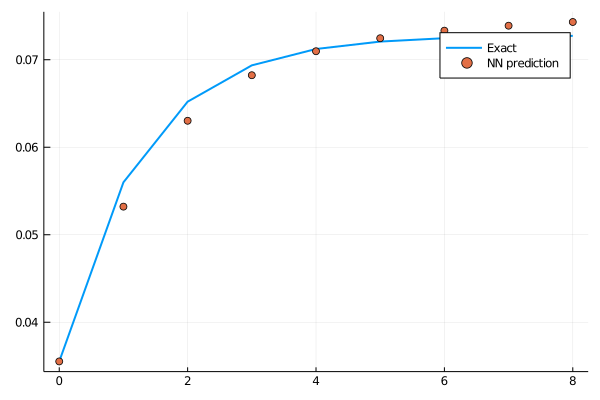

loss: 9.31e-05:  86%|███████████████████████████████████▍     |  ETA: 0:00:08

9.142055f-5

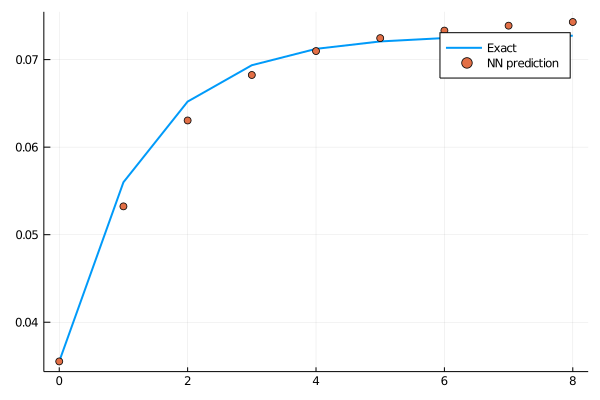

loss: 9.14e-05:  87%|███████████████████████████████████▌     |  ETA: 0:00:07

8.980623f-5

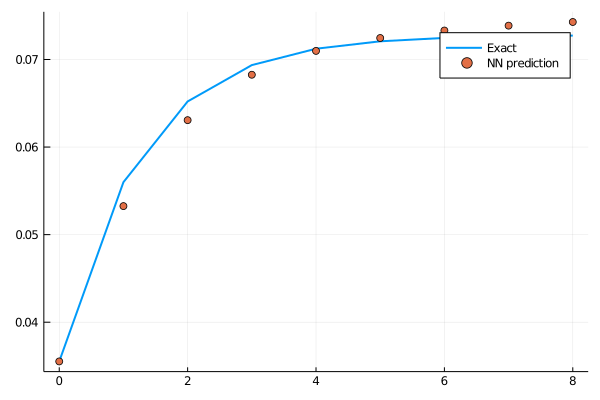

loss: 8.98e-05:  87%|███████████████████████████████████▋     |  ETA: 0:00:07

8.822184f-5

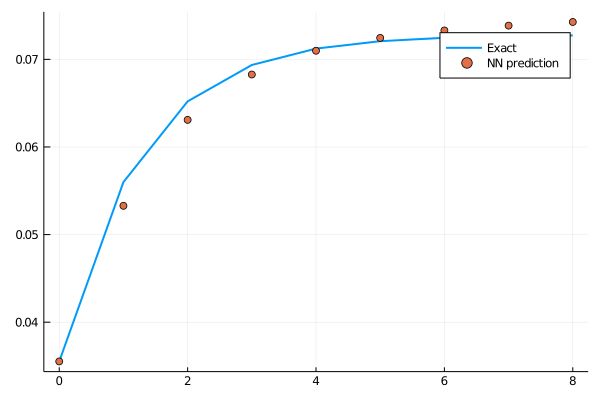

loss: 8.82e-05:  87%|███████████████████████████████████▊     |  ETA: 0:00:07

8.666668f-5

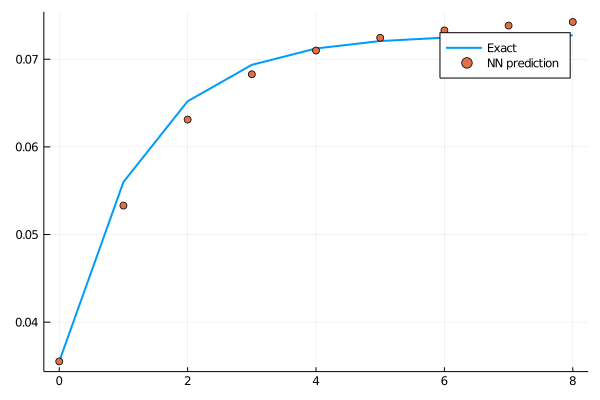

loss: 8.67e-05:  88%|███████████████████████████████████▉     |  ETA: 0:00:07

8.5140135f-5

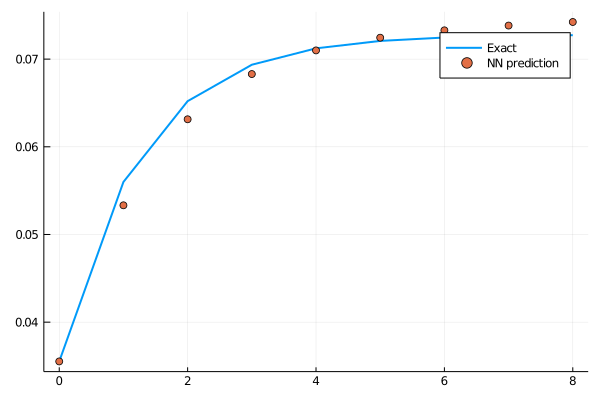

loss: 8.51e-05:  88%|████████████████████████████████████▏    |  ETA: 0:00:07

8.364173f-5

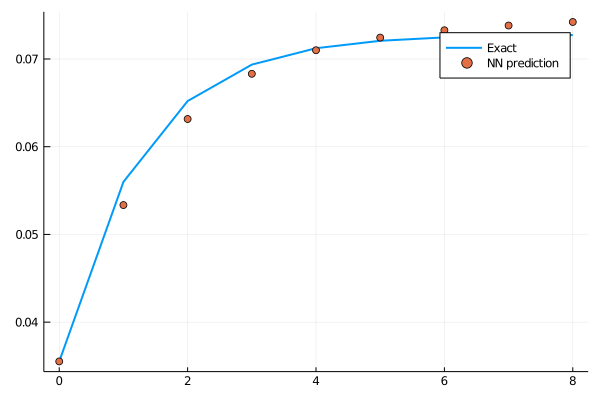

loss: 8.36e-05:  88%|████████████████████████████████████▎    |  ETA: 0:00:06

8.217092f-5

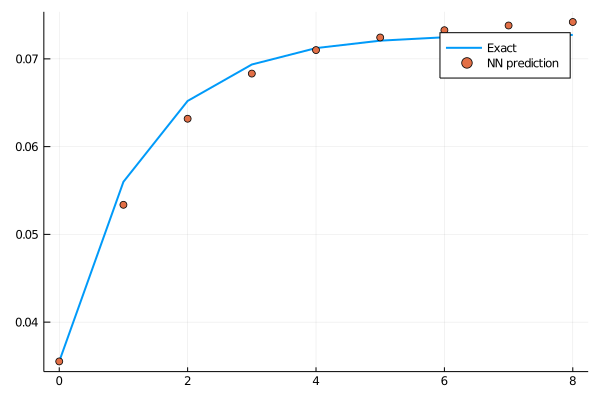

loss: 8.22e-05:  89%|████████████████████████████████████▍    |  ETA: 0:00:06

8.072739f-5

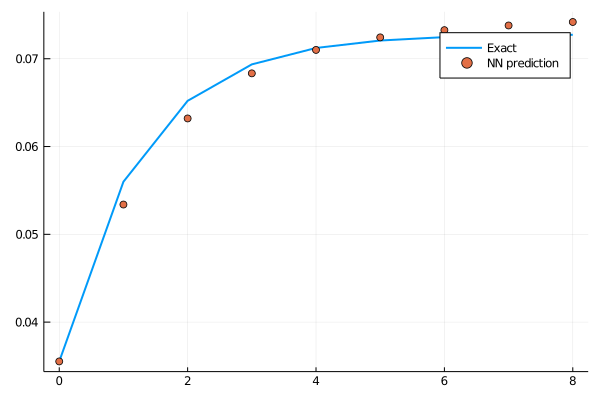

loss: 8.07e-05:  89%|████████████████████████████████████▌    |  ETA: 0:00:06

7.93104f-5

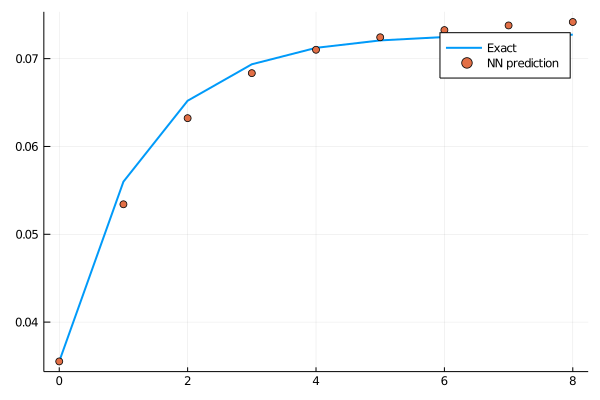

loss: 7.93e-05:  89%|████████████████████████████████████▋    |  ETA: 0:00:06

7.791905f-5

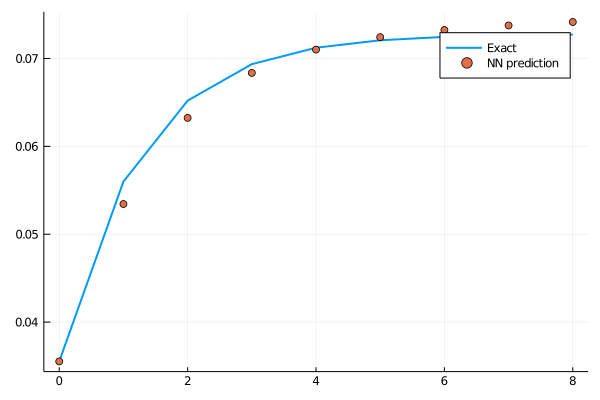

loss: 7.79e-05:  90%|████████████████████████████████████▊    |  ETA: 0:00:06

7.6553566f-5

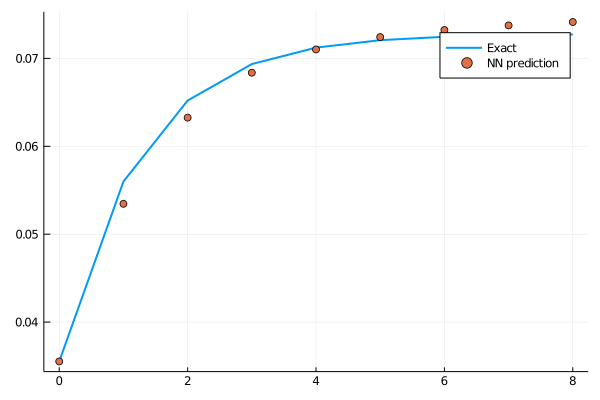

loss: 7.66e-05:  90%|████████████████████████████████████▉    |  ETA: 0:00:06

7.521334f-5

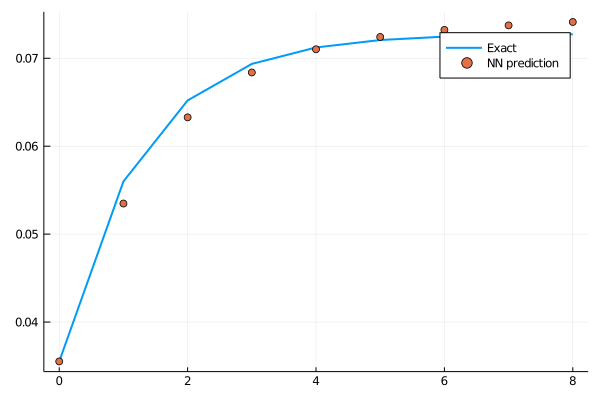

loss: 7.52e-05:  90%|█████████████████████████████████████    |  ETA: 0:00:05

7.3897805f-5

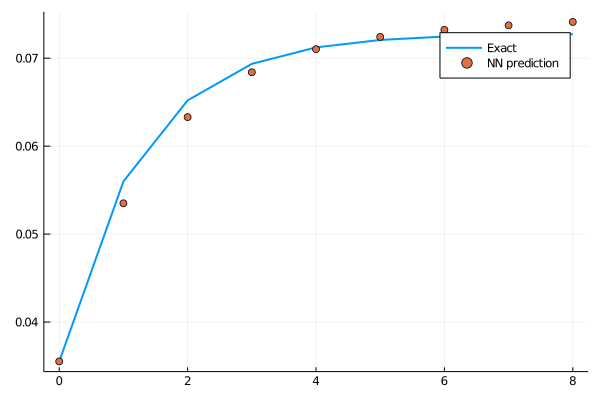

loss: 7.39e-05:  91%|█████████████████████████████████████▏   |  ETA: 0:00:05

7.2606716f-5

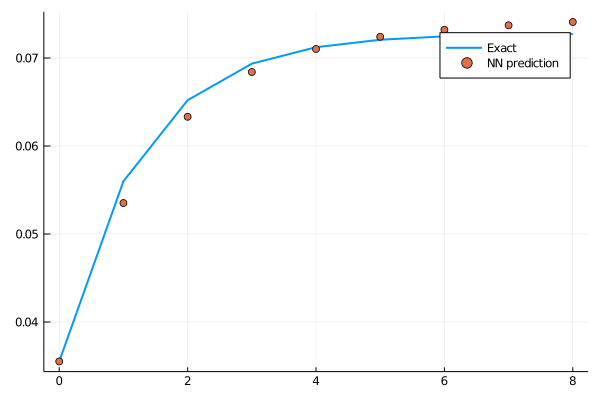

loss: 7.26e-05:  91%|█████████████████████████████████████▎   |  ETA: 0:00:05

7.133976f-5

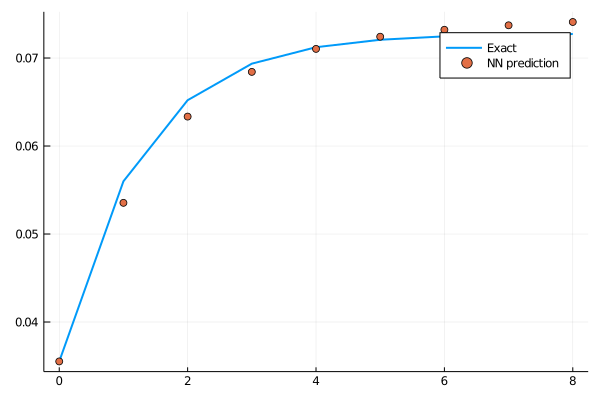

loss: 7.13e-05:  91%|█████████████████████████████████████▍   |  ETA: 0:00:05

7.009837f-5

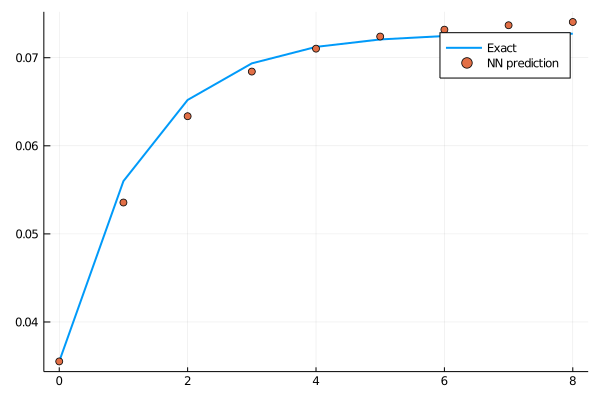

loss: 7.01e-05:  92%|█████████████████████████████████████▌   |  ETA: 0:00:05

6.888475f-5

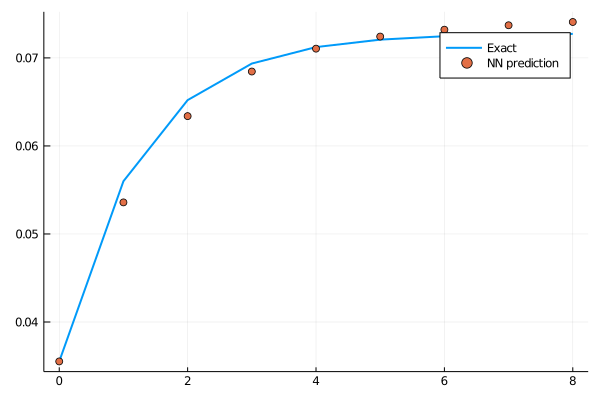

loss: 6.89e-05:  92%|█████████████████████████████████████▊   |  ETA: 0:00:04

6.7705805f-5

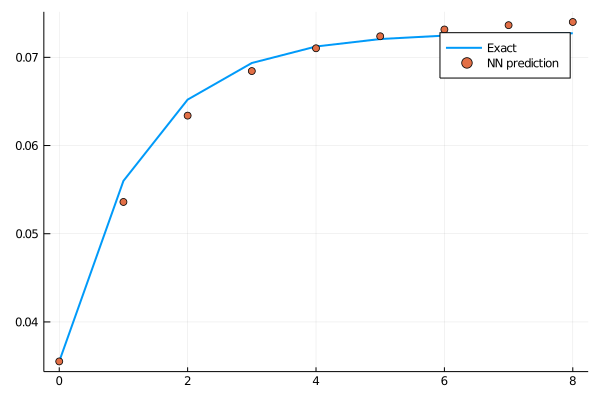

loss: 6.77e-05:  92%|█████████████████████████████████████▉   |  ETA: 0:00:04

6.6580855f-5

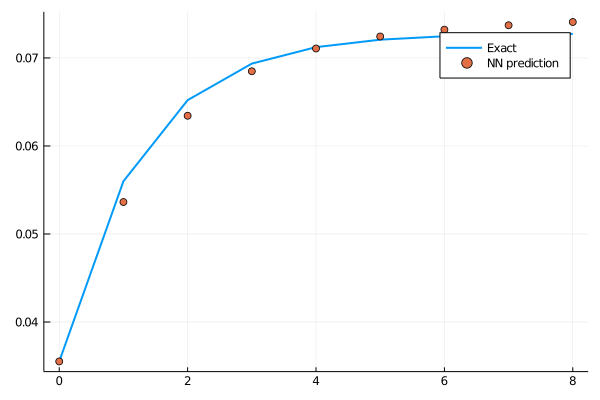

loss: 6.66e-05:  93%|██████████████████████████████████████   |  ETA: 0:00:04

6.556099f-5

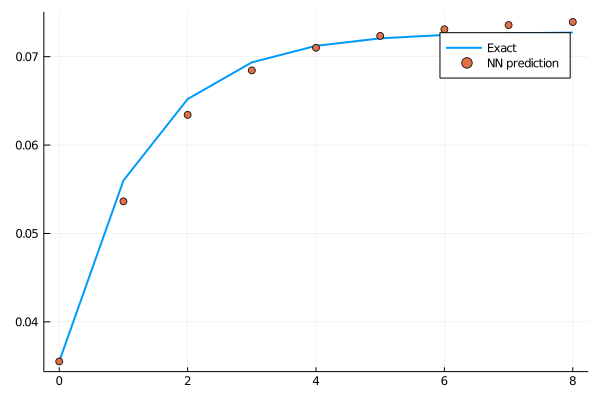

loss: 6.56e-05:  93%|██████████████████████████████████████▏  |  ETA: 0:00:04

6.47836f-5

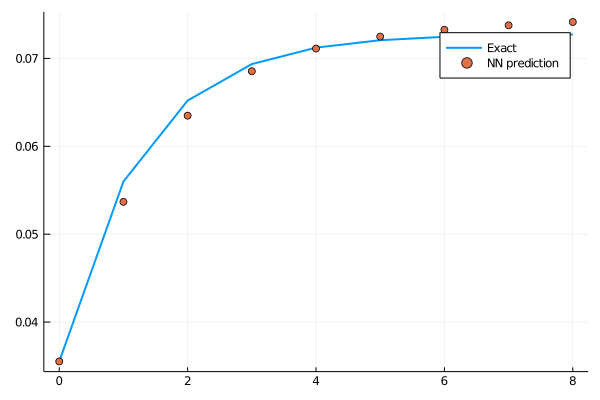

loss: 6.48e-05:  93%|██████████████████████████████████████▎  |  ETA: 0:00:04

6.4622516f-5

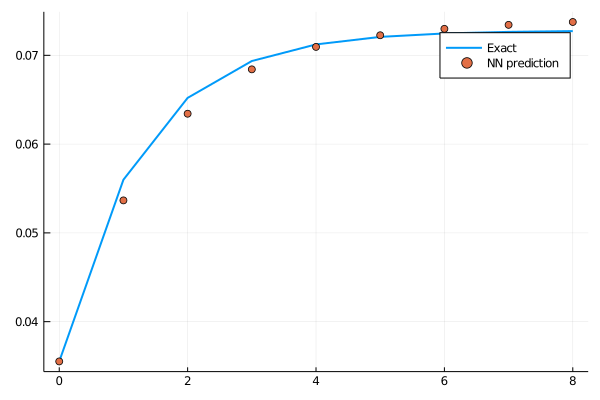

loss: 6.46e-05:  94%|██████████████████████████████████████▍  |  ETA: 0:00:04

6.610258f-5

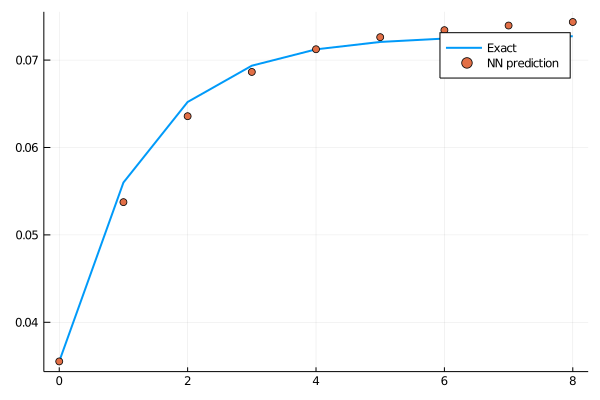

loss: 6.61e-05:  94%|██████████████████████████████████████▌  |  ETA: 0:00:03

7.208315f-5

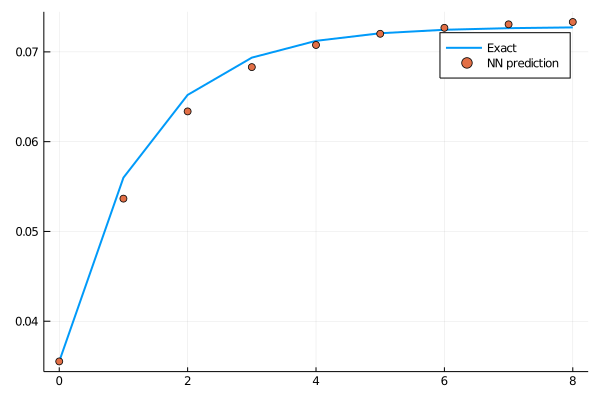

loss: 7.21e-05:  94%|██████████████████████████████████████▋  |  ETA: 0:00:03

9.04841f-5

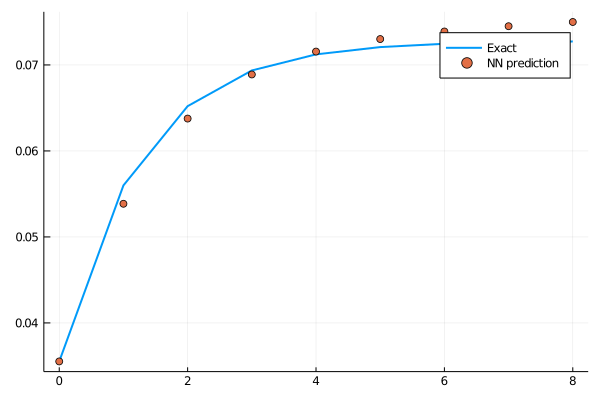

loss: 9.05e-05:  95%|██████████████████████████████████████▊  |  ETA: 0:00:03

0.0001434439f0

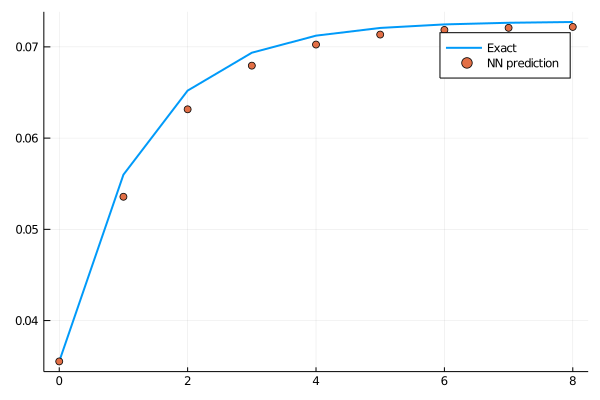

loss: 0.000143:  95%|███████████████████████████████████████  |  ETA: 0:00:03

0.0002876218f0

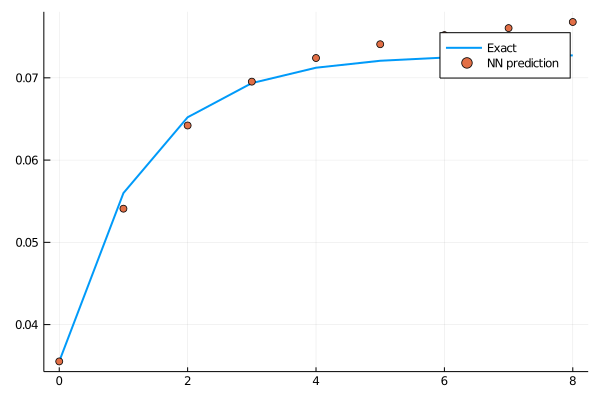

loss: 0.000288:  95%|███████████████████████████████████████▏ |  ETA: 0:00:03

0.00065308536f0

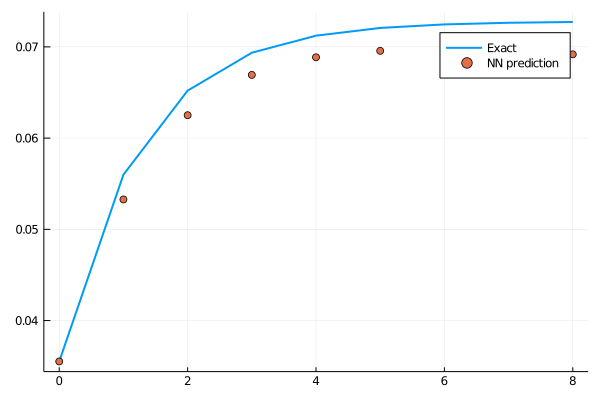

loss: 0.000653:  96%|███████████████████████████████████████▎ |  ETA: 0:00:02

0.0013808875f0

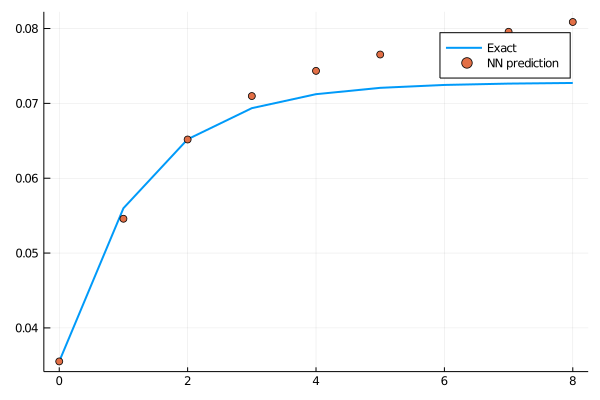

loss: 0.00138:  96%|███████████████████████████████████████▍ |  ETA: 0:00:02

0.0023249814f0

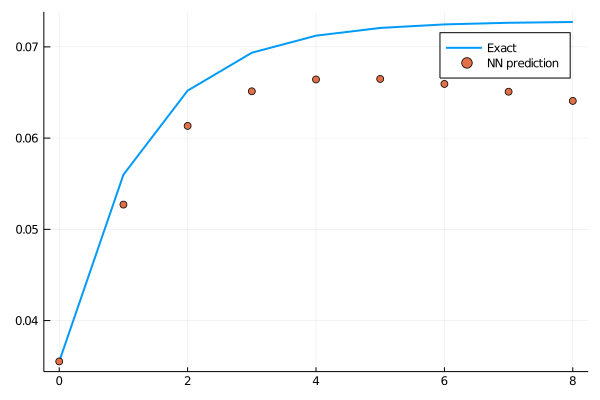

loss: 0.00232:  96%|███████████████████████████████████████▌ |  ETA: 0:00:02

0.0023188433f0

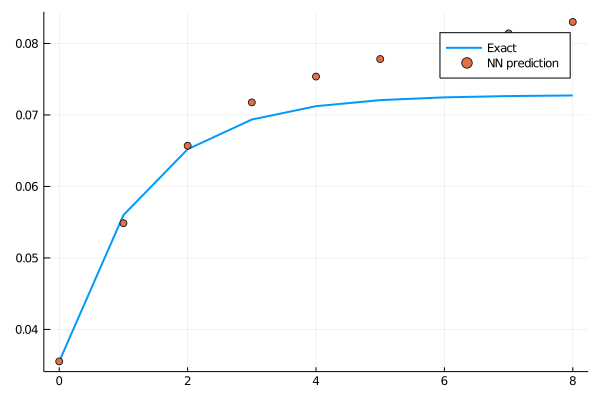

loss: 0.00232:  97%|███████████████████████████████████████▋ |  ETA: 0:00:02

0.0010794423f0

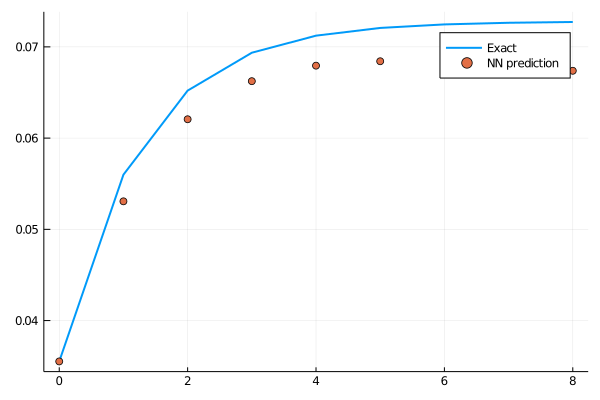

loss: 0.00108:  97%|███████████████████████████████████████▊ |  ETA: 0:00:02

0.0003075136f0

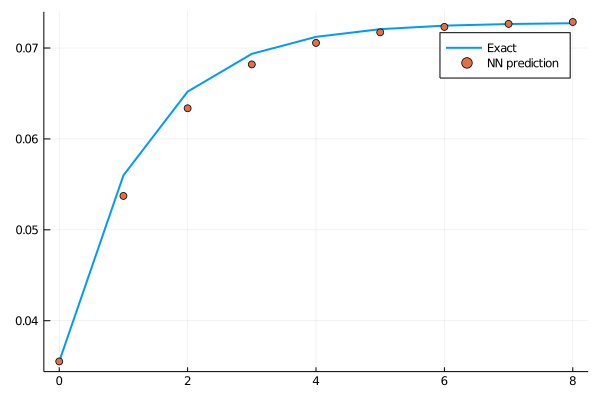

loss: 0.000308:  97%|███████████████████████████████████████▉ |  ETA: 0:00:01

0.0010244726f0

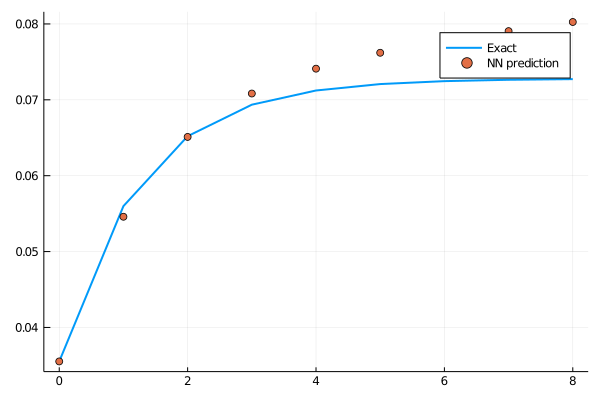

loss: 0.00102:  98%|████████████████████████████████████████ |  ETA: 0:00:01

0.0010998104f0

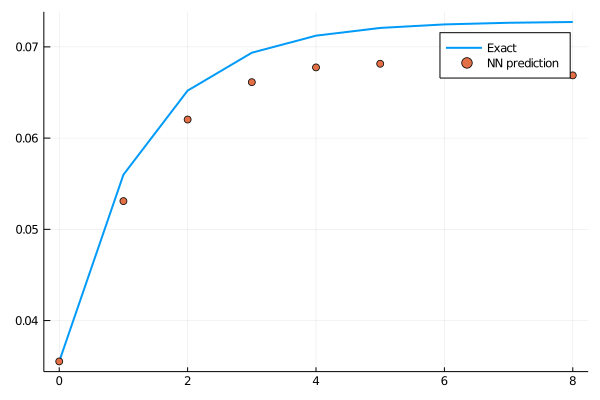

loss: 0.0011:  98%|████████████████████████████████████████▏|  ETA: 0:00:01

0.00019909014f0

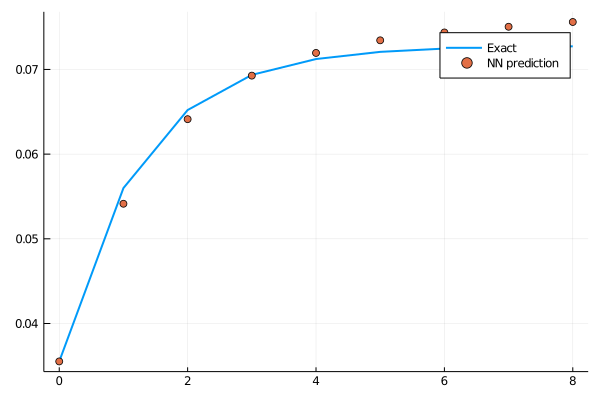

loss: 0.000199:  98%|████████████████████████████████████████▎|  ETA: 0:00:01

0.0005069773f0

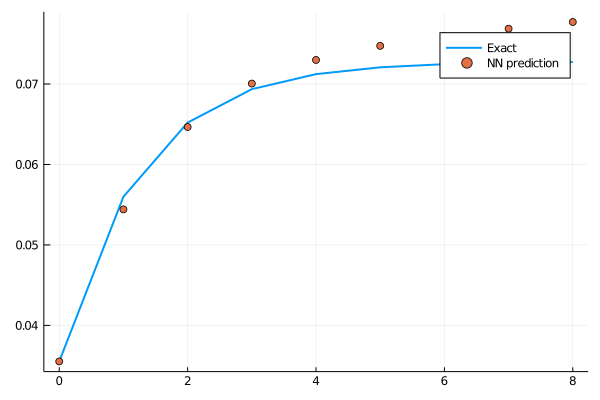

loss: 0.000507:  99%|████████████████████████████████████████▍|  ETA: 0:00:01

0.00086202525f0

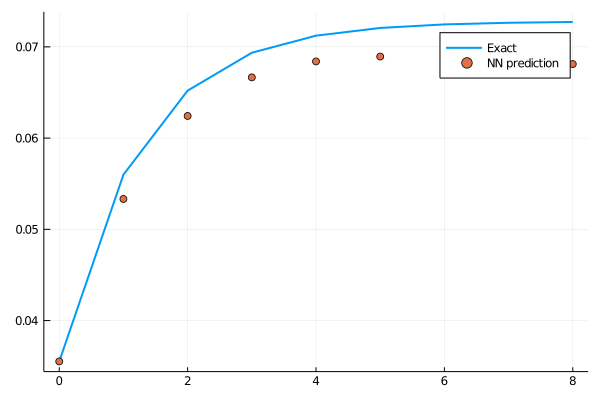

loss: 0.000862:  99%|████████████████████████████████████████▋|  ETA: 0:00:01

0.0002032882f0

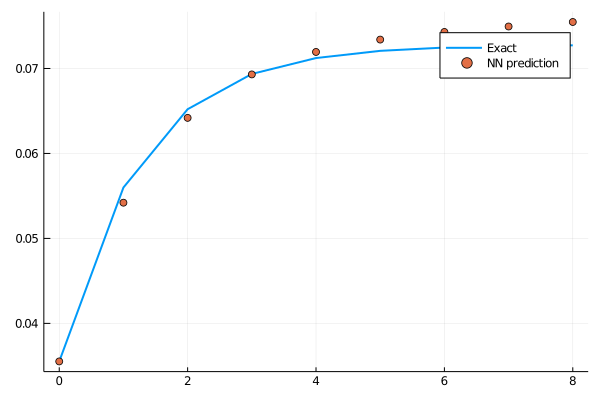

loss: 0.000203:  99%|████████████████████████████████████████▊|  ETA: 0:00:00

0.0003483518f0

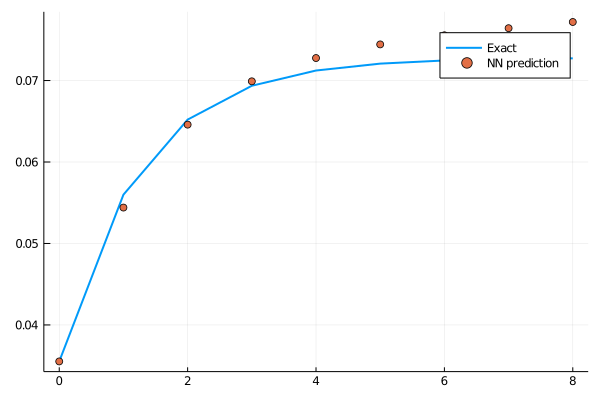

loss: 0.000348: 100%|████████████████████████████████████████▉|  ETA: 0:00:00

0.0004981939f0

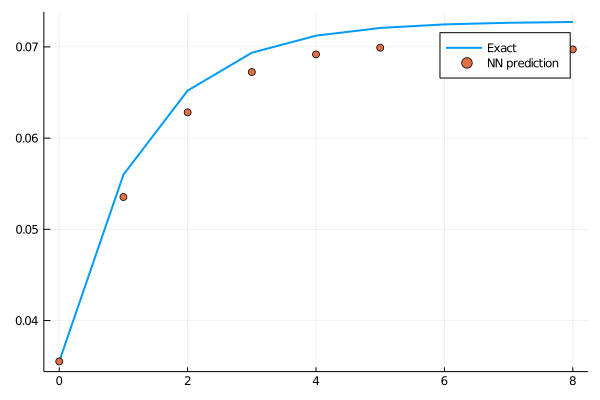

loss: 0.000498: 100%|█████████████████████████████████████████| Time: 0:00:54


6.4622516f-5

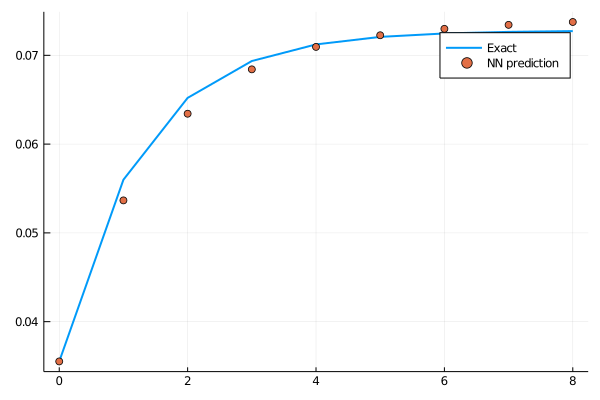

 * Status: failure (reached maximum number of iterations)

 * Candidate solution
    Minimizer: [-1.08e-01, -1.22e-01, -7.16e-02,  ...]
    Minimum:   4.981939e-04

 * Found with
    Algorithm:     ADAM
    Initial Point: [-1.15e-01, -1.27e-01, -7.72e-02,  ...]

 * Convergence measures
    |x - x'|               = NaN ≰ 0.0e+00
    |x - x'|/|x'|          = NaN ≰ 0.0e+00
    |f(x) - f(x')|         = NaN ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = NaN ≰ 0.0e+00
    |g(x)|                 = NaN ≰ 0.0e+00

 * Work counters
    Seconds run:   55  (vs limit Inf)
    Iterations:    300
    f(x) calls:    300
    ∇f(x) calls:   300


In [222]:
res = DiffEqFlux.sciml_train(loss_n_ode, n_ode.p, ADAM(), cb=cb, maxiters=300)

Improve the training results with BFGS optimizer

0.00014048099f0

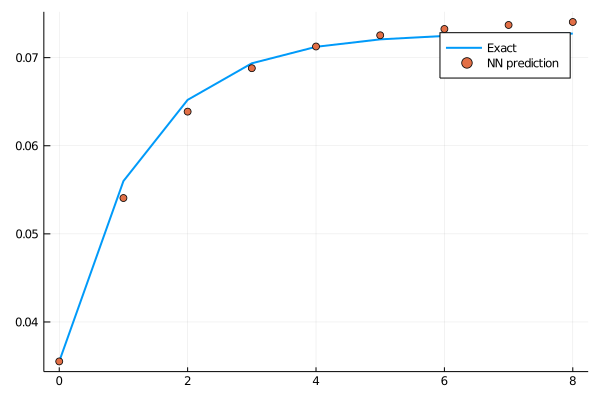

0.00011873269f0

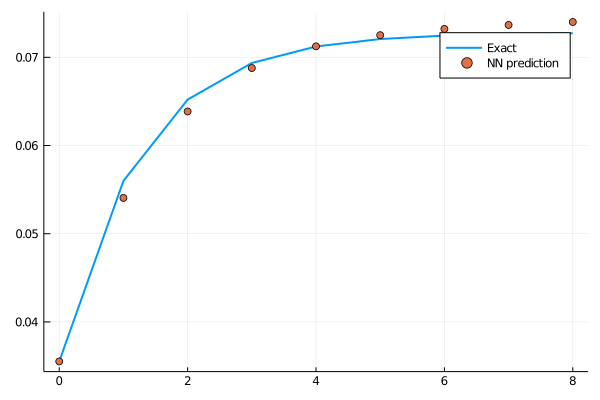

4.543493f-5

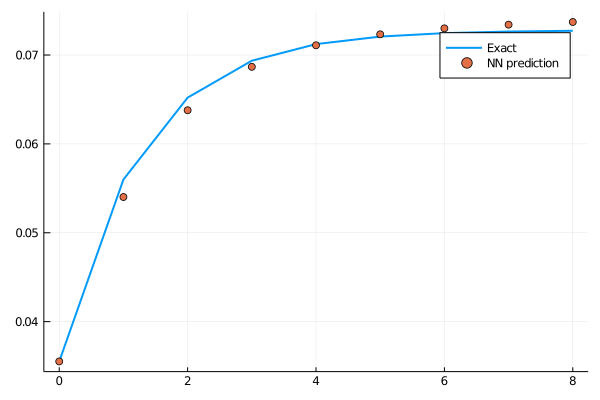

4.5194625f-5

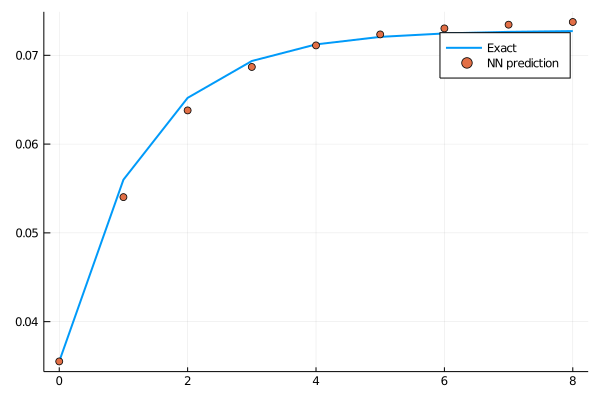

4.5175195f-5

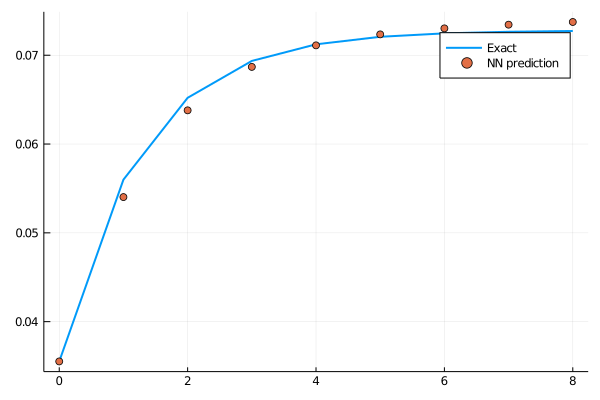

4.516846f-5

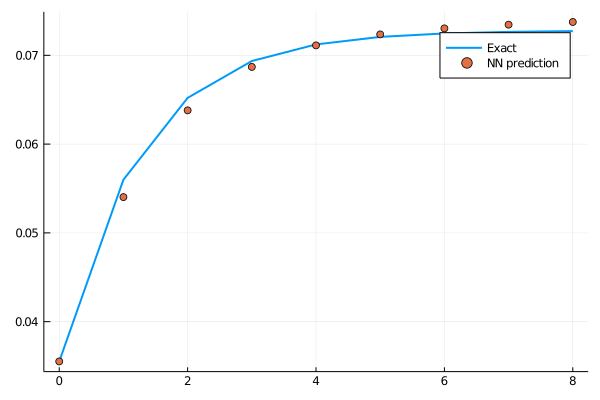

4.5164026f-5

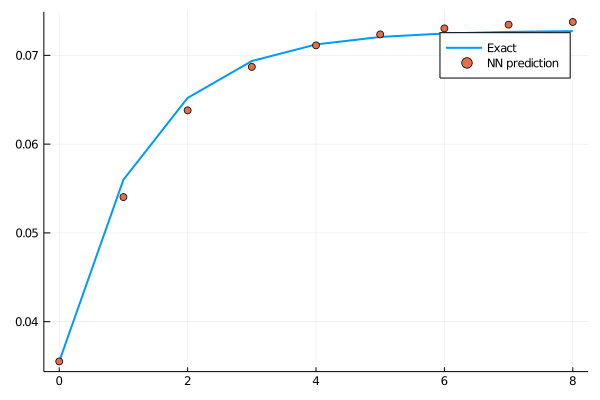

4.516292f-5

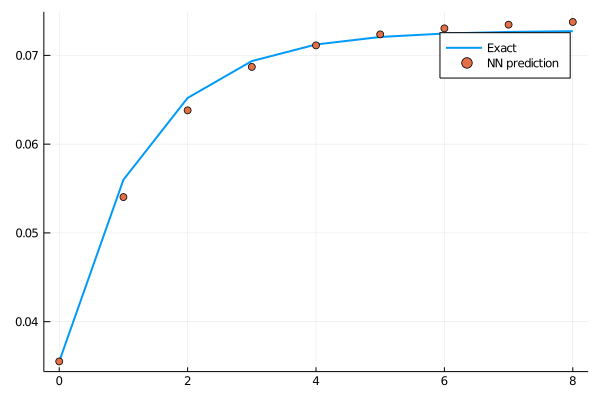

4.516289f-5

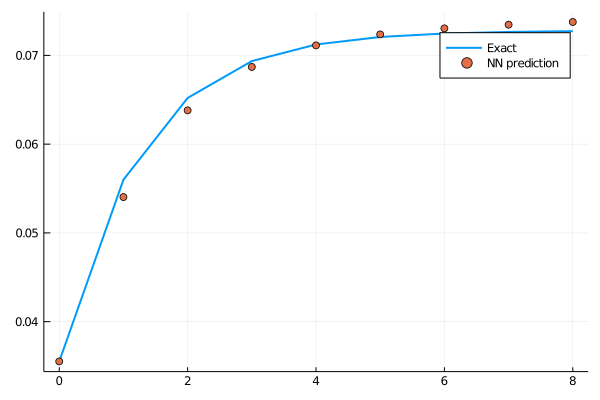

4.516277f-5

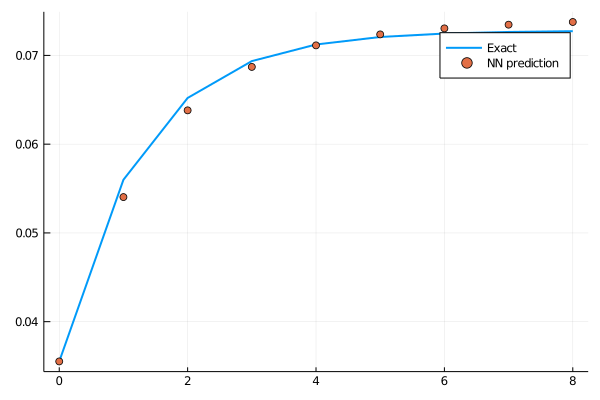

4.5160294f-5

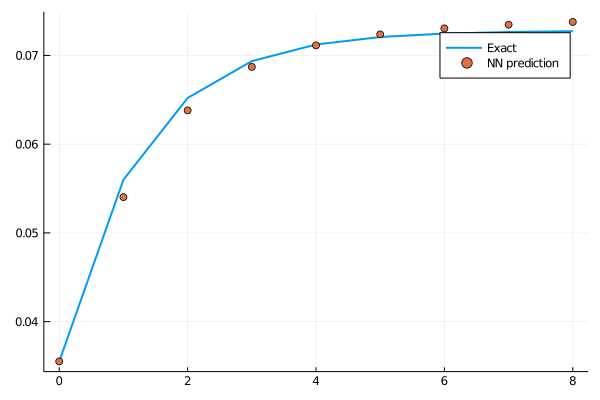

4.513409f-5

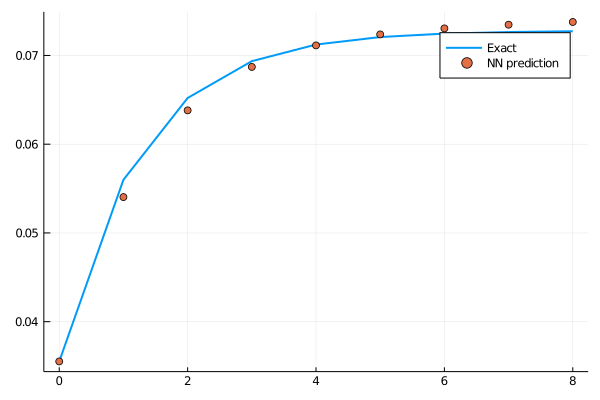

4.485077f-5

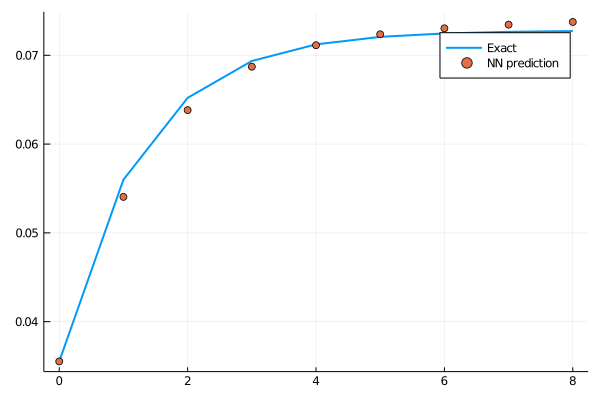

4.2177766f-5

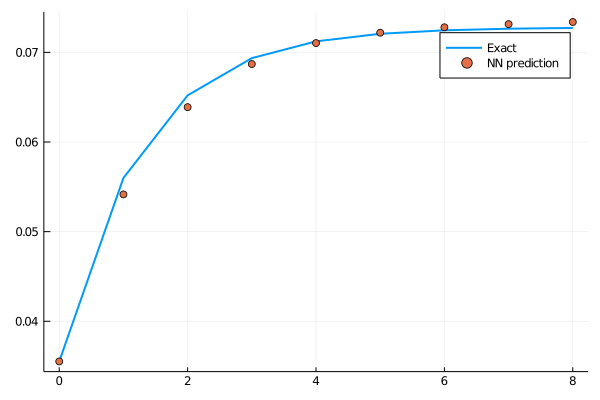

2.9535078f-5

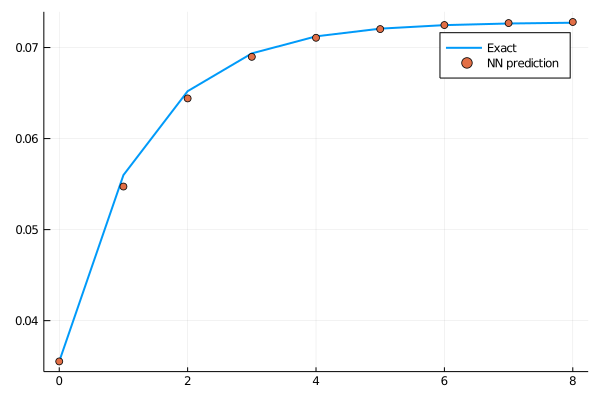

1.0245068f-5

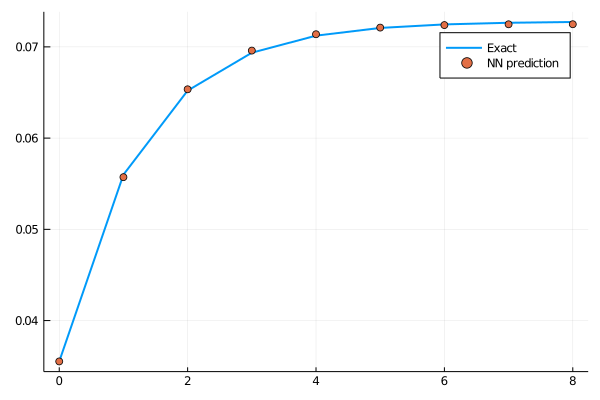

5.9518575f-6

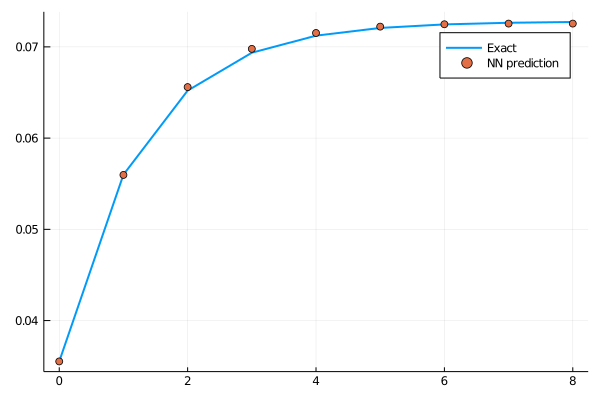

5.3745293f-6

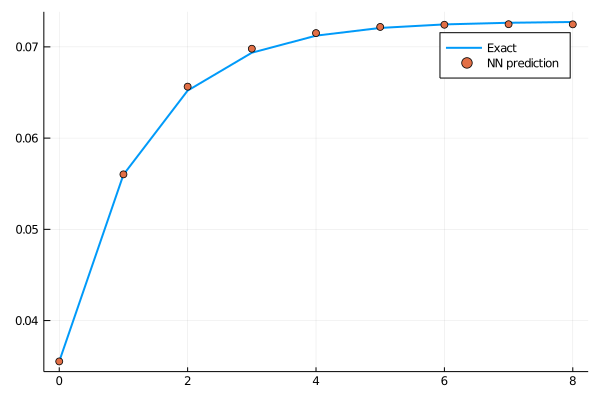

5.331352f-6

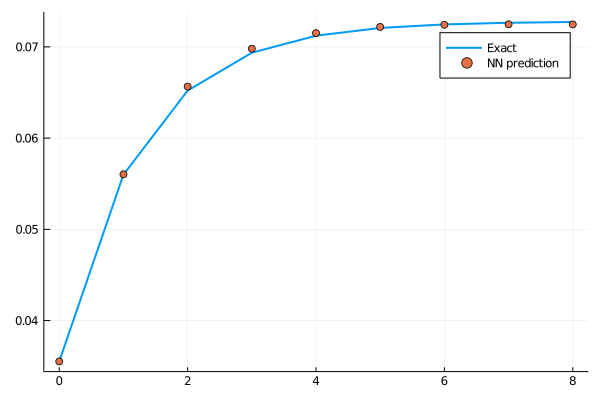

5.328644f-6

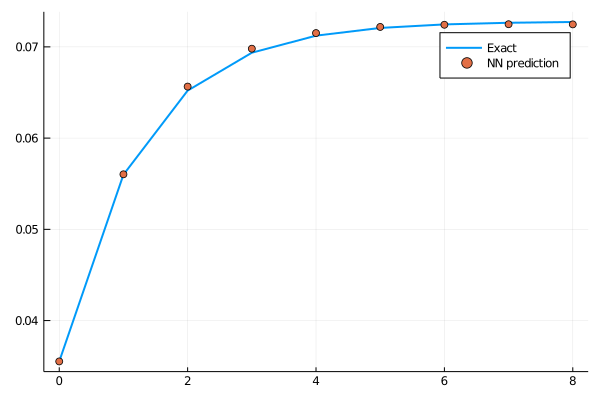

5.3282915f-6

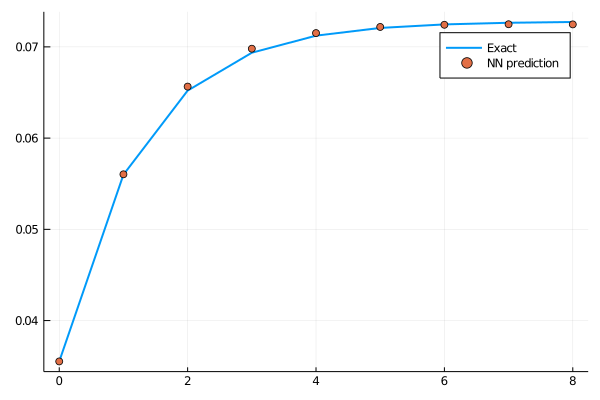

5.328211f-6

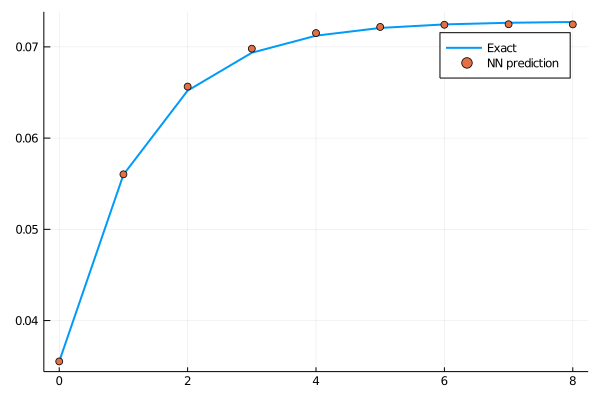

5.3279578f-6

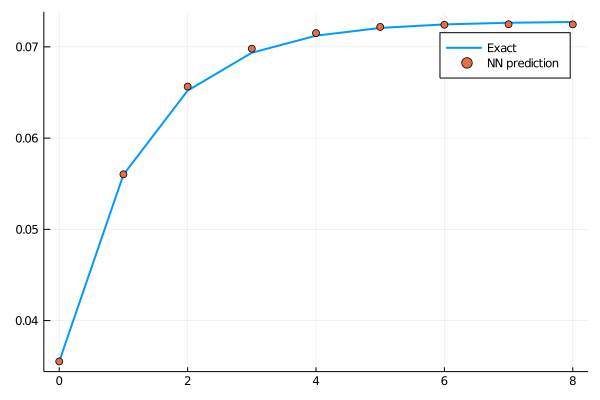

5.3279036f-6

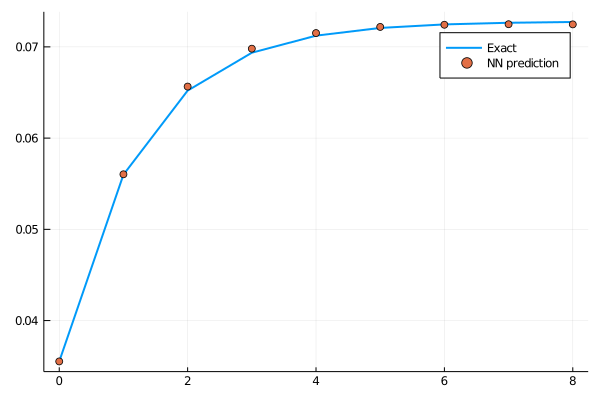

5.3279027f-6

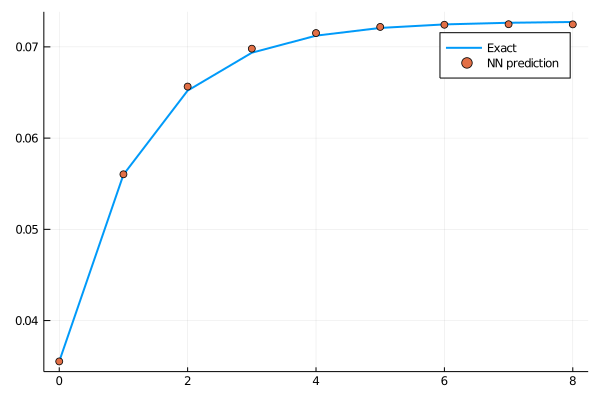

5.32772f-6

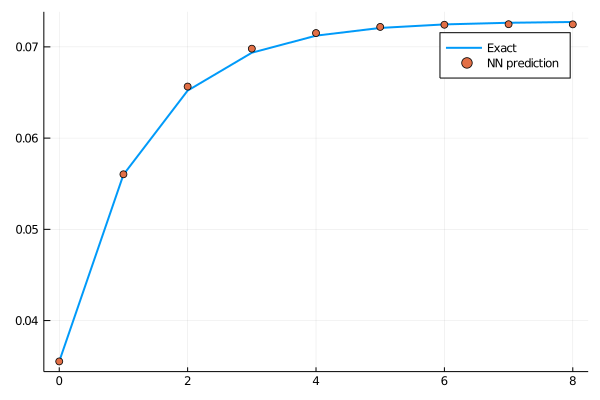

5.3277136f-6

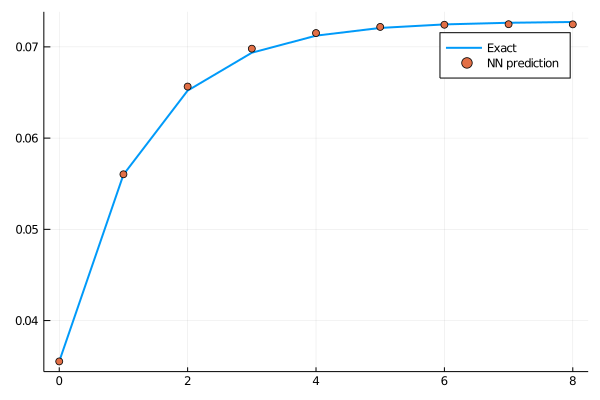

5.3276785f-6

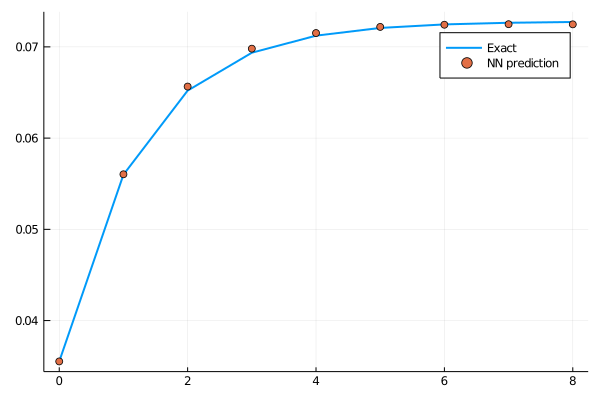

5.325613f-6

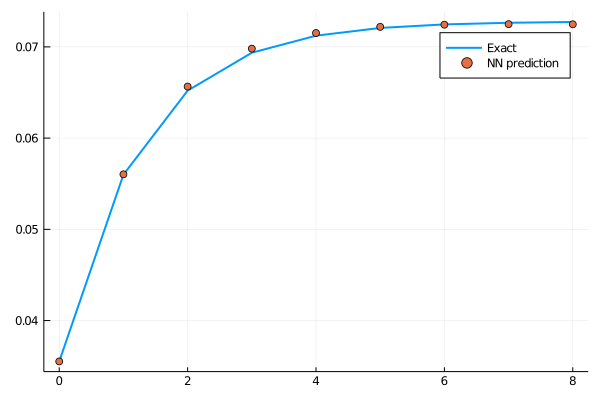

5.3187487f-6

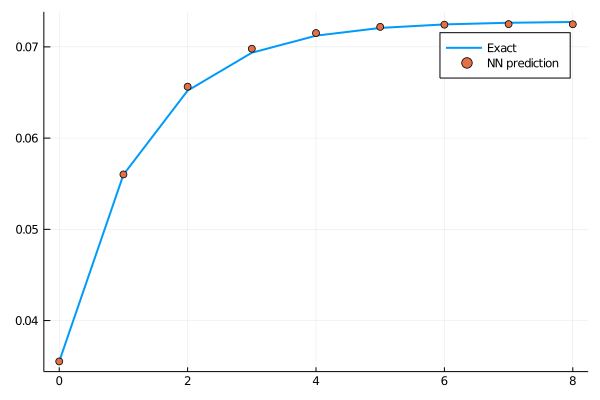

5.3025756f-6

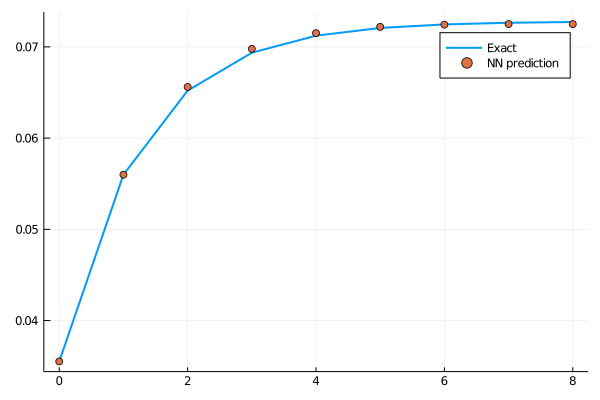

5.293029f-6

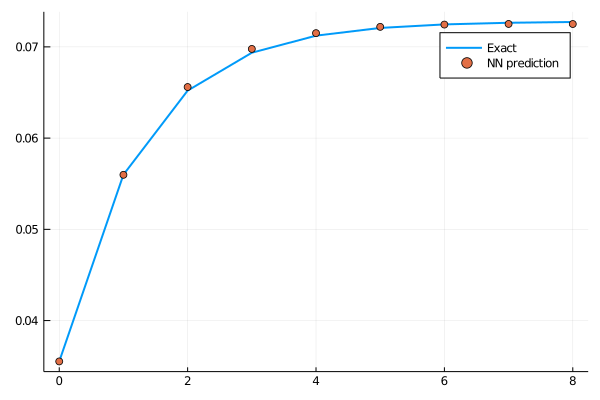

5.2905693f-6

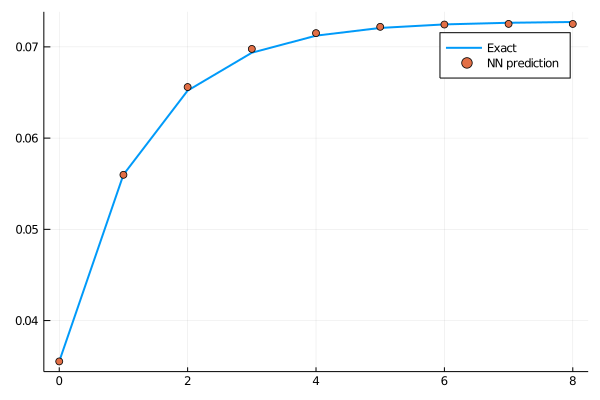

5.2858927f-6

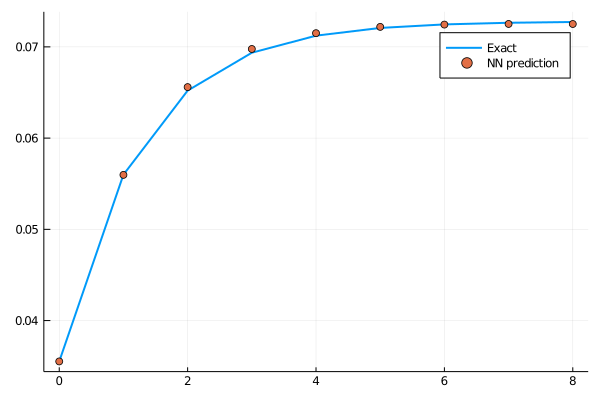

5.2686487f-6

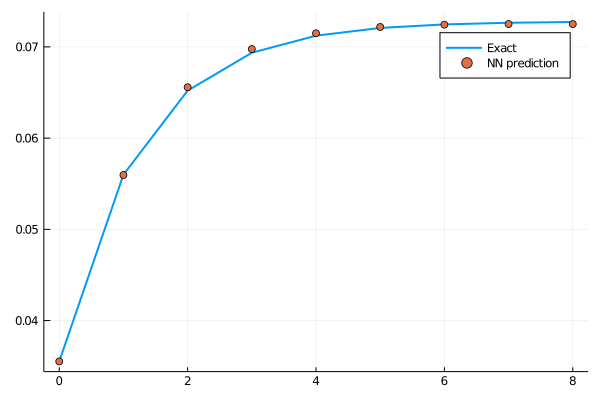

5.2408463f-6

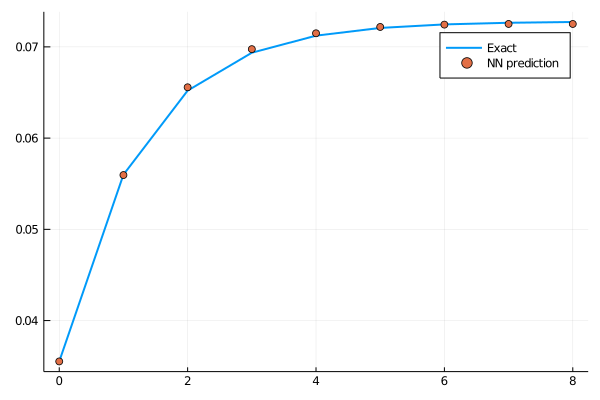

5.231878f-6

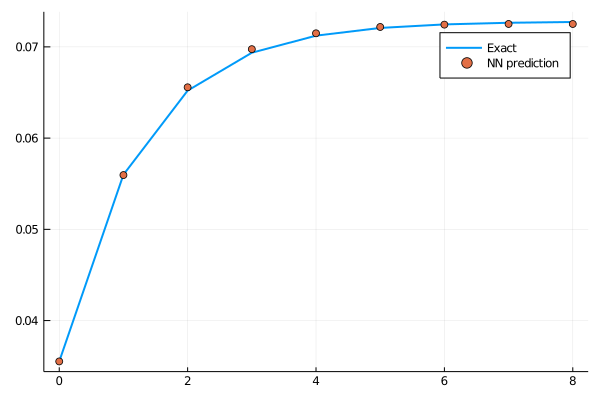

4.993152f-6

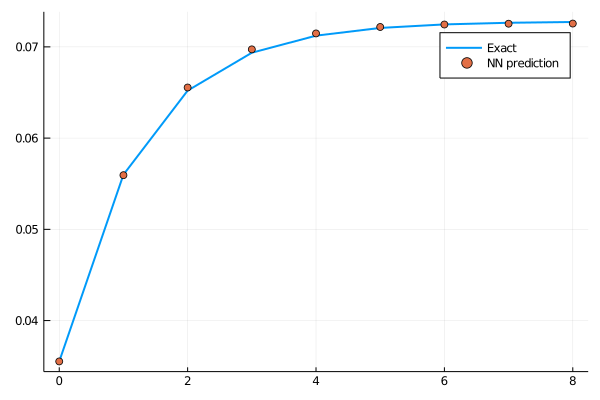

 * Status: failure

 * Candidate solution
    Minimizer: [-1.08e-01, -1.22e-01, -7.16e-02,  ...]
    Minimum:   4.993152e-06

 * Found with
    Algorithm:     L-BFGS
    Initial Point: [-1.08e-01, -1.22e-01, -7.16e-02,  ...]

 * Convergence measures
    |x - x'|               = 2.81e-04 ≰ 0.0e+00
    |x - x'|/|x'|          = 9.54e-04 ≰ 0.0e+00
    |f(x) - f(x')|         = 2.39e-07 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 4.78e-02 ≰ 0.0e+00
    |g(x)|                 = 4.04e-03 ≰ 1.0e-08

 * Work counters
    Seconds run:   28  (vs limit Inf)
    Iterations:    37
    f(x) calls:    201
    ∇f(x) calls:   201


In [224]:
res = DiffEqFlux.sciml_train(loss_n_ode, res.minimizer, LBFGS(), cb=cb, maxiters=200)

PDF at $t=8$

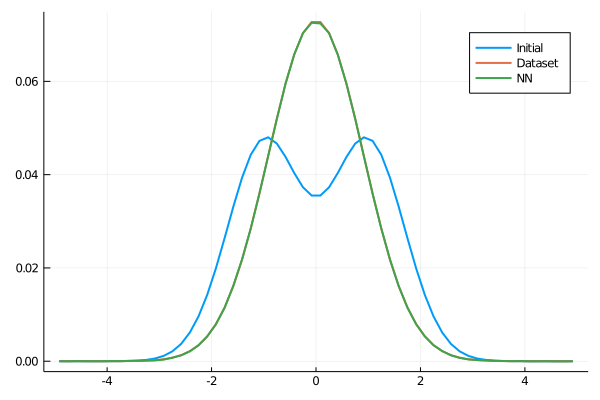

In [232]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,1], lw=2, label="Initial")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,end], lw=2, label="Dataset")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(f0_1D, res.minimizer).u[end], lw=2, label="NN")

Trajectories of PDF

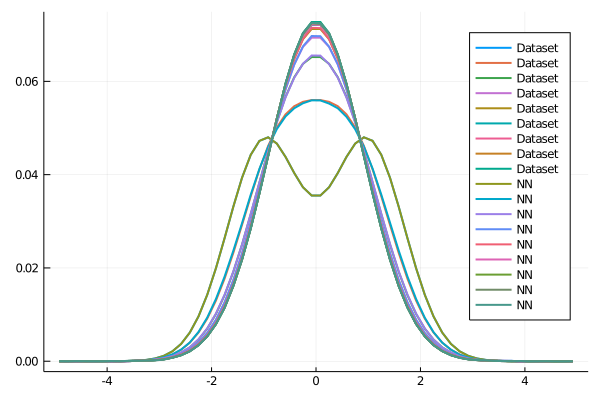

In [234]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,:], lw=2, label="Dataset")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(f0_1D, res.minimizer).u[:], lw=2, label="NN")